---
# **BIOMEDICAL TEXT CLASSIFICATION USING LSTM, GRU AND BAHDANAU ATTENTION**
---

## About Dataset

The dataset contains a medical abstracts dataset (around 12 000 medical abstracts), describing 5 different classes of patient conditions : $neoplasms$, $digestive$ $system$ $diseases$, $nervous$ $system$ $diseases$, $cardiovascular$ $diseases$ and $general$ $pathological$ $conditions$.

The dataset can be used for text classification. It is available via https://github.com/sebischair/Medical-Abstracts-TC-Corpus and also Hugging Face : https://github.com/sebischair/Medical-Abstracts-TC-Corpus.

When citing this medical abstracts dataset in academic papers and theses, please use the following BibTeX entry:

author = {Schopf, Tim and Braun, Daniel and Matthes, Florian},
title = {Evaluating Unsupervised Text Classification: Zero-Shot and Similarity-Based Approaches},
year = {2023},
isbn = {9781450397629},
publisher = {Association for Computing Machinery},
address = {New York, NY, USA}.


This notebook focuses on exploratory data analysis and the model validation phase. Only models that perform satisfactorily during validation will be considered for the subsequent optimization phase. To address class imbalance, we rely on techniques such as SMOTE and class weighting.

# **I. Exploratory data analysis**

In [1]:
import random
import pickle
import time
import re
import wandb
import copy
from google.colab import drive

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data.dataset import ConcatDataset
from torch.utils.data import DataLoader, TensorDataset, Dataset
from torch.nn.utils.rnn import pad_sequence
from transformers import AutoTokenizer, AutoModel
from sklearn.utils.class_weight import compute_class_weight
from torch.utils.data import Dataset, DataLoader, TensorDataset, ConcatDataset
from sklearn.manifold import TSNE
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    balanced_accuracy_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE, BorderlineSMOTE

from tqdm import tqdm
import torch.nn as nn
import imageio
import numpy as np
import pandas as pd
import os
from collections import defaultdict
from collections import Counter

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from scipy.sparse import csr_matrix
from wordcloud import WordCloud
from sklearn.metrics import f1_score, confusion_matrix, balanced_accuracy_score, precision_score, recall_score
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import nltk

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# To ensure reproducibility of the results
SEED = 200
random.seed(SEED)

np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.backends.cudnn.deterministic = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
# Load datasets
data = pd.read_csv('/content/drive/MyDrive/medical_tc_train.csv')
data = data.dropna()

if 'conditional_label' in data.columns:
    data.rename(columns={'conditional_label': 'label'}, inplace=True)

disease_map = {
    1: 'neoplasms',
    2: 'digestive system diseases',
    3: 'nervous system diseases',
    4: 'cardiovascular diseases',
    5: 'general pathological conditions'
}

data['disease'] = data['condition_label'].map(disease_map)
print(data.shape)
print(data.head())
print(data.tail())

(11550, 3)
   condition_label                                   medical_abstract  \
0                5  Tissue changes around loose prostheses. A cani...   
1                1  Neuropeptide Y and neuron-specific enolase lev...   
2                2  Sexually transmitted diseases of the colon, re...   
3                1  Lipolytic factors associated with murine and h...   
4                3  Does carotid restenosis predict an increased r...   

                           disease  
0  general pathological conditions  
1                        neoplasms  
2        digestive system diseases  
3                        neoplasms  
4          nervous system diseases  
       condition_label                                   medical_abstract  \
11545                1  Epirubicin at two dose levels with prednisolon...   
11546                1  Four and a half year follow up of women with d...   
11547                5  Safety of the transbronchial biopsy in outpati...   
11548               

In [ ]:
def count_sentences(text):
    sentences = re.split(r'[.!?]+', str(text))
    sentences = [s.strip() for s in sentences if s.strip()]
    return len(sentences)

data['nb_sentences'] = data['medical_abstract'].apply(count_sentences)

In [ ]:
data.head()

,condition_label,medical_abstract,disease,nb_sentences
0,5,Tissue changes around loose prostheses. A cani...,general pathological conditions,7
1,1,Neuropeptide Y and neuron-specific enolase lev...,neoplasms,12
2,2,"Sexually transmitted diseases of the colon, re...",digestive system diseases,13
3,1,Lipolytic factors associated with murine and h...,neoplasms,8
4,3,Does carotid restenosis predict an increased r...,nervous system diseases,15


In [ ]:
print(data['condition_label'].value_counts())

condition_label
5    3844
1    2530
4    2441
3    1540
2    1195
Name: count, dtype: int64


In [ ]:
data['nb_words'] = data['medical_abstract'].astype(str).str.split().apply(len)
print(data[['medical_abstract', 'nb_words']].head())

                                    medical_abstract  nb_words
0  Tissue changes around loose prostheses. A cani...       156
1  Neuropeptide Y and neuron-specific enolase lev...       187
2  Sexually transmitted diseases of the colon, re...       256
3  Lipolytic factors associated with murine and h...       146
4  Does carotid restenosis predict an increased r...       233


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11550 entries, 0 to 11549
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   condition_label   11550 non-null  int64 
 1   medical_abstract  11550 non-null  object
 2   disease           11550 non-null  object
 3   nb_sentences      11550 non-null  int64 
 4   nb_words          11550 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 451.3+ KB


In [ ]:
min_sentence_count = data['nb_sentences'].min()
max_sentence_count = data['nb_sentences'].max()

print(f"Min number of sentences: {min_sentence_count}")
print(f"Max number of sentences: {max_sentence_count}")

mean_sentence_count = data['nb_sentences'].mean()
print(f"Average number of sentences: {mean_sentence_count:.2f}")

Min number of sentences: 2
Max number of sentences: 54
Average number of sentences: 10.71


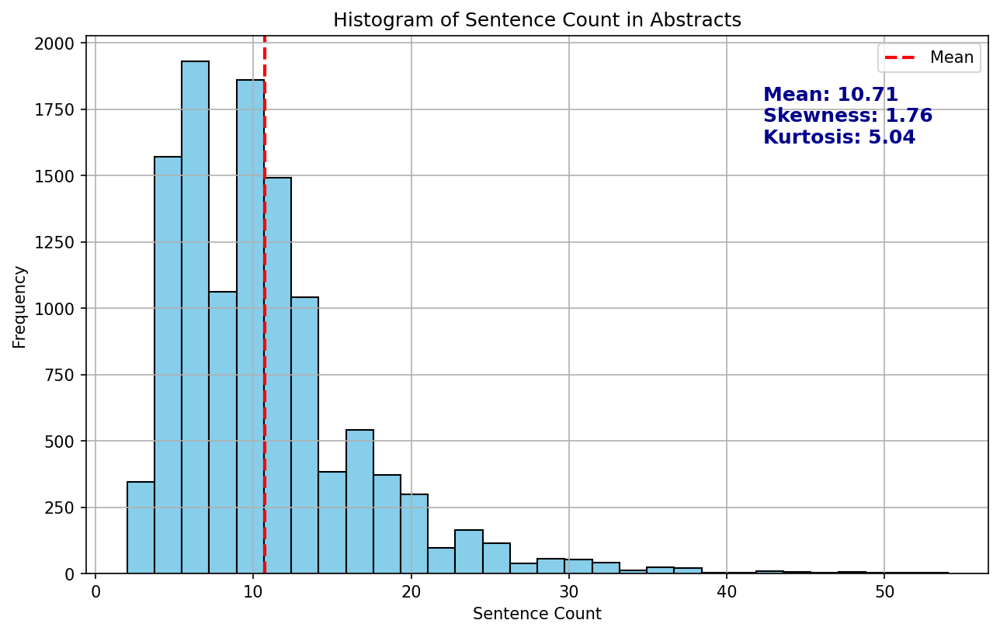

In [ ]:
from scipy.stats import kurtosis, skew

plt.figure(figsize=(10, 6), dpi=150)

# Plot histogram for sentence counts
plt.hist(data['nb_sentences'], bins=30, color='skyblue', edgecolor='black')

plt.title('Histogram of Sentence Count in Abstracts')
plt.xlabel('Sentence Count')
plt.ylabel('Frequency')
plt.grid(True)

# Calculate statistics for sentence counts
mean_sentence_count = data['nb_sentences'].mean()
kurt = kurtosis(data['nb_sentences'], fisher=True)  # excess kurtosis
skw = skew(data['nb_sentences'])

# Draw vertical line for mean
plt.axvline(mean_sentence_count, color='red', linestyle='dashed', linewidth=2, label='Mean')

# Add combined stats text on top right
plt.text(
    plt.xlim()[1] - (plt.xlim()[1] - plt.xlim()[0]) * 0.25,  # 25% from right
    plt.ylim()[1] * 0.8,  # 80% from bottom (near top)
    s=f'Mean: {mean_sentence_count:.2f}\nSkewness: {skw:.2f}\nKurtosis: {kurt:.2f}',
    fontsize=12, color='darkblue', weight='bold',
    ha='left'
)

plt.legend()
plt.show()

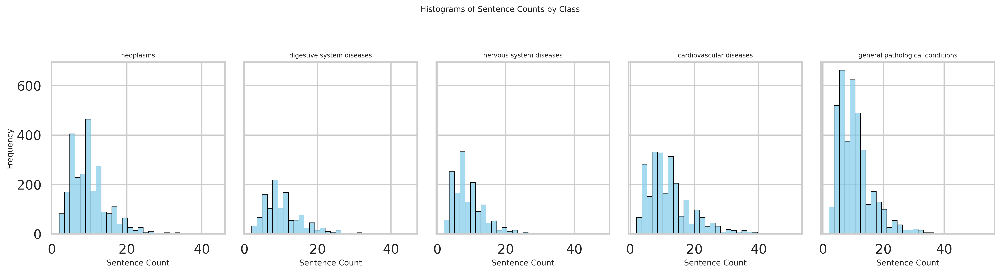

In [ ]:
class_names = dict(
    data[['condition_label', 'disease']]
    .drop_duplicates()
    .sort_values('condition_label')
    .values
)

# Plot settings
sns.set_style("whitegrid")
sns.set_context("talk")

fig, axes = plt.subplots(1, 5, figsize=(18, 5), sharey=True, dpi=300)

# Loop through the first 5 condition labels (assumes they are 1-based: 1–5)
for i, ax in enumerate(axes):
    label = i + 1
    subset = data[data['condition_label'] == label]

    sns.histplot(subset['nb_sentences'], bins=30, color='skyblue', edgecolor='black', ax=ax)
    ax.set_title(f"{class_names[label]}", fontsize=8)
    ax.set_xlabel('Sentence Count', fontsize=10)

    if i == 0:
        ax.set_ylabel('Frequency', fontsize=10)

plt.suptitle("Histograms of Sentence Counts by Class", fontsize=10)
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save the figure
plt.savefig('sentence_count_histograms_by_class.png', dpi=300)
plt.show()

Total sentence count per class:
digestive system diseases: 12980 sentences
nervous system diseases: 14401 sentences
neoplasms: 25377 sentences
cardiovascular diseases: 30126 sentences
general pathological conditions: 40789 sentences


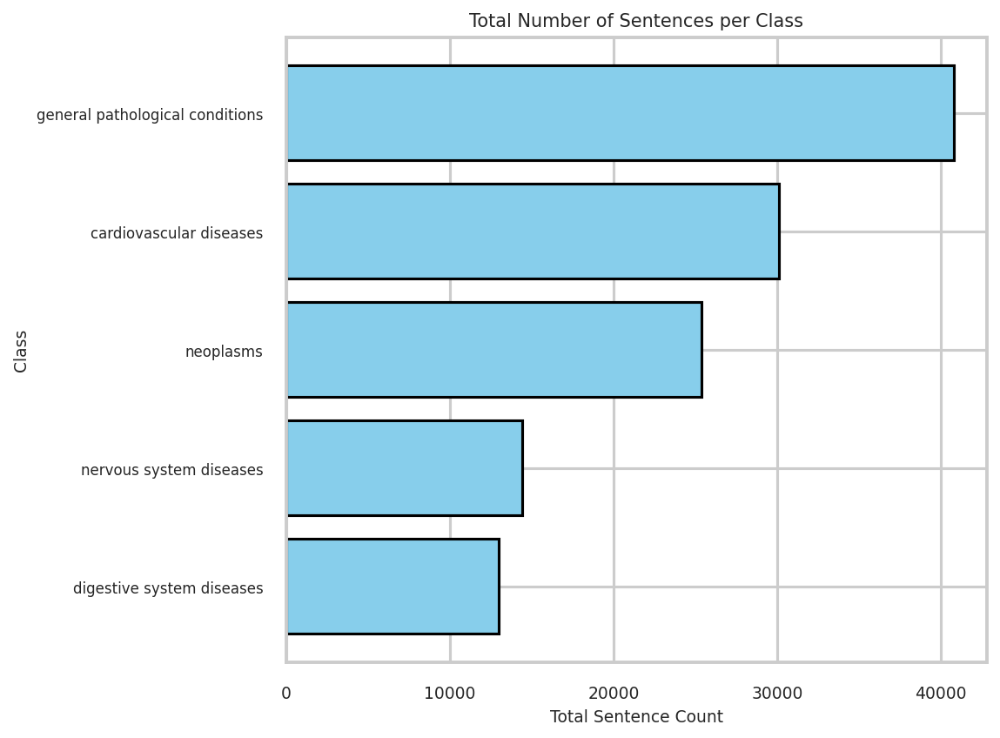

In [ ]:
sentence_count_per_class = data.groupby('disease')['nb_sentences'].sum().reset_index()
sentence_count_per_class = sentence_count_per_class.sort_values('nb_sentences', ascending=True)

# Print per-class sentence counts
print("Total sentence count per class:")
for _, row in sentence_count_per_class.iterrows():
    print(f"{row['disease']}: {row['nb_sentences']} sentences")

plt.figure(figsize=(8, 6), dpi=150)

# Horizontal bar chart
plt.barh(sentence_count_per_class['disease'], sentence_count_per_class['nb_sentences'],
         color='skyblue', edgecolor='black')

plt.title('Total Number of Sentences per Class', fontsize=10)
plt.xlabel('Total Sentence Count', fontsize=9)
plt.ylabel('Class', fontsize=9)

# Reduce tick label font size
plt.xticks(fontsize=9)
plt.yticks(fontsize=8)

plt.tight_layout()
plt.savefig('sentence_count_per_class_horizontal.png', dpi=150)
plt.show()

/tmp/ipython-input-4217730962.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='disease', y='nb_sentences', data=data, palette='pastel')


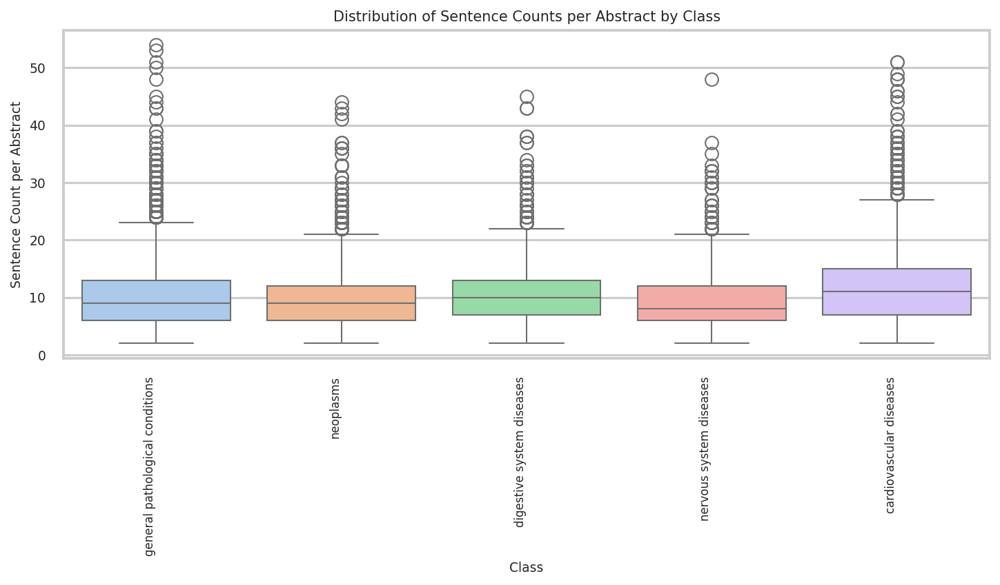

In [ ]:
plt.figure(figsize=(10, 6), dpi=150)

sns.boxplot(x='disease', y='nb_sentences', data=data, palette='pastel')

plt.xticks(rotation=90, ha='right', fontsize=8)      # Smaller x-axis labels
plt.yticks(fontsize=9)                               # Smaller y-axis labels
plt.title('Distribution of Sentence Counts per Abstract by Class', fontsize=10)
plt.xlabel('Class', fontsize=9)
plt.ylabel('Sentence Count per Abstract', fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
min_word_count = data['nb_words'].min()
max_word_count = data['nb_words'].max()

print(f"Min number of words: {min_word_count}")
print(f"Max number of words: {max_word_count}")

mean_word_count = data['nb_words'].mean()
print(f"Average word number : {mean_word_count }")

Min number of words: 24
Max number of words: 596
Average word number : 179.64060606060605


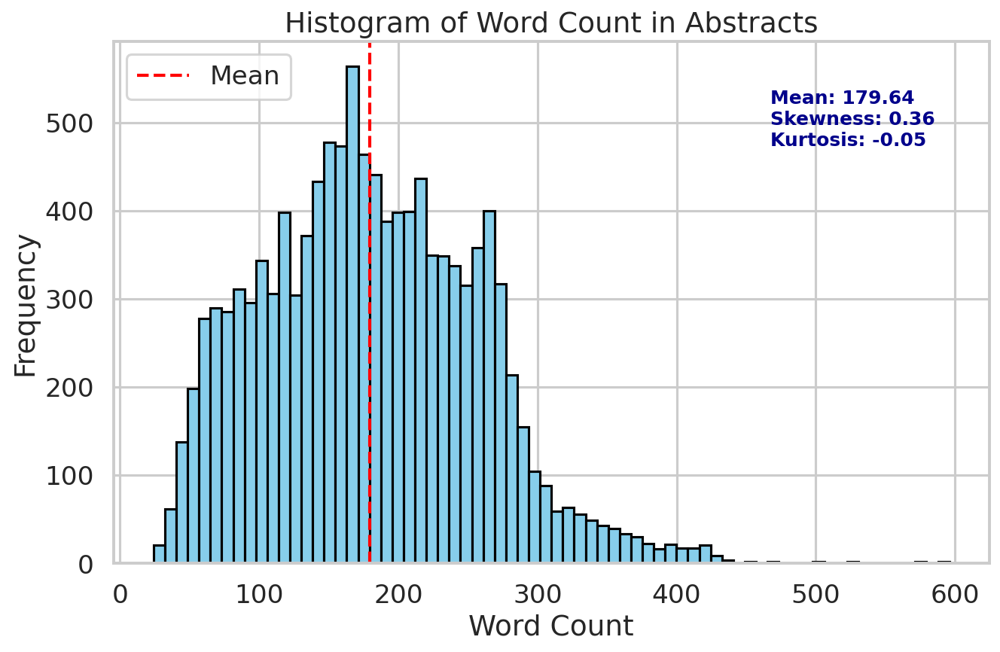

In [ ]:
plt.figure(figsize=(10, 6), dpi=150)

# Plot histogram
plt.hist(data['nb_words'], bins=70, color='skyblue', edgecolor='black')

plt.title('Histogram of Word Count in Abstracts')
plt.xlabel('Word Count')
plt.ylabel('Frequency')
plt.grid(True)

# Calculate statistics
mean_word_count = data['nb_words'].mean()
kurt = kurtosis(data['nb_words'], fisher=True)  # excess kurtosis
skw = skew(data['nb_words'])

# Draw vertical line for mean
plt.axvline(mean_word_count, color='red', linestyle='dashed', linewidth=2, label='Mean')

# Add combined stats text on top right
plt.text(plt.xlim()[1] - (plt.xlim()[1]-plt.xlim()[0]) * 0.25,  # 35% from right
         plt.ylim()[1] * 0.8,  # 90% from bottom (near top)
         s=f'Mean: {mean_word_count:.2f}\nSkewness: {skw:.2f}\nKurtosis: {kurt:.2f}',
         fontsize=12, color='darkblue', weight='bold',
         ha='left')

plt.legend()
plt.show()

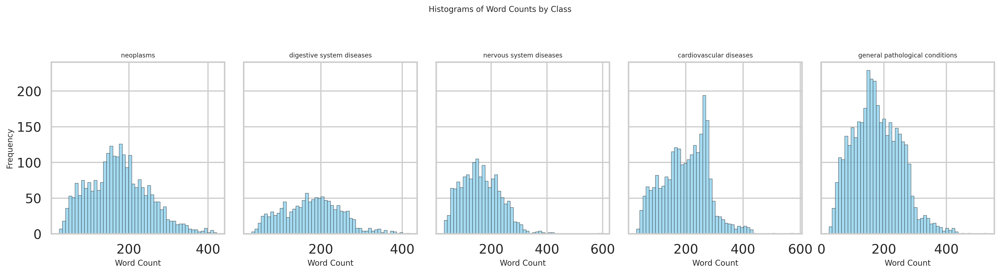

In [ ]:
class_names = dict(
    data[['condition_label', 'disease']]
    .drop_duplicates()
    .sort_values('condition_label')
    .values
)

# Plot settings
sns.set_style("whitegrid")
sns.set_context("talk")

fig, axes = plt.subplots(1, 5, figsize=(18, 5), sharey=True, dpi=300)

# Loop through the first 5 condition labels (assumes they are 1-based: 1–5)
for i, ax in enumerate(axes):
    label = i + 1
    subset = data[data['condition_label'] == label]

    sns.histplot(subset['nb_words'], bins=50, color='skyblue', edgecolor='black', ax=ax)
    ax.set_title(f"{class_names[label]}", fontsize=8)
    ax.set_xlabel('Word Count', fontsize=10)

    if i == 0:
        ax.set_ylabel('Frequency', fontsize=10)

plt.suptitle("Histograms of Word Counts by Class", fontsize=10)
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Save the figure
plt.savefig('word_count_histograms_by_class.png', dpi=300)
plt.show()

Total word count per class:
digestive system diseases: 213502 words
nervous system diseases: 251541 words
neoplasms: 440660 words
cardiovascular diseases: 488529 words
general pathological conditions: 680617 words


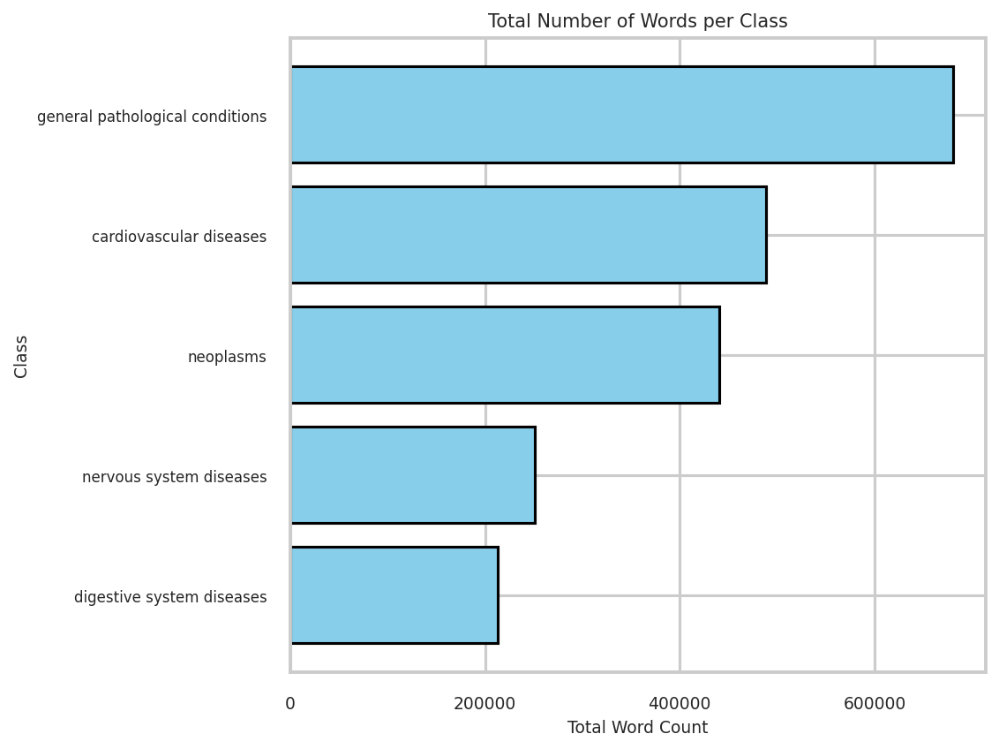

In [ ]:
word_count_per_class = data.groupby('disease')['nb_words'].sum().reset_index()
word_count_per_class = word_count_per_class.sort_values('nb_words', ascending=True)

# Print per-class word counts
print("Total word count per class:")
for _, row in word_count_per_class.iterrows():
    print(f"{row['disease']}: {row['nb_words']} words")

plt.figure(figsize=(8, 6), dpi=150)

# Horizontal bar chart
plt.barh(word_count_per_class['disease'], word_count_per_class['nb_words'],
         color='skyblue', edgecolor='black')

plt.title('Total Number of Words per Class', fontsize=10)
plt.xlabel('Total Word Count', fontsize=9)
plt.ylabel('Class', fontsize=9)

# Reduce tick label font size
plt.xticks(fontsize=9)
plt.yticks(fontsize=8)

plt.tight_layout()
plt.savefig('word_count_per_class_horizontal.png', dpi=150)
plt.show()

/tmp/ipython-input-892777317.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='disease', y='nb_words', data=data, palette='pastel')


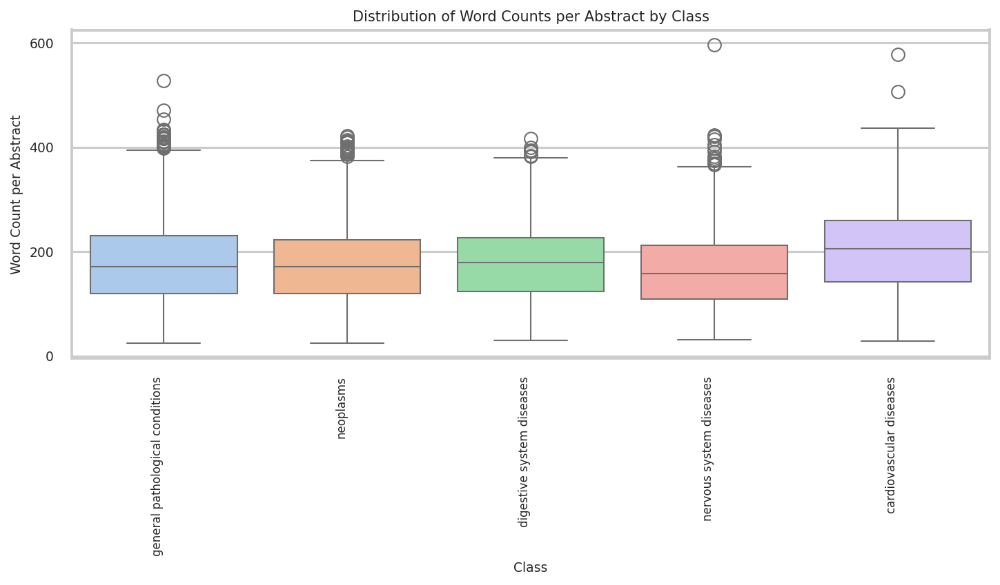

In [ ]:
plt.figure(figsize=(10, 6), dpi=150)

sns.boxplot(x='disease', y='nb_words', data=data, palette='pastel')

plt.xticks(rotation=90, ha='right', fontsize=8)      # Smaller x-axis labels
plt.yticks(fontsize=9)                               # Smaller y-axis labels
plt.title('Distribution of Word Counts per Abstract by Class', fontsize=10)
plt.xlabel('Class', fontsize=9)
plt.ylabel('Word Count per Abstract', fontsize=9)

plt.tight_layout()
plt.show()

In [ ]:
# Download NLTK resources
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

In [ ]:
def preprocess_text(text):
    """
    Preprocesses the input text by lowercasing, tokenizing, removing stop words, and lemmatizing.

    Args:
        text: A string containing the text to be preprocessed.

    Returns:
        A string containing the processed text with stopwords removed and words lemmatized.
    """
    if pd.isna(text):
        return ""
    text = text.lower()
    words = text.split()
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop_words]
    return " ".join(words)

def generate_wordcloud(word_counts, class_label, ax):
    """
    Generates and displays a word cloud for the given word frequencies associated with a specific class label.

    Args:
        word_counts (dict): A dictionary where keys are words and values are their corresponding frequencies.
        class_label (int or str): The class label for which the word cloud is being generated.
        ax (matplotlib.axes.Axes): The axes on which the word cloud will be displayed.

    Returns:
        None
    """
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)
    ax.imshow(wordcloud, interpolation='bilinear')
    ax.axis('off')
    ax.set_title(f'Class {class_label}')

In [ ]:
tqdm.pandas(desc="Preprocessing Text")
data['abstract'] = data['medical_abstract'].astype(str).progress_apply(preprocess_text)

vectorizer = TfidfVectorizer(max_features=5000)
X_sparse = vectorizer.fit_transform(data['abstract'])

tfidf_df = pd.DataFrame.sparse.from_spmatrix(X_sparse, columns=vectorizer.get_feature_names_out())
top_words_per_abstract = np.argsort(-X_sparse.toarray(), axis=1)[:, :50]  # Get indices of top 50 words

feature_names = np.array(vectorizer.get_feature_names_out())
top_words_per_abstract = [[feature_names[idx] for idx in row] for row in top_words_per_abstract]

data['Top_Relevant_Words'] = top_words_per_abstract
data.to_csv("dataset1.csv", index=False)  # Save to disk

print(data[['Top_Relevant_Words']].head())

Preprocessing Text: 100%|██████████| 11550/11550 [00:09<00:00, 1252.99it/s]


                                  Top_Relevant_Words
0  [loosening, canine, biologic, model, activity,...
1  [pheochromocytoma, benign, malignant, pmol, pl...
2  [homosexual, hiv, anorectal, aid, colorectal, ...
3  [cachexia, inducing, kd, weight, factor, murin...
4  [restenosis, stroke, carotid, 50, symptoms, la...


In [ ]:
relevant_words_by_class = {}
data['label'] = data['condition_label'] - 1

for label in data['label'].unique():

    class_data = data[data['label'] == label]

    class_top_words = class_data['Top_Relevant_Words'].explode().value_counts()
    relevant_words_by_class[label] = class_top_words

for label, words in relevant_words_by_class.items():
    print(f"Top relevant words for class {label}:")
    print(words.head(10))
    print("\n")

Top relevant words for class 4:
Top_Relevant_Words
patient      1677
year         1191
yielded      1142
years        1093
yield        1077
yet          1035
yag           884
xenograft     819
xanthine      769
wt            729
Name: count, dtype: int64


Top relevant words for class 0:
Top_Relevant_Words
patient    1026
year        808
tumor       783
cell        757
yielded     715
years       710
yield       706
yet         683
cancer      600
yag         593
Name: count, dtype: int64


Top relevant words for class 1:
Top_Relevant_Words
patient      610
year         324
yielded      310
years        302
yield        301
yet          288
yag          250
disease      241
xenograft    229
xanthine     215
Name: count, dtype: int64


Top relevant words for class 2:
Top_Relevant_Words
patient      689
yielded      554
year         549
yield        528
years        513
yet          508
yag          434
xenograft    393
xanthine     363
wt           349
Name: count, dtype: int64


Top 

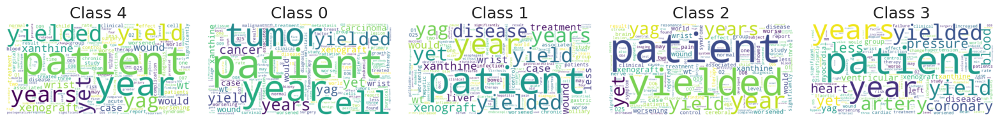

In [ ]:
selected_labels = list(relevant_words_by_class.keys())[:5]

fig, axes = plt.subplots(1, 5, figsize=(16, 8))

for ax, label in zip(axes.flatten(), selected_labels):
    generate_wordcloud(relevant_words_by_class[label], label, ax)

plt.tight_layout()
plt.show()

In [ ]:
data.to_csv("data1.csv", index=False)

# **II. Mahcine Learning Models : Linear SVM and RF**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.svm import SVC
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import classification_report, balanced_accuracy_score
from xgboost import XGBClassifier

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/medical_tc_train.csv')
data = data.dropna()
data.head()

,condition_label,medical_abstract
0,5,Tissue changes around loose prostheses. A cani...
1,1,Neuropeptide Y and neuron-specific enolase lev...
2,2,"Sexually transmitted diseases of the colon, re..."
3,1,Lipolytic factors associated with murine and h...
4,3,Does carotid restenosis predict an increased r...


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11550 entries, 0 to 11549
Data columns (total 2 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   condition_label   11550 non-null  int64 
 1   medical_abstract  11550 non-null  object
dtypes: int64(1), object(1)
memory usage: 180.6+ KB


In [ ]:
data["label"] = data["condition_label"] - 1

X = data["medical_abstract"].values
y = data["label"].values

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


print(f"Training set: {len(X_train)} samples")
print(f"Validation set: {len(X_val)} samples")
print(f"Test set: {len(X_test)} samples")

Training set: 8085 samples
Validation set: 1732 samples
Test set: 1733 samples


In [ ]:
print("Class distribution in Training set:")
print(pd.Series(y_train).value_counts().sort_index())

print("\nClass distribution in Validation set:")
print(pd.Series(y_val).value_counts().sort_index())

print("\nClass distribution in Test set:")
print(pd.Series(y_test).value_counts().sort_index())

Class distribution in Training set:
0    1801
1     863
2    1071
3    1671
4    2679
Name: count, dtype: int64

Class distribution in Validation set:
0    372
1    182
2    241
3    379
4    558
Name: count, dtype: int64

Class distribution in Test set:
0    357
1    150
2    228
3    391
4    607
Name: count, dtype: int64


## **Validation Phase**

### **Linear SVM**

In [ ]:
svm_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_features=5000, ngram_range=(1, 2))),
    ('svm', SVC(kernel='linear', C=1.0, class_weight='balanced'))
])

svm_pipeline.fit(X_train, y_train)

y_val_pred = svm_pipeline.predict(X_val)

print("Balanced Accuracy (Validation):", balanced_accuracy_score(y_val, y_val_pred))
print("Classification Report:\n", classification_report(y_val, y_val_pred))

Balanced Accuracy (Validation): 0.6376190962433317
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.76      0.72       372
           1       0.49      0.71      0.58       182
           2       0.47      0.61      0.53       241
           3       0.69      0.77      0.73       379
           4       0.58      0.34      0.43       558

    accuracy                           0.60      1732
   macro avg       0.59      0.64      0.60      1732
weighted avg       0.60      0.60      0.59      1732



### **Random Forest**

In [ ]:
# TF-IDF + Random Forest pipeline
rf_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_features=5000, ngram_range=(1, 2))),
    ('rf', RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42))
])

rf_pipeline.fit(X_train, y_train)

y_val_pred = rf_pipeline.predict(X_val)
print("Balanced Accuracy (Validation):", balanced_accuracy_score(y_val, y_val_pred))
print("Classification Report:\n", classification_report(y_val, y_val_pred))

Balanced Accuracy (Validation): 0.500057768504028
Classification Report:
               precision    recall  f1-score   support

           0       0.64      0.68      0.66       372
           1       0.44      0.45      0.44       182
           2       0.40      0.33      0.36       241
           3       0.61      0.68      0.64       379
           4       0.38      0.37      0.38       558

    accuracy                           0.51      1732
   macro avg       0.50      0.50      0.50      1732
weighted avg       0.50      0.51      0.50      1732



## **Test Phase**

In [ ]:
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay,
    roc_auc_score,
    roc_curve,
    balanced_accuracy_score,
    f1_score,
    recall_score,
    precision_score, auc
)
from sklearn.preprocessing import label_binarize

In [ ]:
# Combine train and validation sets
X_combined = np.concatenate((X_train, X_val))
y_combined = np.concatenate((y_train, y_val))

In [ ]:
svm_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_features=5000, ngram_range=(1, 2))),
    ('svm', SVC(C=0.1, kernel='linear', gamma='scale', class_weight='balanced', probability=True))
])

svm_pipeline.fit(X_combined, y_combined)
y_pred_svm = svm_pipeline.predict(X_test)
y_proba_svm = svm_pipeline.predict_proba(X_test)

In [ ]:
rf_pipeline = Pipeline([
    ('tfidf', TfidfVectorizer(max_features=5000, ngram_range=(1, 2))),
    ('rf', RandomForestClassifier(
        max_depth=10,
        n_estimators=200,
        min_samples_split=2,
        class_weight='balanced',
        random_state=42
    ))
])

rf_pipeline.fit(X_combined, y_combined)
y_pred_rf = rf_pipeline.predict(X_test)
y_proba_rf = rf_pipeline.predict_proba(X_test)

In [ ]:
def evaluate_model(name, y_true, y_pred, y_proba):
    print(f"\n==== {name} Evaluation ====")
    print("Balanced Accuracy:", balanced_accuracy_score(y_true, y_pred))
    print("F1 Score (macro):", f1_score(y_true, y_pred, average='macro'))
    print("Recall (macro):", recall_score(y_true, y_pred, average='macro'))
    print("Precision (macro):", precision_score(y_true, y_pred, average='macro'))
    print("\nClassification Report:\n", classification_report(y_true, y_pred))

    # Confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap="Blues", xticks_rotation=45)
    plt.title(f"{name} - Confusion Matrix")
    plt.show()

    # ROC AUC (one-vs-rest)
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    if y_proba.shape[1] == y_true_bin.shape[1]:  # Prevent mismatch
        auc = roc_auc_score(y_true_bin, y_proba, average='macro', multi_class='ovr')
        print(f"AUC ROC (macro, ovr): {auc:.4f}")


==== SVM Evaluation ====
Balanced Accuracy: 0.6369911422231026
F1 Score (macro): 0.5883522736980875
Recall (macro): 0.6369911422231026
Precision (macro): 0.5710418278886454

Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.73      0.71       357
           1       0.45      0.72      0.55       150
           2       0.48      0.64      0.55       228
           3       0.65      0.74      0.69       391
           4       0.59      0.35      0.44       607

    accuracy                           0.59      1733
   macro avg       0.57      0.64      0.59      1733
weighted avg       0.60      0.59      0.58      1733



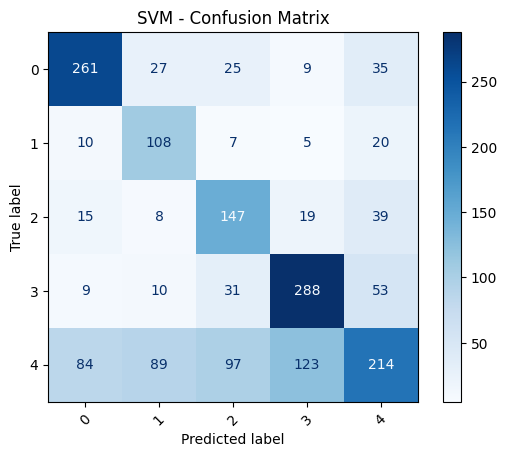

AUC ROC (macro, ovr): 0.8525


In [ ]:
evaluate_model("SVM", y_test, y_pred_svm, y_proba_svm)


==== Random Forest Evaluation ====
Balanced Accuracy: 0.5951753418779551
F1 Score (macro): 0.4940353978352382
Recall (macro): 0.5951753418779551
Precision (macro): 0.48984548151581897

Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.81      0.73       357
           1       0.44      0.66      0.53       150
           2       0.31      0.72      0.43       228
           3       0.63      0.73      0.68       391
           4       0.41      0.06      0.11       607

    accuracy                           0.50      1733
   macro avg       0.49      0.60      0.49      1733
weighted avg       0.50      0.50      0.44      1733



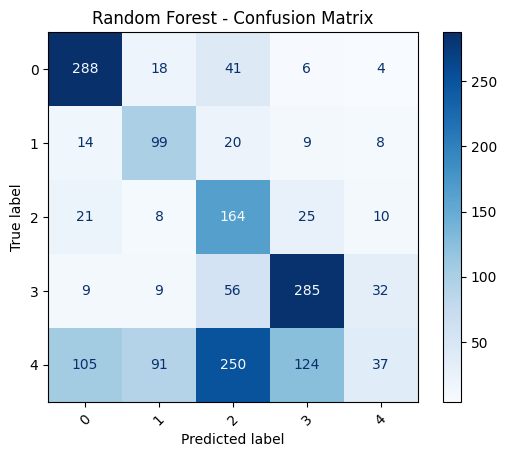

AUC ROC (macro, ovr): 0.8249


In [ ]:
evaluate_model("Random Forest", y_test, y_pred_rf, y_proba_rf)

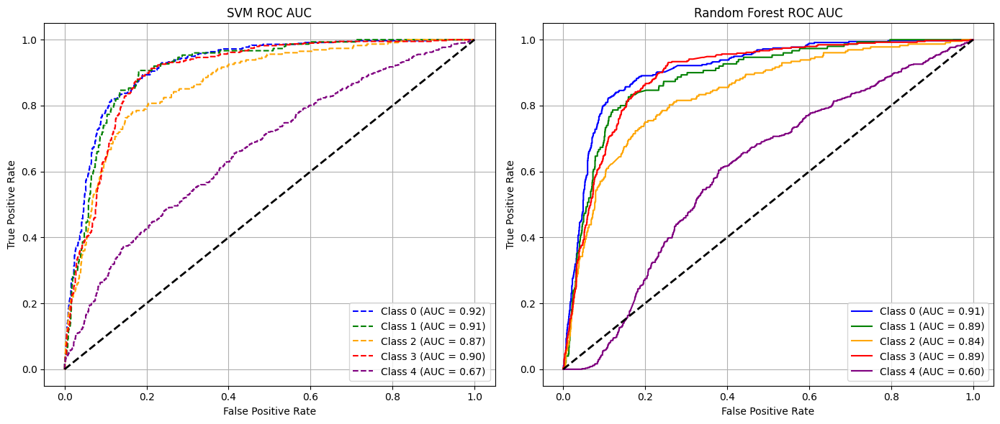

In [ ]:
# Binarize y_test for multiclass ROC AUC
y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]
colors = ['blue', 'green', 'orange', 'red', 'purple']

# Function to compute fpr, tpr, auc per class
def compute_roc_auc(y_true_bin, y_score):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    return fpr, tpr, roc_auc

# Compute ROC AUC data
fpr_svm, tpr_svm, roc_auc_svm = compute_roc_auc(y_test_bin, y_proba_svm)
fpr_rf, tpr_rf, roc_auc_rf = compute_roc_auc(y_test_bin, y_proba_rf)

# Create 1x2 plot
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot SVM ROC AUC
for i in range(n_classes):
    axes[0].plot(fpr_svm[i], tpr_svm[i], color=colors[i],
                 label=f'Class {i} (AUC = {roc_auc_svm[i]:.2f})', linestyle='--')
axes[0].plot([0, 1], [0, 1], 'k--', lw=2)
axes[0].set_title('SVM ROC AUC')
axes[0].set_xlabel('False Positive Rate')
axes[0].set_ylabel('True Positive Rate')
axes[0].legend(loc='lower right')
axes[0].grid(True)

# Plot Random Forest ROC AUC
for i in range(n_classes):
    axes[1].plot(fpr_rf[i], tpr_rf[i], color=colors[i],
                 label=f'Class {i} (AUC = {roc_auc_rf[i]:.2f})')
axes[1].plot([0, 1], [0, 1], 'k--', lw=2)
axes[1].set_title('Random Forest ROC AUC')
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].legend(loc='lower right')
axes[1].grid(True)

plt.tight_layout()
plt.show()

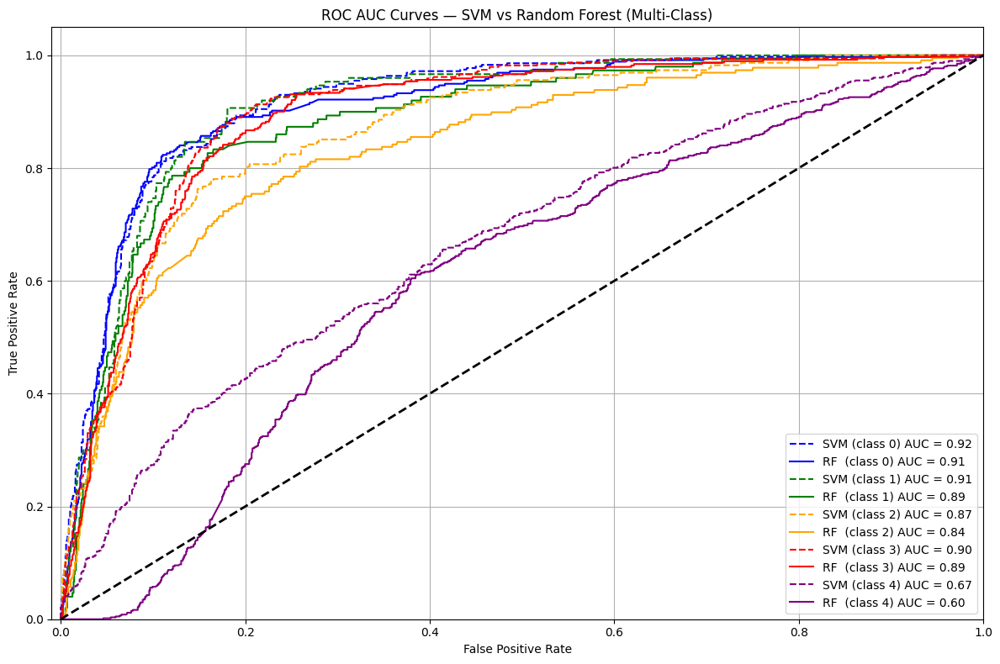

In [ ]:
from sklearn.preprocessing import LabelBinarizer

y_test_bin = label_binarize(y_test, classes=[0,1,2,3,4])

# Compute ROC curve and AUC for each class for SVM
fpr_svm = dict()
tpr_svm = dict()
roc_auc_svm = dict()
for i in range(y_test_bin.shape[1]):
    fpr_svm[i], tpr_svm[i], _ = roc_curve(y_test_bin[:, i], y_proba_svm[:, i])
    roc_auc_svm[i] = auc(fpr_svm[i], tpr_svm[i])

# Same for Random Forest
fpr_rf = dict()
tpr_rf = dict()
roc_auc_rf = dict()
for i in range(y_test_bin.shape[1]):
    fpr_rf[i], tpr_rf[i], _ = roc_curve(y_test_bin[:, i], y_proba_rf[:, i])
    roc_auc_rf[i] = auc(fpr_rf[i], tpr_rf[i])

# Plot ROC curves
plt.figure(figsize=(12, 8))
colors = ['blue', 'green', 'orange', 'red', 'purple']
for i in range(y_test_bin.shape[1]):
    plt.plot(fpr_svm[i], tpr_svm[i], color=colors[i], linestyle='--',
             label=f'SVM (class {i}) AUC = {roc_auc_svm[i]:.2f}')
    plt.plot(fpr_rf[i], tpr_rf[i], color=colors[i],
             label=f'RF  (class {i}) AUC = {roc_auc_rf[i]:.2f}')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.01, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC AUC Curves — SVM vs Random Forest (Multi-Class)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

## **Validation Phase**

### **Linear SVM + SMOTE**

In [ ]:
from imblearn.over_sampling import SMOTE

X = data["medical_abstract"].values
y = data["label"].values

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=1, stratify=y)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_train_vec = vectorizer.fit_transform(X_train)

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_vec, y_train)

In [ ]:
svm = SVC(kernel='linear', C=0.1, class_weight='balanced', random_state=42)
svm.fit(X_train_resampled, y_train_resampled)

X_val_vec = vectorizer.transform(X_val)
y_val_pred = svm.predict(X_val_vec)

print("Balanced Accuracy (Validation):", balanced_accuracy_score(y_val, y_val_pred))
print("Classification Report:\n", classification_report(y_val, y_val_pred))

### **Random Forest + SMOTE**

In [ ]:
rf = RandomForestClassifier(n_estimators=100, class_weight='balanced', random_state=42)
rf.fit(X_train_resampled, y_train_resampled)

X_val_vec = vectorizer.transform(X_val)
y_val_pred = rf.predict(X_val_vec)

print("Balanced Accuracy (Validation):", balanced_accuracy_score(y_val, y_val_pred))
print("Classification Report:\n", classification_report(y_val, y_val_pred))

## **Test Phase**

In [ ]:
X_combined = np.concatenate((X_train, X_val))
y_combined = np.concatenate((y_train, y_val))

vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1, 2))
X_combined_vec = vectorizer.fit_transform(X_combined)
X_test_vec = vectorizer.transform(X_test)

smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_combined_vec, y_combined)

In [ ]:
svm = SVC(kernel='linear', C=0.1, class_weight='balanced',
          probability=True, random_state=42)

svm.fit(X_resampled, y_resampled)

y_pred_svm = svm.predict(X_test_vec)
y_proba_svm = svm.predict_proba(X_test_vec)

print("Balanced Accuracy (Test):", balanced_accuracy_score(y_test, y_pred_svm))
print("Classification Report:\n", classification_report(y_test, y_pred_svm))

Balanced Accuracy (Test): 0.6178344729375042
Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.70      0.71       380
           1       0.54      0.66      0.60       179
           2       0.50      0.61      0.55       231
           3       0.68      0.68      0.68       366
           4       0.51      0.44      0.47       577

    accuracy                           0.59      1733
   macro avg       0.59      0.62      0.60      1733
weighted avg       0.59      0.59      0.59      1733



In [ ]:
rf = RandomForestClassifier(
    max_depth=20,
    n_estimators=200,
    min_samples_split=2,
    class_weight='balanced',
    random_state=42
)
rf.fit(X_resampled, y_resampled)

y_pred_rf = rf.predict(X_test_vec)
y_proba_rf = rf.predict_proba(X_test_vec)

print("Balanced Accuracy (Test):", balanced_accuracy_score(y_test, y_pred_rf))
print("Classification Report:\n", classification_report(y_test, y_pred_rf))

Balanced Accuracy (Test): 0.5287253583749327
Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.71      0.68       380
           1       0.45      0.47      0.46       179
           2       0.43      0.48      0.45       231
           3       0.62      0.62      0.62       366
           4       0.41      0.37      0.39       577

    accuracy                           0.52      1733
   macro avg       0.51      0.53      0.52      1733
weighted avg       0.52      0.52      0.52      1733




==== SVM Evaluation ====
Balanced Accuracy: 0.6178344729375042
F1 Score (macro): 0.6009165420013227
Recall (macro): 0.6178344729375042
Precision (macro): 0.589539516694006

Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.70      0.71       380
           1       0.54      0.66      0.60       179
           2       0.50      0.61      0.55       231
           3       0.68      0.68      0.68       366
           4       0.51      0.44      0.47       577

    accuracy                           0.59      1733
   macro avg       0.59      0.62      0.60      1733
weighted avg       0.59      0.59      0.59      1733



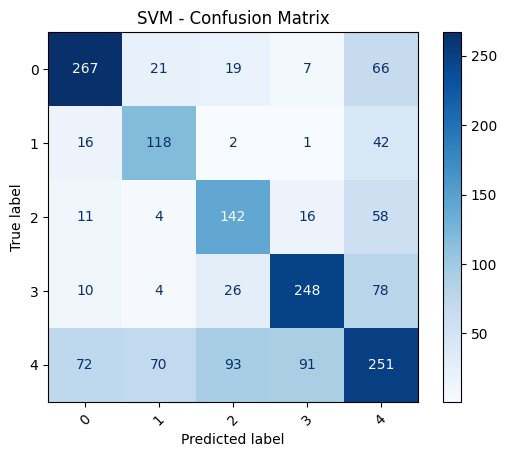

AUC ROC (macro, ovr): 0.8580


In [ ]:
evaluate_model("SVM", y_test, y_pred_svm, y_proba_svm)


==== Random Forest Evaluation ====
Balanced Accuracy: 0.5287253583749327
F1 Score (macro): 0.5203596659810894
Recall (macro): 0.5287253583749327
Precision (macro): 0.5135106071983516

Classification Report:
               precision    recall  f1-score   support

           0       0.66      0.71      0.68       380
           1       0.45      0.47      0.46       179
           2       0.43      0.48      0.45       231
           3       0.62      0.62      0.62       366
           4       0.41      0.37      0.39       577

    accuracy                           0.52      1733
   macro avg       0.51      0.53      0.52      1733
weighted avg       0.52      0.52      0.52      1733



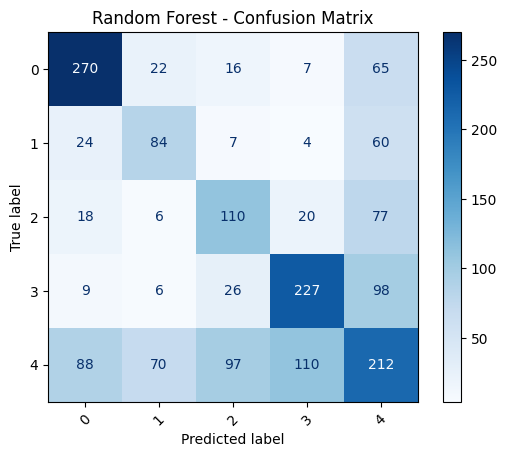

AUC ROC (macro, ovr): 0.8122


In [ ]:
evaluate_model("Random Forest", y_test, y_pred_rf, y_proba_rf)

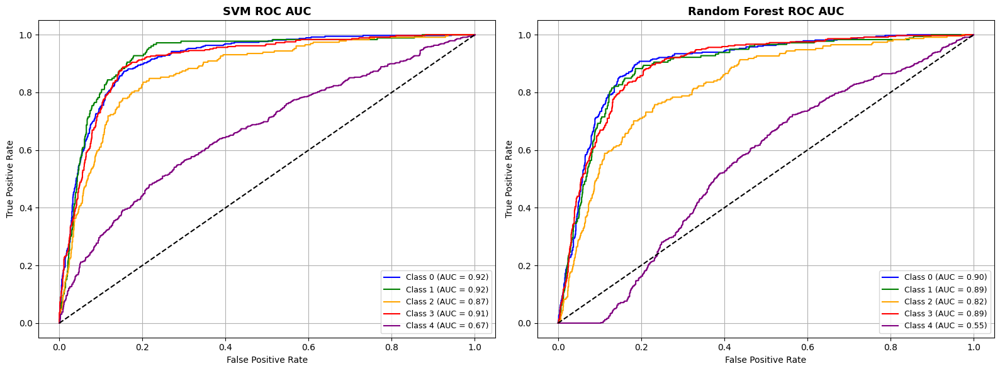

In [ ]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

classes = np.unique(y_test)
y_test_bin = label_binarize(y_test, classes=classes)
n_classes = y_test_bin.shape[1]

colors = ['blue', 'green', 'orange', 'red', 'purple']

def compute_roc_auc(y_true_bin, y_score):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(y_true_bin.shape[1]):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    return fpr, tpr, roc_auc

# Compute ROC AUC data
fpr_svm, tpr_svm, roc_auc_svm = compute_roc_auc(y_test_bin, y_proba_svm)
fpr_rf, tpr_rf, roc_auc_rf = compute_roc_auc(y_test_bin, y_proba_rf)

# Create 1x2 subplot
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# --- Plot SVM ROC AUC ---
for i in range(n_classes):
    axes[0].plot(fpr_svm[i], tpr_svm[i], color=colors[i],
                 label=f'Class {i} (AUC = {roc_auc_svm[i]:.2f})')
axes[0].plot([0, 1], [0, 1], 'k--', lw=1.5)
axes[0].set_title('SVM ROC AUC', fontsize=13, weight='bold')
axes[0].set_xlabel('False Positive Rate')
axes[0].set_ylabel('True Positive Rate')
axes[0].legend(loc='lower right', fontsize=9)
axes[0].grid(True)

# --- Plot Random Forest ROC AUC ---
for i in range(n_classes):
    axes[1].plot(fpr_rf[i], tpr_rf[i], color=colors[i],
                 label=f'Class {i} (AUC = {roc_auc_rf[i]:.2f})')
axes[1].plot([0, 1], [0, 1], 'k--', lw=1.5)
axes[1].set_title('Random Forest ROC AUC', fontsize=13, weight='bold')
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].legend(loc='lower right', fontsize=9)
axes[1].grid(True)

plt.tight_layout()
plt.show()

#**Data preparation for deep learning models**

In [4]:
data = pd.read_csv('/content/drive/MyDrive/medical_tc_train.csv')
data = data.dropna()
data.head()

,condition_label,medical_abstract
0,5,Tissue changes around loose prostheses. A cani...
1,1,Neuropeptide Y and neuron-specific enolase lev...
2,2,"Sexually transmitted diseases of the colon, re..."
3,1,Lipolytic factors associated with murine and h...
4,3,Does carotid restenosis predict an increased r...


In [5]:
data["label"] = data["condition_label"] - 1

X = data["medical_abstract"].values
y = data["label"].values

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print(f"Training set: {len(X_train)} samples")
print(f"Validation set: {len(X_val)} samples")
print(f"Test set: {len(X_test)} samples")

Training set: 8085 samples
Validation set: 1732 samples
Test set: 1733 samples


In [6]:
nltk.download('stopwords')
STOPWORDS = set(stopwords.words('english'))

def tokenize(text):
    """
    Tokenizes English text by:
    - converting to lowercase
    - removing punctuation
    - removing numbers
    - removing English stopwords

    Args:
        text (str): Input English text.

    Returns:
        List[str]: List of cleaned tokens without stopwords and numbers.
    """
    text = re.sub(r'[^\w\s]', ' ', text)
    tokens = re.findall(r'\b[a-z]+\b', text.lower())
    tokens = [word for word in tokens if word not in STOPWORDS]

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [7]:
all_tokens = [token for text in X_train for token in tokenize(text)]
vocab = Counter(all_tokens)
filtered_vocab = {word: freq for word, freq in vocab.items() if freq >= 2}
print(len(filtered_vocab))
VOCAB_SIZE =  len(filtered_vocab)

sorted_filtered_vocab = dict(sorted(filtered_vocab.items(), key=lambda item: item[1], reverse=True)[:VOCAB_SIZE])

word_to_index = {word: idx for idx, (word, _) in enumerate(sorted_filtered_vocab.items(), 1)}
word_to_index["<PAD>"] = 0
word_to_index["<UNK>"] = len(word_to_index)

index_to_word = {idx: word for word, idx in word_to_index.items()}
print(word_to_index["malaria"])
print(index_to_word[10])

print(index_to_word[301])
print(word_to_index["host"])

20931
2430
may
weight
1251


In [8]:
def text_to_sequence(text):
    """
    Converts the tokenized text into a sequence of indices based on a word-to-index mapping.

    Args:
        text: A string containing the text to be converted.

    Returns:
        A list of integers representing the sequence of token indices.
    """
    return [word_to_index.get(token, word_to_index["<UNK>"]) for token in tokenize(text)]

def pad_to_tensor(sequences, max_len=None):
    """
    Pads sequences to the specified maximum length, or truncates them if they exceed it.

    Args:
        sequences: A list of sequences (each sequence is a list of integers).
        max_len: The maximum length to which sequences should be padded. If None, no padding is applied.

    Returns:
        A tensor containing the padded (or truncated) sequences.
    """
    padded_sequences = [torch.tensor(seq, dtype=torch.long) for seq in sequences]
    if max_len:
        padded_sequences = [seq[:max_len] for seq in padded_sequences]
        padded_sequences = [
            torch.cat([seq, torch.zeros(max_len - len(seq), dtype=torch.long)], 0) if len(seq) < max_len else seq
            for seq in padded_sequences
        ]

    return torch.stack(padded_sequences)

class TextDataset(Dataset):
    """
    Custom Dataset for handling text data and labels.

    Args:
        X_data: Input features (e.g., tokenized text).
        y_data: Labels corresponding to the text data.
        raw_text_data: (Optional) The raw text data for reference (default is None).
    """
    def __init__(self, X_data, y_data, raw_text_data=None):
        self.X = torch.tensor(X_data, dtype=torch.long)
        self.y = torch.tensor(y_data, dtype=torch.long)
        self.raw_text_data = raw_text_data

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        input_tensor = self.X[idx]
        target_tensor = self.y[idx]
        raw_text = self.raw_text_data[idx] if self.raw_text_data is not None else None
        return input_tensor, target_tensor, raw_text

In [ ]:
print(word_to_index["patient"], word_to_index["cell"])

11 17


In [9]:
X_train_seq = [text_to_sequence(text) for text in X_train]
X_val_seq = [text_to_sequence(text) for text in X_val]
X_test_seq = [text_to_sequence(text) for text in X_test]

print(X_train_seq[0])

[4642, 192, 195, 602, 20932, 129, 12864, 4181, 192, 3428, 1815, 20932, 4643, 685, 73, 724, 7571, 463, 1571, 1096, 977, 5536, 4644, 6, 10, 1085, 2114, 555, 78, 650, 574, 119, 129, 241, 195, 117, 6, 5943, 254, 1141, 18, 164, 117, 1, 11644, 62, 1639, 288, 5536, 1734, 1088, 1197, 62, 143, 5536, 1712, 1734, 1, 20932, 1197, 62, 165, 143, 3349, 73, 724, 1, 913, 38, 7997, 1350, 118, 264, 164, 117, 81, 169, 73, 724, 239, 2853, 7, 809, 44, 5536, 1735, 1, 243, 892, 143, 3628, 6, 28, 320, 100, 1640, 11, 8486, 713, 3771, 28, 1011, 539, 275, 875, 1466, 110, 76, 196, 3099, 2576, 20932, 53, 1, 16914, 2576, 1903, 125, 7, 11645, 195, 28, 800, 3772, 195, 602, 782, 1639, 7997, 1042, 5536, 3628, 51, 195, 28, 10, 848, 5363, 117, 831, 2576, 195, 117, 6628, 16915, 4644, 192, 5188, 126, 3429, 2, 849]


In [10]:
max_length = 400

X_train_tensor = pad_to_tensor(X_train_seq, max_len=max_length)
X_val_tensor = pad_to_tensor(X_val_seq, max_len=max_length)
X_test_tensor = pad_to_tensor(X_test_seq, max_len=max_length)

print(f"Train Tensor Shape: {X_train_tensor.shape}, Type: {X_train_tensor.dtype}")
print(f"Validation Tensor Shape: {X_val_tensor.shape}, Type: {X_val_tensor.dtype}")
print(f"Test Tensor Shape: {X_test_tensor.shape}, Type: {X_test_tensor.dtype}")

y_train_tensor = torch.tensor(y_train)
y_val_tensor = torch.tensor(y_val)
y_test_tensor = torch.tensor(y_test)

Train Tensor Shape: torch.Size([8085, 400]), Type: torch.int64
Validation Tensor Shape: torch.Size([1732, 400]), Type: torch.int64
Test Tensor Shape: torch.Size([1733, 400]), Type: torch.int64


In [11]:
batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [17]:
print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")
print(f"Combined dataset size: {len(combined_dataset)}")

NUM_CLASSES = len(torch.unique(y_train_tensor))
VOCAB_SIZE = len(word_to_index)
print(NUM_CLASSES)

Training set size: 8085
Validation set size: 1732
Test set size: 1733
Combined dataset size: 9817
5


# **III. GRU and LSTM models with embeddings learned from scratch**

In [18]:
# ============ Define Bidirectional GRU Model ============
class GRU_Model(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim=NUM_CLASSES,
                 num_layers=1, dropout_prob=0.5, embedding_weights=None, freeze_embeddings=False):
        super(GRU_Model, self).__init__()

        if embedding_weights is not None:
            self.embedding = nn.Embedding.from_pretrained(embedding_weights, freeze=freeze_embeddings)
        else:
            self.embedding = nn.Embedding(vocab_size, embedding_dim)

        self.gru = nn.GRU(
            input_size=embedding_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout_prob if num_layers > 1 else 0,
            bidirectional=True
        )

        self.dropout = nn.Dropout(dropout_prob)
        self.fc = nn.Linear(hidden_dim * 2, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        gru_out, _ = self.gru(embedded)
        gru_out = self.dropout(gru_out[:, -1, :])
        out = self.fc(gru_out)
        return out

# ============ Define Bidirectional LSTM Model ============
class LSTM_Model(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim=NUM_CLASSES,
                 embedding_weights=None, num_layers=1, dropout_prob=0.3, freeze_embeddings=True):
        super(LSTM_Model, self).__init__()

        if embedding_weights is not None:
            self.embedding = nn.Embedding.from_pretrained(embedding_weights, freeze=freeze_embeddings)
        else:
            self.embedding = nn.Embedding(vocab_size, embedding_dim)

        self.lstm = nn.LSTM(
            input_size=embedding_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout_prob if num_layers > 1 else 0,
            bidirectional=True
        )

        self.dropout = nn.Dropout(dropout_prob)
        self.fc = nn.Linear(hidden_dim * 2, output_dim)

    def forward(self, x):
        embedded = self.embedding(x)
        lstm_out, _ = self.lstm(embedded)
        lstm_out = self.dropout(lstm_out[:, -1, :])
        out = self.fc(lstm_out)
        return out

In [19]:
clip = 5.0  # gradient clipping

def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

def train_epoch(model, train_loader, optimizer, criterion, device):
    """
    Train the model for one epoch and return average loss and balanced accuracy.
    """
    model.train()
    total_loss = 0.0
    all_preds = []
    all_labels = []

    for batch in train_loader:
        if len(batch) == 3:
            inputs, targets, _ = batch
        else:
            inputs, targets = batch

        inputs = inputs.to(device)
        targets = targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()

        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=clip)
        optimizer.step()

        total_loss += loss.item()

        preds = torch.argmax(outputs, dim=1).cpu().numpy()
        labels = targets.cpu().numpy()

        all_preds.extend(preds)
        all_labels.extend(labels)

    avg_loss = total_loss / len(train_loader)
    balanced_acc = balanced_accuracy_score(np.array(all_labels), np.array(all_preds))

    return avg_loss, balanced_acc

def validate_epoch(model, val_loader, criterion, device):
    """
    Validate the model for one epoch and return average loss, balanced accuracy, and F1-score.
    """
    model.eval()
    total_loss = 0.0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for batch in val_loader:
            if len(batch) == 3:
                inputs, targets, _ = batch
            else:
                inputs, targets = batch

            inputs = inputs.to(device)
            targets = targets.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, targets)
            total_loss += loss.item()

            preds = torch.argmax(outputs, dim=1).cpu().numpy()
            labels = targets.cpu().numpy()

            all_preds.extend(preds)
            all_labels.extend(labels)

    avg_loss = total_loss / len(val_loader)
    balanced_acc = balanced_accuracy_score(np.array(all_labels), np.array(all_preds))
    f1 = f1_score(np.array(all_labels), np.array(all_preds), average="weighted", zero_division=0)

    return avg_loss, balanced_acc, f1

def test_epoch(model, test_loader, criterion, device):
    """
    Validate the model for one epoch, including precision, F1, balanced accuracy, and recall.
    Args:
        model: Model instance.
        test_loader: DataLoader for test data.
        criterion: Loss function (CrossEntropyLoss).
        device: CPU/GPU.
    Returns:
        Average test loss, accuracy, F1-score, balanced accuracy, Recall, and Precision.
    """
    model.eval()  # Set model to evaluation mode
    total_loss, total_accuracy = 0, 0

    all_labels = []
    all_preds = []

    with torch.no_grad():
        for batch in test_loader:
            input_tensor, target_tensor, _ = batch  # Ignore raw_text
            input_tensor, target_tensor = input_tensor.to(device), target_tensor.to(device)

            output = model(input_tensor)  # Forward pass
            loss = criterion(output, target_tensor)  # Compute loss
            batch_accuracy = accuracy_score(target_tensor.cpu(), torch.argmax(output, dim=1).cpu())

            total_loss += loss.item()
            total_accuracy += batch_accuracy * len(target_tensor)

            preds = torch.argmax(output, dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(target_tensor.cpu().numpy())

    f1 = f1_score(all_labels, all_preds, average="weighted", zero_division=0)
    balanced_acc = balanced_accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average="weighted", zero_division=0)
    recall = recall_score(all_labels, all_preds, average="weighted", zero_division=0)

    avg_loss = total_loss / len(test_loader)
    avg_accuracy = total_accuracy / len(test_loader.dataset)

    return avg_loss, avg_accuracy, f1, balanced_acc, recall, precision

def get_hidden_states(model, dataloader, device):
    """
    This function extracts the hidden states from a model (either GRU or LSTM) for each sample in the dataloader.
    The hidden states are taken from the last time step of the sequence, which are typically used for classification tasks.

    Args:
        model: A PyTorch model that contains an embedding layer and either a GRU or LSTM layer.
        dataloader: A DataLoader containing batches of input data and their corresponding targets.
        device: The device (CPU or GPU) to run the model on.

    Returns:
        hidden_states: A numpy array containing the hidden states for each sample in the dataloader.
        labels: A numpy array containing the target labels corresponding to each input sample.
    """
    model.eval()
    hidden_states, labels = [], []

    with torch.no_grad():
        for batch in dataloader:
            inputs, targets, _ = batch
            inputs = inputs.to(device)

            embedded = model.embedding(inputs)

            if hasattr(model, "gru"):
                gru_out, _ = model.gru(embedded)
                hidden_state = gru_out[:, -1, :]

            elif hasattr(model, "lstm"):
                lstm_out, (hidden, _) = model.lstm(embedded)
                hidden_state = hidden[-1]

            else:
                raise ValueError("Unsupported model type. Model must contain GRU or LSTM.")

            hidden_states.append(hidden_state.cpu().numpy())
            labels.append(targets.cpu().numpy())

    hidden_states = np.concatenate(hidden_states, axis=0)
    labels = np.concatenate(labels, axis=0)

    return hidden_states, labels

def count_parameters(model):
    """
    Computes the total number of trainable parameters in a model.

    Args:
        model: A PyTorch model instance.

    Returns:
        The total number of trainable parameters in the model.
    """
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def custom_collate_fn(batch):
    """
    Custom collate function to combine input tensors, target tensors, and raw texts into a batch.
    Stacks inputs and targets into tensors, returns raw texts as a list.

    Args:
        batch (list): List of tuples containing input tensor, target tensor, and raw text.

    Returns:
        tuple: Stacked inputs tensor, stacked targets tensor, and list of raw texts.
    """
    inputs, targets, raw_texts = zip(*batch)
    inputs = torch.stack(inputs)
    targets = torch.stack(targets)
    return inputs, targets, list(raw_texts)

class EarlyStopping:
    def __init__(self, patience=2, delta=0.001):
        self.patience = patience
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.delta = delta

    def __call__(self, val_loss):
        score = -val_loss
        if self.best_score is None:
            self.best_score = score
        elif score < self.best_score + self.delta:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.counter = 0

## **Validation Phase**

### **GRU**

In [20]:
model = GRU_Model(vocab_size=len(word_to_index), embedding_dim=350, hidden_dim=300, num_layers=1, dropout_prob=0.3).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_Model(
  (embedding): Embedding(20933, 350)
  (gru): GRU(350, 300, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=600, out_features=5, bias=True)
)

Total trainable parameters: 8503155


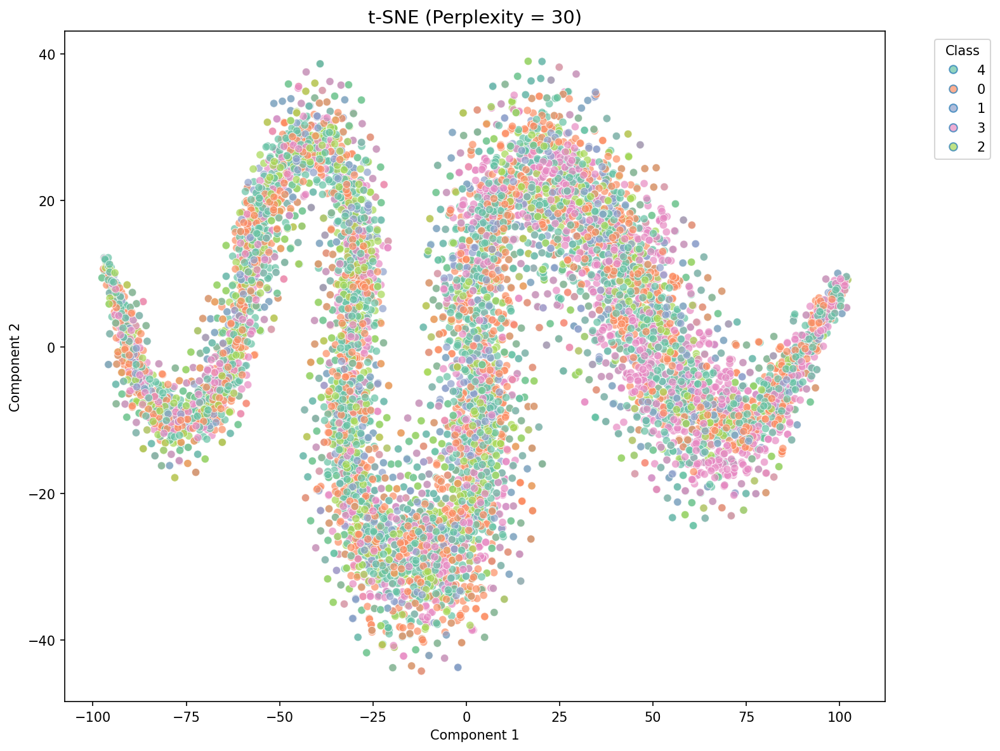

In [21]:
model.eval()
embeddings = []
labels = []

with torch.no_grad():
    for inputs, targets, _ in train_loader:
        inputs = inputs.to(device)

        embedded = model.embedding(inputs)              # e.g. (B, seq_len, emb_dim)
        emb_mean = embedded.mean(dim=1).cpu().numpy()   # (B, emb_dim)
        embeddings.append(emb_mean)
        labels.extend(targets.cpu().numpy())

# Stack to arrays
embeddings = np.vstack(embeddings)
labels = np.array(labels)

labels = pd.Series(labels).astype(str)
n_classes = labels.nunique()
palette = sns.color_palette("Set2", n_colors=n_classes)

perplexity = 30
tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, init='pca')
tsne_result = tsne.fit_transform(embeddings)

fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=labels,
    palette=palette,
    alpha=0.7,
    ax=ax,
    legend=False
)

ax.set_title(f"t-SNE (Perplexity = {perplexity})", fontsize=14)
ax.set_xlabel("Component 1")
ax.set_ylabel("Component 2")

unique_labels = labels.unique()
handles = []
for i, lab in enumerate(unique_labels):
    handles.append(plt.Line2D([0], [0], marker='o', linestyle='', markersize=6,
                              markerfacecolor=palette[i], alpha=0.7, label=lab))

fig.legend(handles=handles, title="Class", bbox_to_anchor=(0.98, 0.95), loc='upper left')

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()

In [ ]:
learning_rate = 1e-4
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 12/18 - Train Loss: 1.0367, Val Loss: 1.3810, Train Acc: 46.54%, Val Acc: 36.69%, Val F1: 38.73%, Time: 0.39 min:  67%|██████▋   | 12/18 [04:11<02:05, 20.99s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 8 with best val_loss = 1.306874.


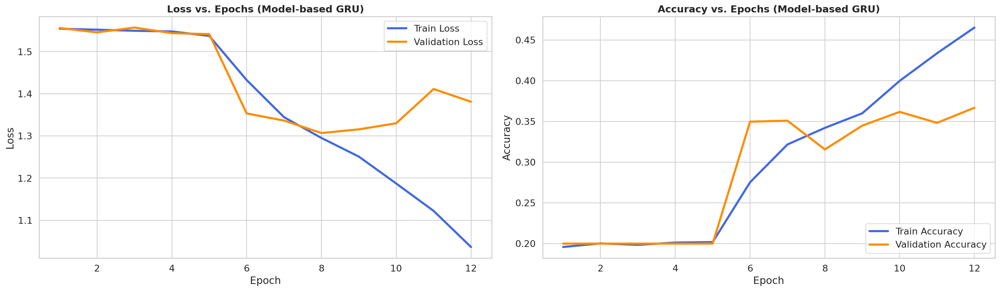

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **GRU + SMOTE**


In [ ]:
model = GRU_Model(vocab_size=len(word_to_index), embedding_dim=350, hidden_dim=600, num_layers=1, dropout_prob=0.2).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_Model(
  (embedding): Embedding(25042, 350)
  (gru): GRU(350, 600, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=1200, out_features=5, bias=True)
)

Total trainable parameters: 12197905


In [ ]:
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader

BATCH_SIZE = 16

# Convert training tensors to numpy
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

# Create a mapping from vector to raw text for later retrieval
original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_np, X_train)
}

# Apply SMOTE to training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

# Reconstruct raw texts (if possible), else tag as synthetic
raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    raw_text_resampled.append(
        original_text_map.get(key, "[Synthetic sample - no raw text]")
    )

# Convert back to tensors
X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

# Create dataset and dataloader
train_dataset_smote = TextDataset(
    X_resampled_tensor, y_resampled_tensor, raw_text_data=raw_text_resampled
)
train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn  # Preserves original collation behavior
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-4
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 9/18 - Train Loss: 1.0789, Val Loss: 1.5424, Train Acc: 57.40%, Val Acc: 41.16%, Val F1: 31.88%, Time: 0.51 min:  50%|█████     | 9/18 [05:48<05:48, 38.74s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 5 with best val_loss = 1.348982.


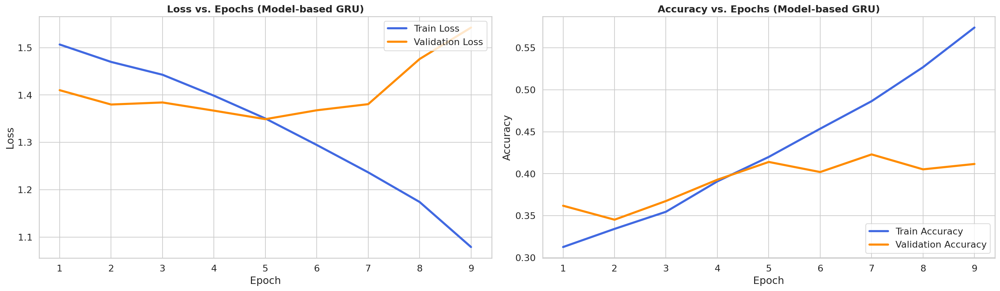

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **GRU + Weight Class**

In [ ]:
model = GRU_Model(vocab_size=len(word_to_index), embedding_dim=350, hidden_dim=300, num_layers=1, dropout_prob=0.5).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_Model(
  (embedding): Embedding(20933, 350)
  (gru): GRU(350, 300, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=600, out_features=5, bias=True)
)

Total trainable parameters: 8503155


In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-4
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss(class_weights_tensor)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 18/18 - Train Loss: 0.6657, Val Loss: 1.5643, Train Acc: 79.09%, Val Acc: 46.90%, Val F1: 43.41%, Time: 0.43 min: 100%|██████████| 18/18 [07:42<00:00, 25.71s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 14 with best val_loss = 1.278782.


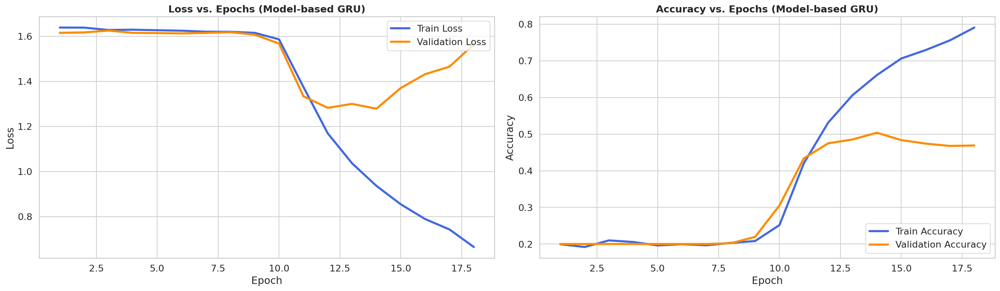

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **LSTM**

In [22]:
model = LSTM_Model(vocab_size=len(word_to_index), embedding_dim=450, hidden_dim=500, num_layers=1, dropout_prob=0.3).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

LSTM_Model(
  (embedding): Embedding(20933, 450)
  (lstm): LSTM(450, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)

Total trainable parameters: 13232855


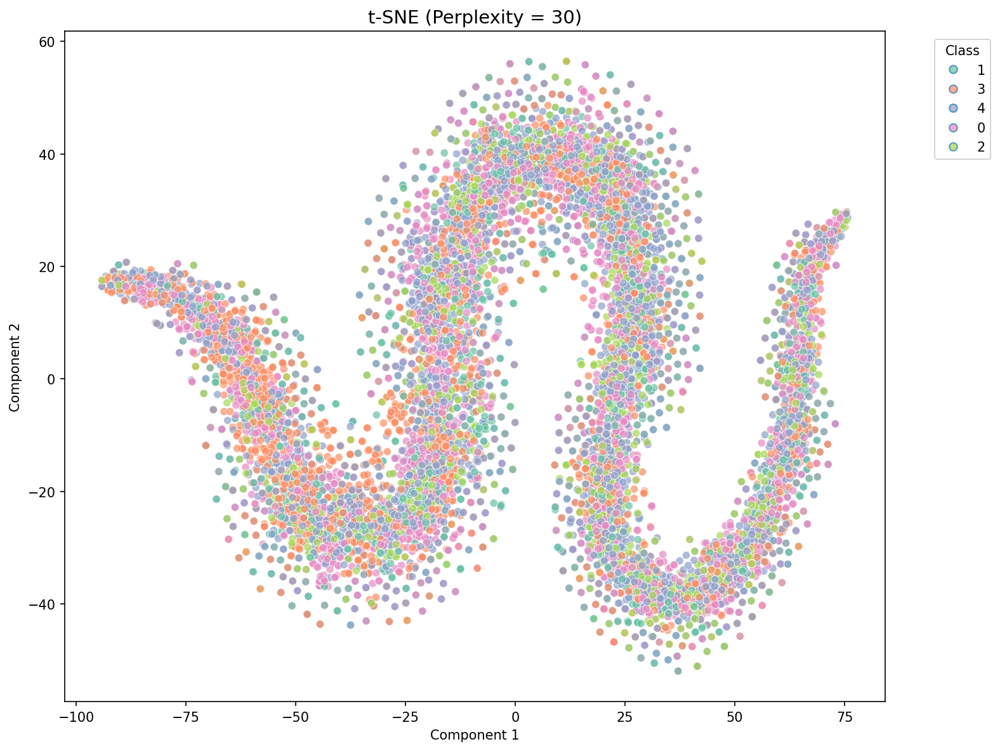

In [23]:
model.eval()
embeddings = []
labels = []

with torch.no_grad():
    for inputs, targets, _ in train_loader:
        inputs = inputs.to(device)

        embedded = model.embedding(inputs)              # e.g. (B, seq_len, emb_dim)
        emb_mean = embedded.mean(dim=1).cpu().numpy()   # (B, emb_dim)
        embeddings.append(emb_mean)
        labels.extend(targets.cpu().numpy())

# Stack to arrays
embeddings = np.vstack(embeddings)
labels = np.array(labels)

labels = pd.Series(labels).astype(str)
n_classes = labels.nunique()
palette = sns.color_palette("Set2", n_colors=n_classes)

perplexity = 30
tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, init='pca')
tsne_result = tsne.fit_transform(embeddings)

fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=labels,
    palette=palette,
    alpha=0.7,
    ax=ax,
    legend=False
)

ax.set_title(f"t-SNE (Perplexity = {perplexity})", fontsize=14)
ax.set_xlabel("Component 1")
ax.set_ylabel("Component 2")

unique_labels = labels.unique()
handles = []
for i, lab in enumerate(unique_labels):
    handles.append(plt.Line2D([0], [0], marker='o', linestyle='', markersize=6,
                              markerfacecolor=palette[i], alpha=0.7, label=lab))

fig.legend(handles=handles, title="Class", bbox_to_anchor=(0.98, 0.95), loc='upper left')

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()

In [ ]:
learning_rate = 1e-2
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 8/18 - Train Loss: 1.7792, Val Loss: 1.7104, Train Acc: 19.87%, Val Acc: 20.00%, Val F1: 15.70%, Time: 0.80 min:  44%|████▍     | 8/18 [06:28<08:05, 48.59s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 4 with best val_loss = 1.708303.


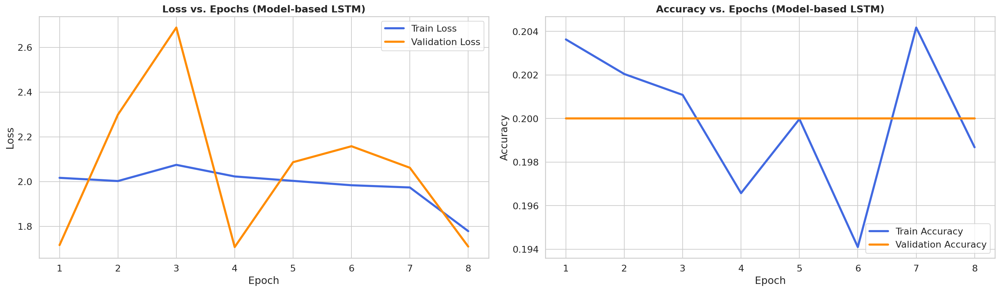

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **LSTM + SMOTE**

In [ ]:
model = LSTM_Model(vocab_size=len(word_to_index), embedding_dim=350, hidden_dim=450, num_layers=1, dropout_prob=0.4).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

LSTM_Model(
  (embedding): Embedding(20933, 350)
  (lstm): LSTM(350, 200, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.4, inplace=False)
  (fc): Linear(in_features=400, out_features=5, bias=True)
)

Total trainable parameters: 8211755


In [ ]:
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader

BATCH_SIZE = 16

# Convert training tensors to numpy
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

# Create a mapping from vector to raw text for later retrieval
original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_np, X_train)
}

# Apply SMOTE to training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

# Reconstruct raw texts (if possible), else tag as synthetic
raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    raw_text_resampled.append(
        original_text_map.get(key, "[Synthetic sample - no raw text]")
    )

# Convert back to tensors
X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

# Create dataset and dataloader
train_dataset_smote = TextDataset(
    X_resampled_tensor, y_resampled_tensor, raw_text_data=raw_text_resampled
)
train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn  # Preserves original collation behavior
)


/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-2
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 6/18 - Train Loss: 1.6081, Val Loss: 1.7656, Train Acc: 19.93%, Val Acc: 20.00%, Val F1: 2.00%, Time: 0.38 min:  33%|███▎      | 6/18 [02:16<04:33, 22.79s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 2 with best val_loss = 1.611312.


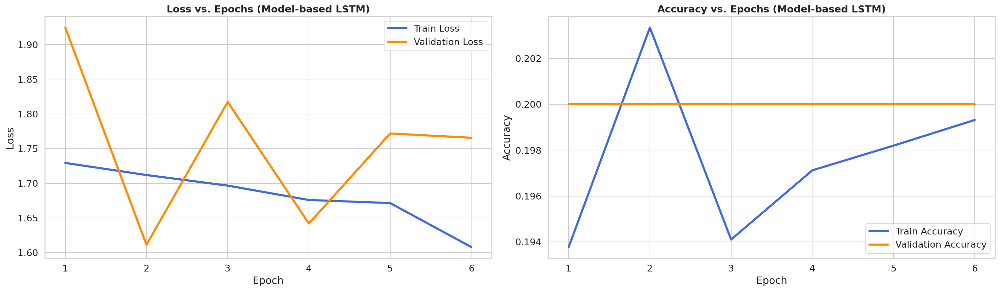

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **LSTM + Weight Class**

In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
model = LSTM_Model(vocab_size=len(word_to_index), embedding_dim=350, hidden_dim=450, num_layers=1, dropout_prob=0.4).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

LSTM_Model(
  (embedding): Embedding(20933, 350)
  (lstm): LSTM(350, 450, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.4, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 10218255


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss(class_weights_tensor)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 10/18 - Train Loss: 1.6097, Val Loss: 1.6092, Train Acc: 20.49%, Val Acc: 20.00%, Val F1: 15.70%, Time: 0.69 min:  56%|█████▌    | 10/18 [07:25<05:56, 44.54s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 6 with best val_loss = 1.608676.


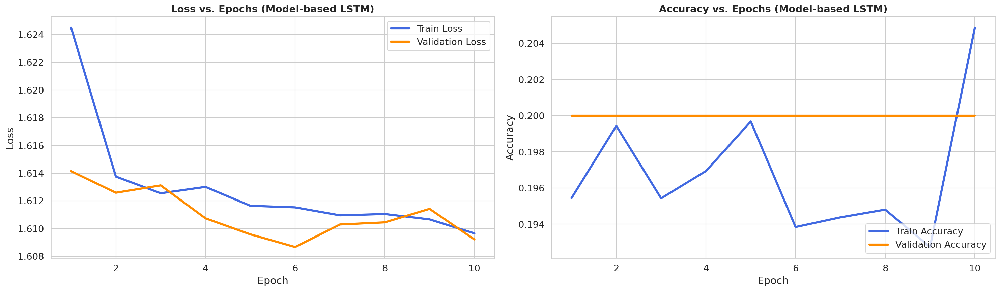

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

# **IV. GRU and LSTM models using word embeddings as input**

In [14]:
def load_glove_embeddings(glove_path, word_to_index, embedding_dim):
    """
    Loads GloVe embeddings (.txt format) and returns an embedding matrix.

    Args:
        glove_path (str): Path to the GloVe .txt file (e.g., glove.6B.300d.txt).
        word_to_index (dict): Mapping from words to their index in the vocabulary.
        embedding_dim (int): Dimension of the embeddings (e.g., 300).

    Returns:
        torch.Tensor: Embedding matrix of shape (vocab_size, embedding_dim).
    """
    embedding_matrix = np.zeros((len(word_to_index), embedding_dim), dtype='float32')
    with open(glove_path, 'r', encoding="utf-8") as f:
        for line in f:
            values = line.strip().split()
            word = values[0]
            if word in word_to_index:
                vector = np.asarray(values[1:], dtype='float32')
                embedding_matrix[word_to_index[word]] = vector

    return torch.tensor(embedding_matrix, dtype=torch.float)

def load_fasttext_embeddings(vec_path, word_to_index, embedding_dim=300):
    """
    Loads FastText embeddings from a .txt or .vec file and returns an embedding matrix.

    Note:
        The .txt or .vec format contains a header (num_tokens, dimension),
        followed by one word vector per line in the format: word val1 val2 ... valN.

    Args:
        vec_path (str): Path to the FastText .txt or .vec file (e.g., cc.en.300.txt or cc.en.300.vec).
        word_to_index (dict): Mapping from words to their index in the vocabulary.
        embedding_dim (int): Dimensionality of the embeddings (e.g., 300).

    Returns:
        torch.Tensor: Embedding matrix of shape (vocab_size, embedding_dim).
    """
    embedding_matrix = np.zeros((len(word_to_index), embedding_dim), dtype='float32')

    with open(vec_path, 'r', encoding='utf-8', newline='\n', errors='ignore') as f:
        header = f.readline()  # header contains: num_words dim
        for line in f:
            values = line.rstrip().split(' ')
            if len(values) < embedding_dim + 1:
                continue  # skip malformed lines
            word = values[0]
            if word in word_to_index:
                vector = np.asarray(values[1:], dtype='float32')
                embedding_matrix[word_to_index[word]] = vector

    return torch.tensor(embedding_matrix, dtype=torch.float)

## **Validation Phase**

### **GRU + Glove (300d)**

In [15]:
EMBEDDING_DIM = 300
embedding_matrix_glove = load_glove_embeddings('/content/drive/MyDrive/glove/glove.6B.300d.txt', word_to_index, EMBEDDING_DIM)

In [24]:
model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.3,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)

Total trainable parameters: 8690905


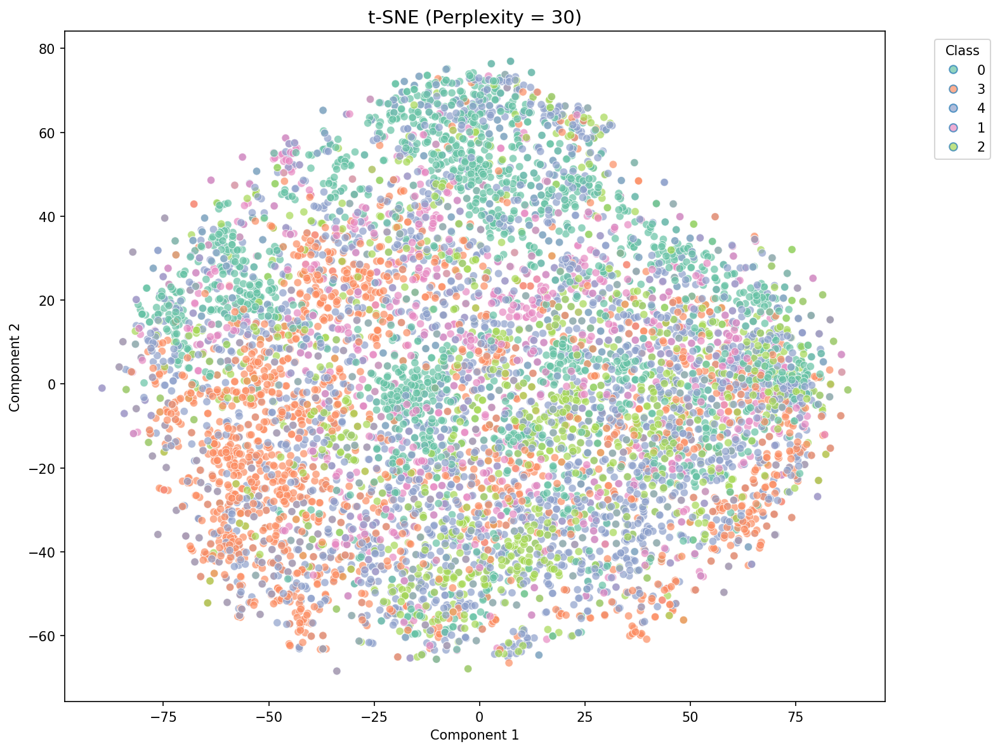

In [25]:
model.eval()
embeddings = []
labels = []

with torch.no_grad():
    for inputs, targets, _ in train_loader:
        inputs = inputs.to(device)

        embedded = model.embedding(inputs)              # e.g. (B, seq_len, emb_dim)
        emb_mean = embedded.mean(dim=1).cpu().numpy()   # (B, emb_dim)
        embeddings.append(emb_mean)
        labels.extend(targets.cpu().numpy())

# Stack to arrays
embeddings = np.vstack(embeddings)
labels = np.array(labels)

labels = pd.Series(labels).astype(str)
n_classes = labels.nunique()
palette = sns.color_palette("Set2", n_colors=n_classes)

perplexity = 30
tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, init='pca')
tsne_result = tsne.fit_transform(embeddings)

fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=labels,
    palette=palette,
    alpha=0.7,
    ax=ax,
    legend=False
)

ax.set_title(f"t-SNE (Perplexity = {perplexity})", fontsize=14)
ax.set_xlabel("Component 1")
ax.set_ylabel("Component 2")

unique_labels = labels.unique()
handles = []
for i, lab in enumerate(unique_labels):
    handles.append(plt.Line2D([0], [0], marker='o', linestyle='', markersize=6,
                              markerfacecolor=palette[i], alpha=0.7, label=lab))

fig.legend(handles=handles, title="Class", bbox_to_anchor=(0.98, 0.95), loc='upper left')

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 8/18 - Train Loss: 0.3839, Val Loss: 1.4100, Train Acc: 81.98%, Val Acc: 52.10%, Val F1: 52.23%, Time: 0.59 min:  44%|████▍     | 8/18 [04:56<06:10, 37.02s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 4 with best val_loss = 0.857300.


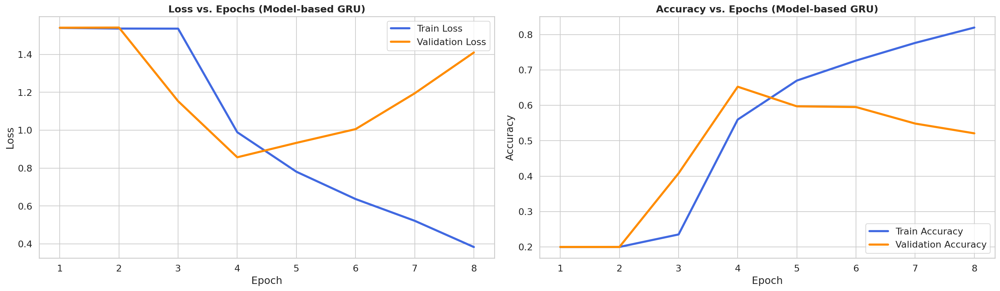

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **GRU + Glove (300d) + SMOTE**

In [ ]:
model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.3,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)

Total trainable parameters: 8690905


In [ ]:
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader

BATCH_SIZE = 16

# Convert training tensors to numpy
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

# Create a mapping from vector to raw text for later retrieval
original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_np, X_train)
}

# Apply SMOTE to training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

# Reconstruct raw texts (if possible), else tag as synthetic
raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    raw_text_resampled.append(
        original_text_map.get(key, "[Synthetic sample - no raw text]")
    )

# Convert back to tensors
X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

# Create dataset and dataloader
train_dataset_smote = TextDataset(
    X_resampled_tensor, y_resampled_tensor, raw_text_data=raw_text_resampled
)
train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn  # Preserves original collation behavior
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 8/18 - Train Loss: 0.2913, Val Loss: 1.7520, Train Acc: 87.53%, Val Acc: 46.33%, Val F1: 47.47%, Time: 0.96 min:  44%|████▍     | 8/18 [07:39<09:34, 57.40s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 4 with best val_loss = 0.976723.


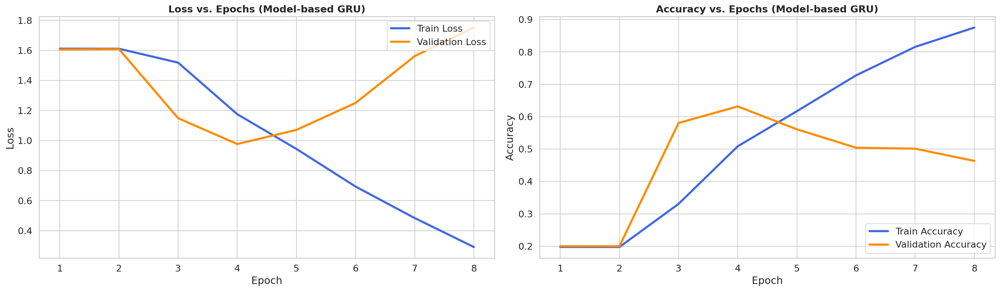

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **GRU + Glove (300d) + Weight Class**

In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=450,
    num_layers=1,
    dropout_prob=0.2,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 8314805


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss(class_weights_tensor)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 6/18 - Train Loss: 1.6231, Val Loss: 1.6293, Train Acc: 19.90%, Val Acc: 21.01%, Val F1: 17.75%, Time: 0.54 min:  33%|███▎      | 6/18 [03:11<06:22, 31.91s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 2 with best val_loss = 1.609988.


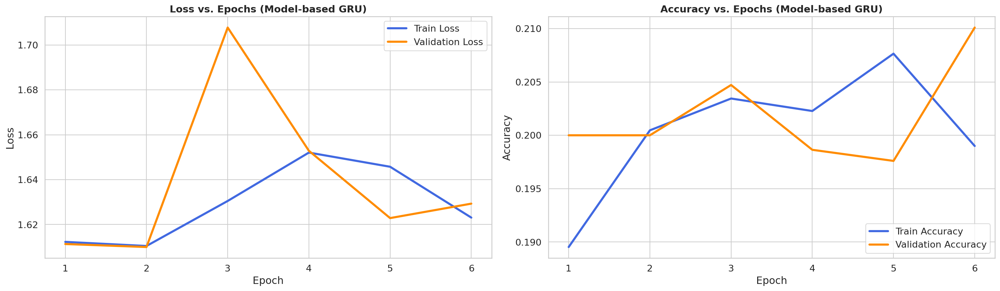

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **GRU + Fasttext (300d)**

In [ ]:
EMBEDDING_DIM = 300
embedding_matrix_fasttext = load_fasttext_embeddings('/content/drive/MyDrive/cc.en.300.vec/cc.en.300.vec', word_to_index, EMBEDDING_DIM)

In [ ]:
model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=450,
    num_layers=1,
    dropout_prob=0.4,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.4, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 8314805


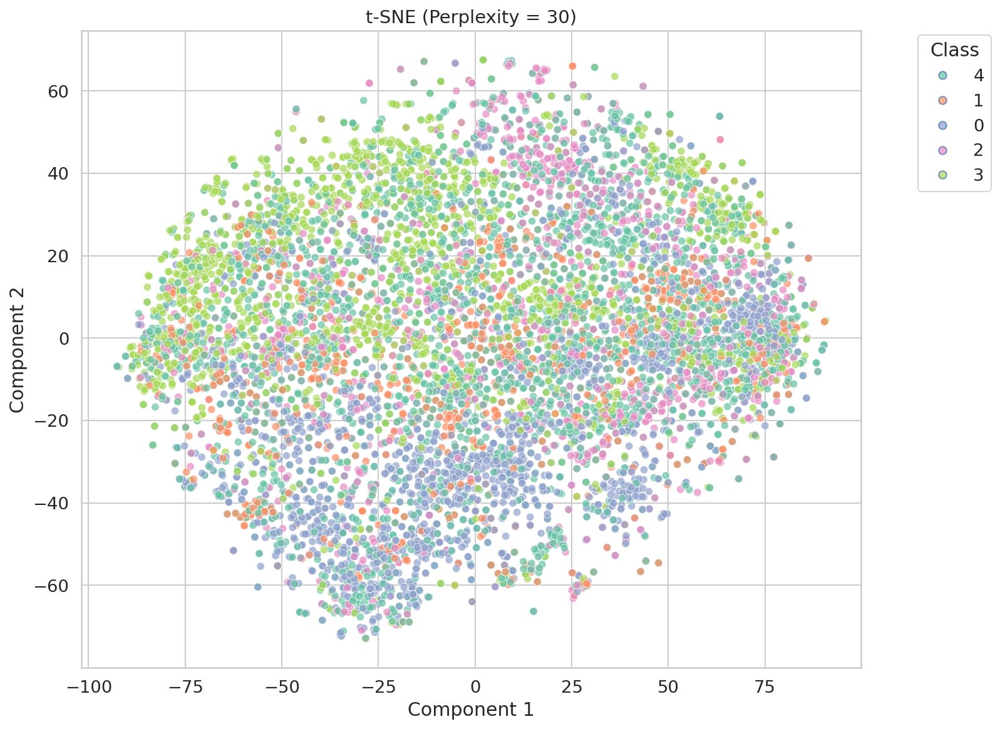

In [ ]:
model.eval()
embeddings = []
labels = []

with torch.no_grad():
    for inputs, targets, _ in train_loader:
        inputs = inputs.to(device)

        embedded = model.embedding(inputs)              # e.g. (B, seq_len, emb_dim)
        emb_mean = embedded.mean(dim=1).cpu().numpy()   # (B, emb_dim)
        embeddings.append(emb_mean)
        labels.extend(targets.cpu().numpy())

# Stack to arrays
embeddings = np.vstack(embeddings)
labels = np.array(labels)

labels = pd.Series(labels).astype(str)
n_classes = labels.nunique()
palette = sns.color_palette("Set2", n_colors=n_classes)

perplexity = 30
tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, init='pca')
tsne_result = tsne.fit_transform(embeddings)

fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=labels,
    palette=palette,
    alpha=0.7,
    ax=ax,
    legend=False
)

ax.set_title(f"t-SNE (Perplexity = {perplexity})", fontsize=14)
ax.set_xlabel("Component 1")
ax.set_ylabel("Component 2")

unique_labels = labels.unique()
handles = []
for i, lab in enumerate(unique_labels):
    handles.append(plt.Line2D([0], [0], marker='o', linestyle='', markersize=6,
                              markerfacecolor=palette[i], alpha=0.7, label=lab))

fig.legend(handles=handles, title="Class", bbox_to_anchor=(0.98, 0.95), loc='upper left')

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 10/18 - Train Loss: 0.3282, Val Loss: 1.6963, Train Acc: 83.66%, Val Acc: 49.94%, Val F1: 50.58%, Time: 0.54 min:  56%|█████▌    | 10/18 [05:19<04:15, 31.99s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 6 with best val_loss = 0.962307.


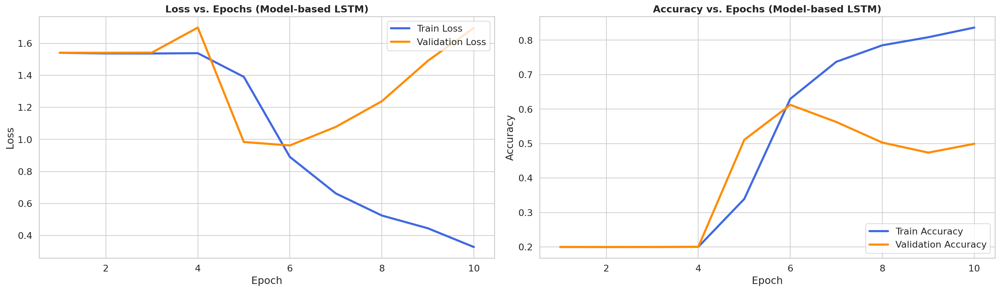

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **GRU + Fasttext (300d) +  SMOTE**

In [ ]:
model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=450,
    num_layers=1,
    dropout_prob=0.2,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 8314805


In [ ]:
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader

BATCH_SIZE = 16

# Convert training tensors to numpy
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

# Create a mapping from vector to raw text for later retrieval
original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_np, X_train)
}

# Apply SMOTE to training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

# Reconstruct raw texts (if possible), else tag as synthetic
raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    raw_text_resampled.append(
        original_text_map.get(key, "[Synthetic sample - no raw text]")
    )

# Convert back to tensors
X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

# Create dataset and dataloader
train_dataset_smote = TextDataset(
    X_resampled_tensor, y_resampled_tensor, raw_text_data=raw_text_resampled
)
train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn  # Preserves original collation behavior
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 11/18 - Train Loss: 0.2286, Val Loss: 2.1594, Train Acc: 89.20%, Val Acc: 45.11%, Val F1: 45.34%, Time: 0.87 min:  61%|██████    | 11/18 [09:58<06:21, 54.44s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 7 with best val_loss = 1.147106.


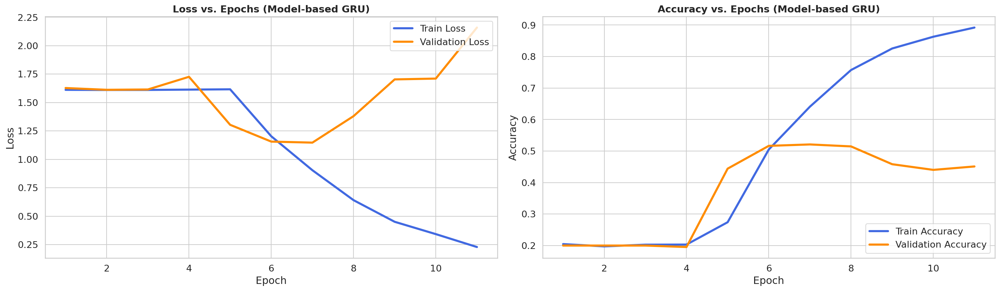

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **GRU + Fasttext (300d) + Weight Class**

In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=450,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 8314805


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss(class_weights_tensor)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 5/18 - Train Loss: 1.5450, Val Loss: 1.6991, Train Acc: 20.10%, Val Acc: 20.00%, Val F1: 2.00%, Time: 0.86 min:  28%|██▊       | 5/18 [04:20<11:17, 52.11s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 1.646745.


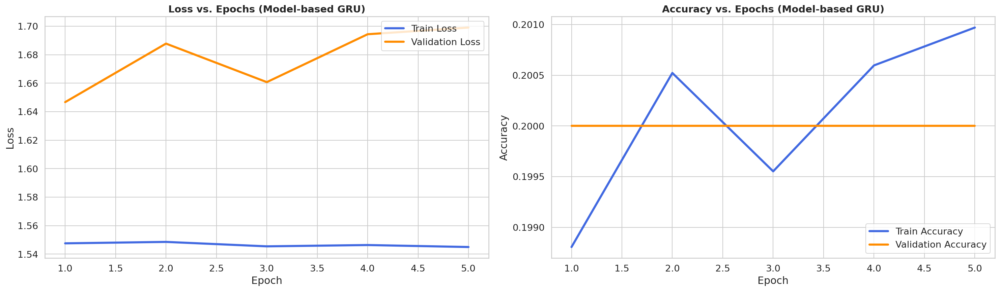

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **LSTM + Glove (300d)**

In [ ]:
EMBEDDING_DIM = 300
embedding_matrix_glove = load_glove_embeddings('/content/drive/MyDrive/glove/glove.6B.300d.txt', word_to_index, EMBEDDING_DIM)

In [26]:
model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=356,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 356, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=712, out_features=5, bias=True)
)

Total trainable parameters: 8157449


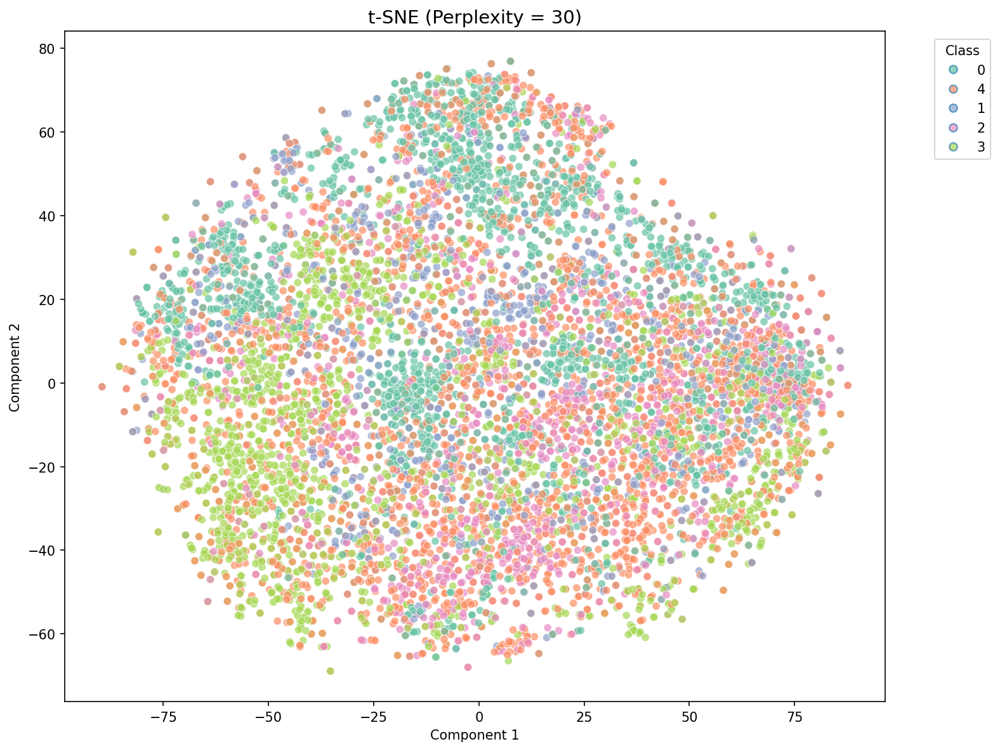

In [27]:
model.eval()
embeddings = []
labels = []

with torch.no_grad():
    for inputs, targets, _ in train_loader:
        inputs = inputs.to(device)

        embedded = model.embedding(inputs)              # e.g. (B, seq_len, emb_dim)
        emb_mean = embedded.mean(dim=1).cpu().numpy()   # (B, emb_dim)
        embeddings.append(emb_mean)
        labels.extend(targets.cpu().numpy())

# Stack to arrays
embeddings = np.vstack(embeddings)
labels = np.array(labels)

labels = pd.Series(labels).astype(str)
n_classes = labels.nunique()
palette = sns.color_palette("Set2", n_colors=n_classes)

perplexity = 30
tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, init='pca')
tsne_result = tsne.fit_transform(embeddings)

fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=labels,
    palette=palette,
    alpha=0.7,
    ax=ax,
    legend=False
)

ax.set_title(f"t-SNE (Perplexity = {perplexity})", fontsize=14)
ax.set_xlabel("Component 1")
ax.set_ylabel("Component 2")

unique_labels = labels.unique()
handles = []
for i, lab in enumerate(unique_labels):
    handles.append(plt.Line2D([0], [0], marker='o', linestyle='', markersize=6,
                              markerfacecolor=palette[i], alpha=0.7, label=lab))

fig.legend(handles=handles, title="Class", bbox_to_anchor=(0.98, 0.95), loc='upper left')

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 7/18 - Train Loss: 1.5343, Val Loss: 1.5404, Train Acc: 20.00%, Val Acc: 20.00%, Val F1: 15.70%, Time: 0.46 min:  39%|███▉      | 7/18 [03:08<04:55, 26.87s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 3 with best val_loss = 1.539886.


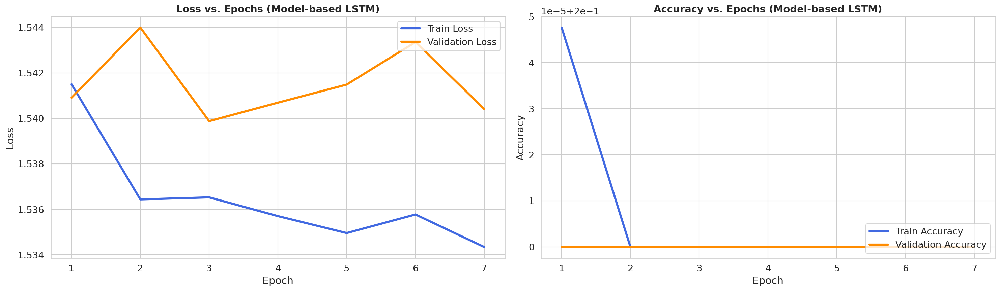

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **LSTM + Glove (300d) + SMOTE**

In [ ]:
model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=450,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 8991605


In [ ]:
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader

BATCH_SIZE = 16

# Convert training tensors to numpy
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

# Create a mapping from vector to raw text for later retrieval
original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_np, X_train)
}

# Apply SMOTE to training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

# Reconstruct raw texts (if possible), else tag as synthetic
raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    raw_text_resampled.append(
        original_text_map.get(key, "[Synthetic sample - no raw text]")
    )

# Convert back to tensors
X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

# Create dataset and dataloader
train_dataset_smote = TextDataset(
    X_resampled_tensor, y_resampled_tensor, raw_text_data=raw_text_resampled
)
train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn  # Preserves original collation behavior
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-2
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 10/18 - Train Loss: 1.6141, Val Loss: 1.6145, Train Acc: 20.43%, Val Acc: 20.00%, Val F1: 3.40%, Time: 1.09 min:  56%|█████▌    | 10/18 [10:53<08:43, 65.40s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 6 with best val_loss = 1.596042.


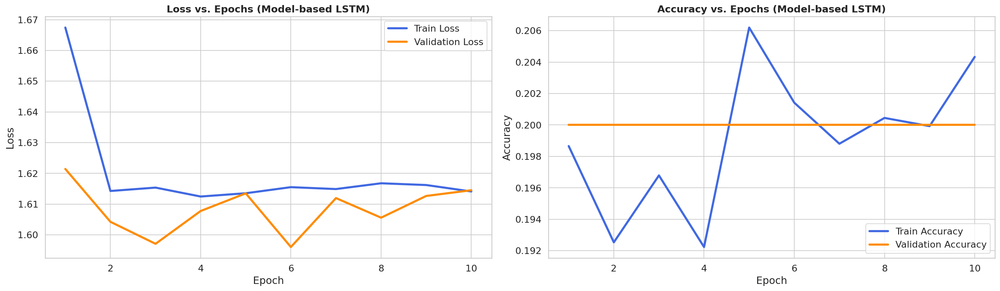

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **LSTM + Glove (300d) + Weight Class**

In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=450,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 8991605


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 5/18 - Train Loss: 1.5340, Val Loss: 1.5414, Train Acc: 20.00%, Val Acc: 20.00%, Val F1: 15.70%, Time: 0.67 min:  28%|██▊       | 5/18 [03:20<08:41, 40.11s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 1.541174.


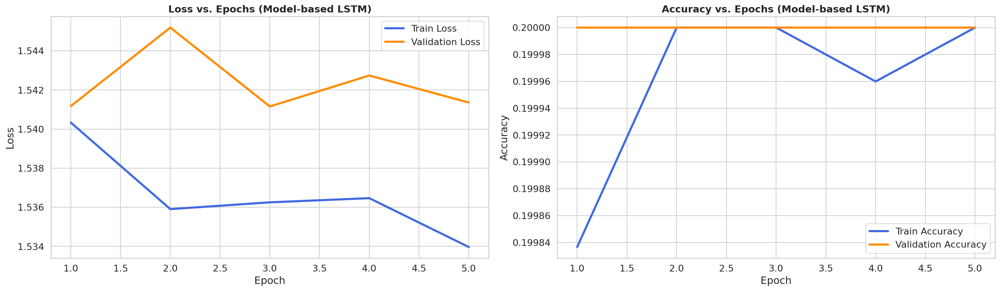

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **LSTM + Fasttext (300d)**

In [ ]:
EMBEDDING_DIM = 300
embedding_matrix_fasttext = load_fasttext_embeddings('/content/drive/MyDrive/cc.en.300.vec/cc.en.300.vec', word_to_index, EMBEDDING_DIM)

In [ ]:
model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=450,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 8991605


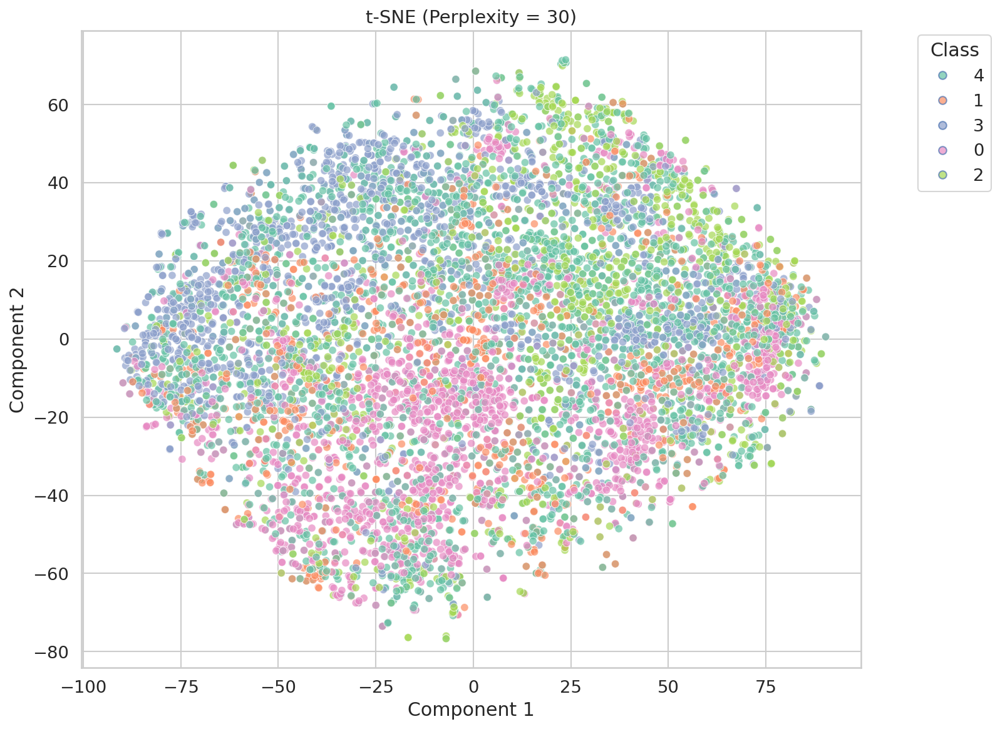

In [ ]:
model.eval()
embeddings = []
labels = []

with torch.no_grad():
    for inputs, targets, _ in train_loader:
        inputs = inputs.to(device)

        embedded = model.embedding(inputs)              # e.g. (B, seq_len, emb_dim)
        emb_mean = embedded.mean(dim=1).cpu().numpy()   # (B, emb_dim)
        embeddings.append(emb_mean)
        labels.extend(targets.cpu().numpy())

# Stack to arrays
embeddings = np.vstack(embeddings)
labels = np.array(labels)

labels = pd.Series(labels).astype(str)
n_classes = labels.nunique()
palette = sns.color_palette("Set2", n_colors=n_classes)

perplexity = 30
tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, init='pca')
tsne_result = tsne.fit_transform(embeddings)

fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=labels,
    palette=palette,
    alpha=0.7,
    ax=ax,
    legend=False
)

ax.set_title(f"t-SNE (Perplexity = {perplexity})", fontsize=14)
ax.set_xlabel("Component 1")
ax.set_ylabel("Component 2")

unique_labels = labels.unique()
handles = []
for i, lab in enumerate(unique_labels):
    handles.append(plt.Line2D([0], [0], marker='o', linestyle='', markersize=6,
                              markerfacecolor=palette[i], alpha=0.7, label=lab))

fig.legend(handles=handles, title="Class", bbox_to_anchor=(0.98, 0.95), loc='upper left')

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 10/18 - Train Loss: 1.5354, Val Loss: 1.5408, Train Acc: 20.00%, Val Acc: 20.00%, Val F1: 15.70%, Time: 0.68 min:  56%|█████▌    | 10/18 [06:40<05:20, 40.05s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 6 with best val_loss = 1.539854.


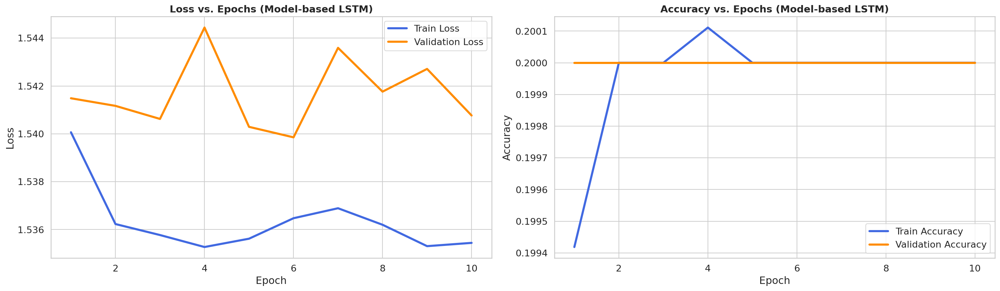

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **LSTM + Fasttext (300d) + SMOTE**

In [ ]:
model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=450,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 8991605


In [ ]:
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader

BATCH_SIZE = 16

# Convert training tensors to numpy
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

# Create a mapping from vector to raw text for later retrieval
original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_np, X_train)
}

# Apply SMOTE to training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

# Reconstruct raw texts (if possible), else tag as synthetic
raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    raw_text_resampled.append(
        original_text_map.get(key, "[Synthetic sample - no raw text]")
    )

# Convert back to tensors
X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

# Create dataset and dataloader
train_dataset_smote = TextDataset(
    X_resampled_tensor, y_resampled_tensor, raw_text_data=raw_text_resampled
)
train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn  # Preserves original collation behavior
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 6/18 - Train Loss: 1.6103, Val Loss: 1.6049, Train Acc: 19.43%, Val Acc: 20.00%, Val F1: 7.86%, Time: 1.08 min:  33%|███▎      | 6/18 [06:31<13:03, 65.28s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 2 with best val_loss = 1.602329.


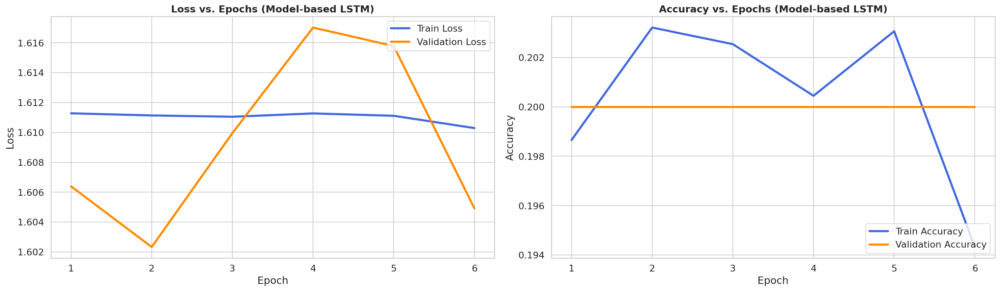

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **LSTM + Fasttext (300d) + Weight Class**

In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=450,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss(class_weights_tensor)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 6/18 - Train Loss: 1.6099, Val Loss: 1.6098, Train Acc: 19.83%, Val Acc: 20.00%, Val F1: 3.40%, Time: 0.68 min:  33%|███▎      | 6/18 [04:04<08:08, 40.70s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 2 with best val_loss = 1.609105.


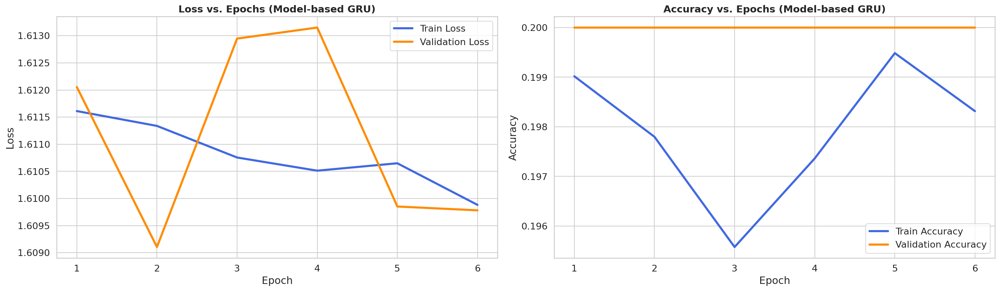

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

# **Adding (Bahdanau) attention for improving model prediction**

In [28]:
class BahdanauAttention(nn.Module):
    """
    Bahdanau Attention Mechanism.

    This class implements the Bahdanau attention mechanism as described in the paper:

    Args:
        hidden_dim (int): The hidden dimension of the GRU output.

    Attributes:
        W (nn.Linear): A linear layer for the transformation of the RNN outputs.
        v (nn.Linear): A linear layer for computing attention scores.
    """
    def __init__(self, hidden_dim):
        super(BahdanauAttention, self).__init__()
        self.W = nn.Linear(hidden_dim * 2, hidden_dim)
        self.v = nn.Linear(hidden_dim, 1, bias=False)

    def forward(self, rnn_outputs):
        """
        Apply the attention mechanism on the RNN outputs.

        Args:
            rnn_outputs (Tensor): The outputs of the RNN (GRU or LSTM).

        Returns:
            Tensor: The context vector computed by the attention mechanism.
        """
        score = torch.tanh(self.W(rnn_outputs))
        attn_weights = torch.softmax(self.v(score), dim=1)
        context = torch.sum(attn_weights * rnn_outputs, dim=1)
        return context

class GRU_BahdanauAttention(nn.Module):
    def __init__(self, embedding_matrix, hidden_dim, num_classes=NUM_CLASSES, num_layers=1, dropout_prob=0.6):
        super(GRU_BahdanauAttention, self).__init__()

        vocab_size, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding.from_pretrained(embedding_matrix, freeze=False)

        self.gru = nn.GRU(
            input_size=embedding_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=True
        )

        self.attention = BahdanauAttention(hidden_dim)
        self.fc = nn.Linear(hidden_dim * 2, num_classes)
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, x):
        embedded = self.embedding(x)
        gru_out, _ = self.gru(embedded)
        context = self.attention(gru_out)
        x = F.relu(context)
        x = self.dropout(x)
        output = self.fc(x)
        return output

class LSTM_BahdanauAttention(nn.Module):
    """
    Bidirectional LSTM with Bahdanau Attention Mechanism.

    Args:
        embedding_matrix (Tensor): Pre-trained embedding matrix.
        hidden_dim (int): Hidden size of the LSTM.
        num_classes (int): Number of output classes.
        num_layers (int): Number of LSTM layers.
        dropout_prob (float): Dropout rate.
    """
    def __init__(self, embedding_matrix, hidden_dim, num_classes=NUM_CLASSES, num_layers=1, dropout_prob=0.6):
        super(LSTM_BahdanauAttention, self).__init__()

        vocab_size, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding.from_pretrained(embedding_matrix, freeze=False)

        self.lstm = nn.LSTM(
            input_size=embedding_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout_prob if num_layers > 1 else 0,
            bidirectional=True
        )

        self.attention = BahdanauAttention(hidden_dim)
        self.dropout = nn.Dropout(dropout_prob)
        self.fc = nn.Linear(hidden_dim * 2, num_classes)

    def forward(self, x):
        embedded = self.embedding(x)                        # [batch_size, seq_len, embedding_dim]
        lstm_out, _ = self.lstm(embedded)                   # [batch_size, seq_len, hidden_dim*2]
        context = self.attention(lstm_out)                  # [batch_size, hidden_dim*2]
        x = F.relu(context)
        x = self.dropout(x)
        output = self.fc(x)                                 # [batch_size, num_classes]
        return output

class LSTM_BahdanauAttention(nn.Module):
    """
    Bidirectional LSTM with Bahdanau Attention Mechanism.

    Args:
        embedding_matrix (Tensor): Pre-trained embedding matrix.
        hidden_dim (int): Hidden size of the LSTM.
        num_classes (int): Number of output classes.
        num_layers (int): Number of LSTM layers.
        dropout_prob (float): Dropout rate.
    """
    def __init__(self, embedding_matrix, hidden_dim, num_classes=NUM_CLASSES, num_layers=1, dropout_prob=0.6):
        super(LSTM_BahdanauAttention, self).__init__()

        vocab_size, embedding_dim = embedding_matrix.shape
        self.embedding = nn.Embedding.from_pretrained(embedding_matrix, freeze=False)

        self.lstm = nn.LSTM(
            input_size=embedding_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout_prob if num_layers > 1 else 0,
            bidirectional=True
        )

        self.attention = BahdanauAttention(hidden_dim)
        self.dropout = nn.Dropout(dropout_prob)
        self.fc = nn.Linear(hidden_dim * 2, num_classes)

    def forward(self, x):
        embedded = self.embedding(x)
        lstm_out, _ = self.lstm(embedded)
        context = self.attention(lstm_out)
        x = self.dropout(context)
        output = self.fc(x)
        return output

## **Validation Phase**

### **Bidirectional GRU + Fasttext (300d) + Bahdanau Attention**

In [ ]:
EMBEDDING_DIM = 300
embedding_matrix_fasttext = load_fasttext_embeddings('/content/drive/MyDrive/cc.en.300.vec/cc.en.300.vec', word_to_index, EMBEDDING_DIM)

In [ ]:
model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (fc): Linear(in_features=900, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

Total trainable parameters: 8720705


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 5/18 - Train Loss: 0.3225, Val Loss: 1.8232, Train Acc: 86.60%, Val Acc: 50.17%, Val F1: 49.40%, Time: 0.98 min:  28%|██▊       | 5/18 [04:48<12:29, 57.69s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 0.941262.


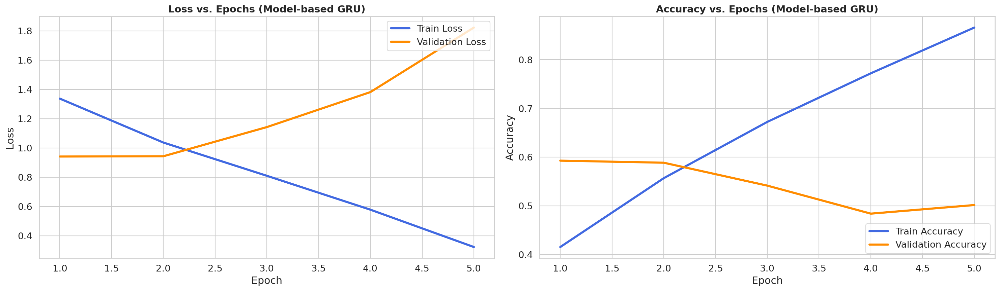

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **Bidirectional GRU + Fasttext (300d) + Bahdanau Attention + SMOTE**

In [ ]:
model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=420, num_layers=1, dropout_prob=0.3).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 420, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=840, out_features=420, bias=True)
    (v): Linear(in_features=420, out_features=1, bias=False)
  )
  (fc): Linear(in_features=840, out_features=5, bias=True)
  (dropout): Dropout(p=0.3, inplace=False)
)

Total trainable parameters: 8457185


In [ ]:
BATCH_SIZE = 16

# Convert training tensors to numpy
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

# Create a mapping from vector to raw text for later retrieval
original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_np, X_train)
}

# Apply SMOTE to training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

# Reconstruct raw texts (if possible), else tag as synthetic
raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    raw_text_resampled.append(
        original_text_map.get(key, "[Synthetic sample - no raw text]")
    )

# Convert back to tensors
X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

# Create dataset and dataloader
train_dataset_smote = TextDataset(
    X_resampled_tensor, y_resampled_tensor, raw_text_data=raw_text_resampled
)
train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn  # Preserves original collation behavior
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 5/18 - Train Loss: 0.2817, Val Loss: 1.9210, Train Acc: 87.78%, Val Acc: 47.91%, Val F1: 47.56%, Time: 0.89 min:  28%|██▊       | 5/18 [04:26<11:32, 53.27s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 0.981128.


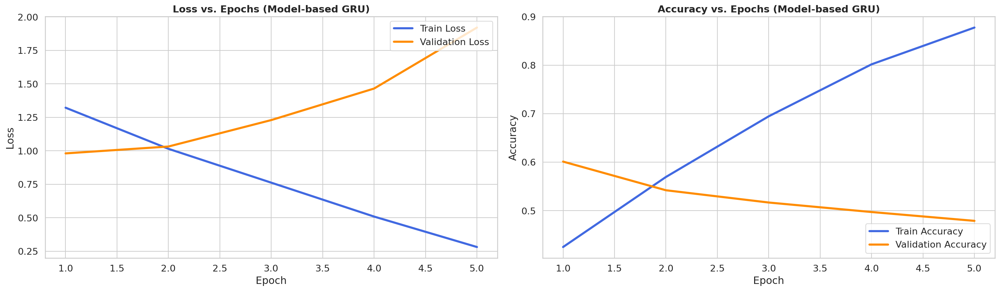

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **Bidirectional GRU + Fasttext (300d) + Bahdanau Attention + Weight Class**

In [ ]:
model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=400, num_layers=1, dropout_prob=0.5).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 400, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=800, out_features=400, bias=True)
    (v): Linear(in_features=400, out_features=1, bias=False)
  )
  (fc): Linear(in_features=800, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

Total trainable parameters: 8289505


In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss(class_weights_tensor)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 5/18 - Train Loss: 0.3553, Val Loss: 1.7515, Train Acc: 85.80%, Val Acc: 50.98%, Val F1: 50.33%, Time: 0.81 min:  28%|██▊       | 5/18 [04:02<10:31, 48.57s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 0.935738.


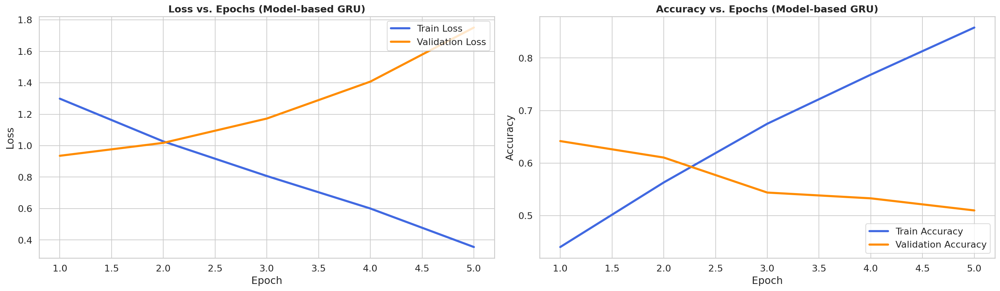

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **Bidirectional GRU + Glove (300d) + Bahdanau Attention**

In [ ]:
EMBEDDING_DIM = 300
embedding_matrix_glove = load_glove_embeddings('/content/drive/MyDrive/glove/glove.6B.300d.txt', word_to_index, EMBEDDING_DIM)

In [ ]:
model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (fc): Linear(in_features=900, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

Total trainable parameters: 8720705


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 5/18 - Train Loss: 0.3459, Val Loss: 1.5694, Train Acc: 85.70%, Val Acc: 51.97%, Val F1: 51.72%, Time: 0.98 min:  28%|██▊       | 5/18 [04:53<12:41, 58.60s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 0.906661.


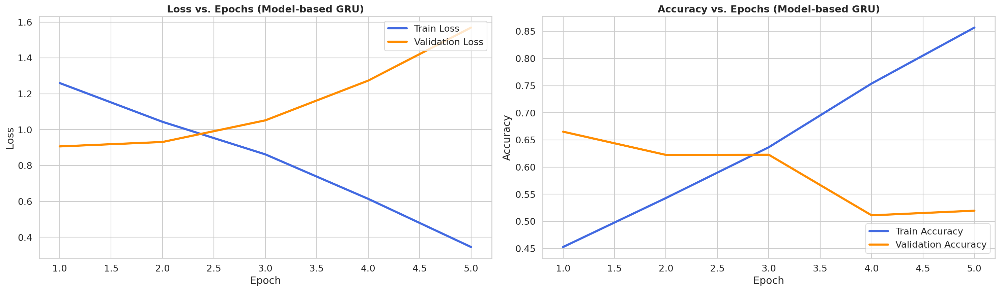

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **Bidirectional GRU + Glove (300d) + Bahdanau Attention +  SMOTE**

In [ ]:
model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (fc): Linear(in_features=900, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

Total trainable parameters: 8720705


In [ ]:
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader

BATCH_SIZE = 16

# Convert training tensors to numpy
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

# Create a mapping from vector to raw text for later retrieval
original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_np, X_train)
}

# Apply SMOTE to training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

# Reconstruct raw texts (if possible), else tag as synthetic
raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    raw_text_resampled.append(
        original_text_map.get(key, "[Synthetic sample - no raw text]")
    )

# Convert back to tensors
X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

# Create dataset and dataloader
train_dataset_smote = TextDataset(
    X_resampled_tensor, y_resampled_tensor, raw_text_data=raw_text_resampled
)
train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn  # Preserves original collation behavior
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 5/18 - Train Loss: 0.3682, Val Loss: 1.5828, Train Acc: 85.00%, Val Acc: 52.90%, Val F1: 52.16%, Time: 1.09 min:  28%|██▊       | 5/18 [05:04<13:10, 60.83s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 0.895515.


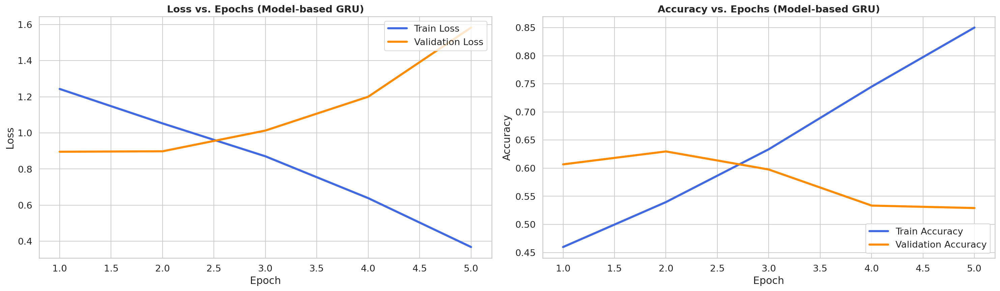

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **Bidirectional GRU + Glove (300d) + Bahdanau Attention + Weight Class**

In [ ]:
model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=400, num_layers=1, dropout_prob=0.5).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 400, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=800, out_features=400, bias=True)
    (v): Linear(in_features=400, out_features=1, bias=False)
  )
  (fc): Linear(in_features=800, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)

Total trainable parameters: 8289505


In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 5/18 - Train Loss: 0.3549, Val Loss: 1.7298, Train Acc: 85.53%, Val Acc: 49.41%, Val F1: 49.87%, Time: 0.81 min:  28%|██▊       | 5/18 [04:31<11:45, 54.26s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 0.971161.


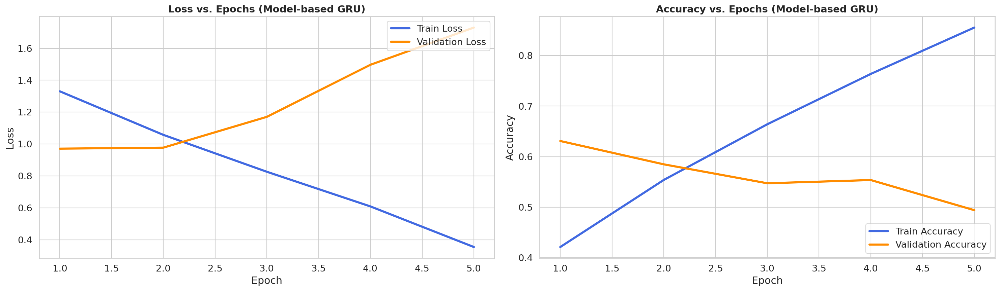

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 2, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

plt.tight_layout()
plt.show()

### **Bidirectional LSTM + Bahdanau Attention + SMOTE**

In [ ]:
model = LSTM_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

LSTM_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)

Total trainable parameters: 9397505


In [ ]:
BATCH_SIZE = 16

# Convert training tensors to numpy
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

# Create a mapping from vector to raw text for later retrieval
original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_np, X_train)
}

# Apply SMOTE to training data
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

# Reconstruct raw texts (if possible), else tag as synthetic
raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    raw_text_resampled.append(
        original_text_map.get(key, "[Synthetic sample - no raw text]")
    )

# Convert back to tensors
X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

# Create dataset and dataloader
train_dataset_smote = TextDataset(
    X_resampled_tensor, y_resampled_tensor, raw_text_data=raw_text_resampled
)
train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn  # Preserves original collation behavior
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, test_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Epoch 5/18 - Train Loss: 0.2278, Val Loss: 1.7912, Train Acc: 87.69%, Val Acc: 45.89%, Val F1: 47.20%, Time: 1.40 min:  28%|██▊       | 5/18 [07:17<18:57, 87.53s/epoch]


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 1.331789.


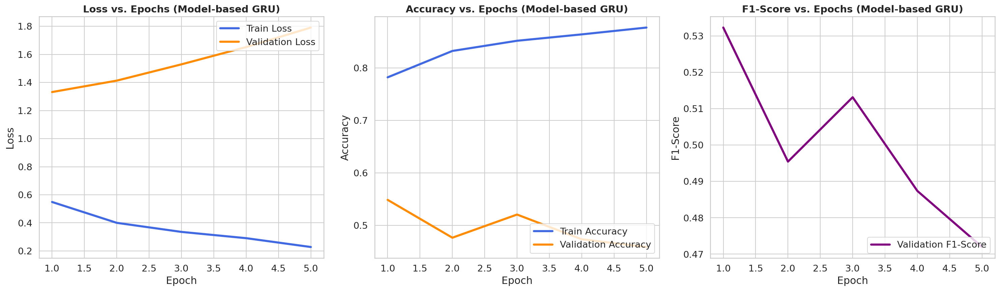

In [ ]:
# Set style and font size
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 3, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 3, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# === 3. F1-Score Curve ===
plt.subplot(1, 3, 3)
sns.lineplot(x=range(1, len(val_f1s) + 1), y=val_f1s, label='Validation F1-Score', color='purple')
plt.xlabel('Epoch')
plt.ylabel('F1-Score')
plt.title('F1-Score vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# Layout adjustment and display
plt.tight_layout()
plt.show()

### **Bidirectional LSTM + Bahdanau Attention + Weight Class**

In [ ]:
model = LSTM_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

print(model)
num_params = count_parameters(model)
print()
print(f"Total trainable parameters: {num_params}")

In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)


train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_epoch(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = validate_epoch(model, test_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

In [ ]:
# Set style and font size
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 3, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 3, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# === 3. F1-Score Curve ===
plt.subplot(1, 3, 3)
sns.lineplot(x=range(1, len(val_f1s) + 1), y=val_f1s, label='Validation F1-Score', color='purple')
plt.xlabel('Epoch')
plt.ylabel('F1-Score')
plt.title('F1-Score vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# Layout adjustment and display
plt.tight_layout()
plt.show()

# **V. Using contextual embeddings as input**

#### **V.1 BionmedNLP as embeddings**

In [29]:
# --- PubMedBERT Setup ---
BiomedNLP_model_name = "microsoft/BiomedNLP-PubMedBERT-base-uncased-abstract-fulltext"
tokenizer = AutoTokenizer.from_pretrained(BiomedNLP_model_name)
BiomedNLP = AutoModel.from_pretrained(BiomedNLP_model_name).to(device)

for param in BiomedNLP.parameters():
    param.requires_grad = True

BATCH_SIZE = 16

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [30]:
class BiomedNLP_GRU_Attention(nn.Module):
    """
    Model combining BiomedNLP embeddings, GRU layers, and Bahdanau Attention mechanism for multi-class classification.

    Args:
        bert_dim (int): The dimension of the PubMedBERT embeddings (usually 768).
        hidden_dim (int): The hidden dimension of the GRU layer.
        num_classes (int): The number of output classes for classification (default is 5 for multi-class classification).
        num_layers (int): The number of layers in the GRU (default is 1).
        dropout_prob (float): Dropout probability for regularization.

    Attributes:
        gru (nn.GRU): A bidirectional GRU layer.
        attention (BahdanauAttention): The Bahdanau attention mechanism.
        fc (nn.Linear): The fully connected layer to produce the output predictions.
        dropout (nn.Dropout): Dropout layer for regularization.
    """
    def __init__(self, bert_dim, hidden_dim, num_classes=NUM_CLASSES, num_layers=1, dropout_prob=0.6):
        super(BiomedNLP_GRU_Attention, self).__init__()

        self.gru = nn.GRU(
            input_size=bert_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=True
        )

        self.attention = BahdanauAttention(hidden_dim)
        self.fc = nn.Linear(hidden_dim * 2, num_classes)
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, input_ids, attention_mask):
        """
        Forward pass of the model.

        Args:
            input_ids (Tensor): The tokenized input sequence IDs.
            attention_mask (Tensor): The attention mask to differentiate padding from real tokens.

        Returns:
            Tensor: The output logits for classification.
        """
        with torch.no_grad():
            bert_outputs = BiomedNLP(input_ids=input_ids, attention_mask=attention_mask)
        bert_embeds = bert_outputs.last_hidden_state
        gru_out, _ = self.gru(bert_embeds)
        context = self.attention(gru_out)
        x = self.dropout(context)
        output = self.fc(x)  # Logits for multi-class classification
        return output

class BiomedNLP_LSTM_Attention(nn.Module):
    """
    Model combining BiomedNLP embeddings, LSTM layers, and Bahdanau Attention mechanism for multi-class classification.

    Args:
        bert_dim (int): The dimension of the PubMedBERT embeddings (usually 768).
        hidden_dim (int): The hidden dimension of the LSTM layer.
        num_classes (int): Number of output classes.
        num_layers (int): Number of stacked LSTM layers.
        dropout_prob (float): Dropout probability for regularization.
    """
    def __init__(self, bert_dim, hidden_dim, num_classes=NUM_CLASSES, num_layers=1, dropout_prob=0.6):
        super(BiomedNLP_LSTM_Attention, self).__init__()

        self.lstm = nn.LSTM(
            input_size=bert_dim,
            hidden_size=hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            bidirectional=True
        )

        self.attention = BahdanauAttention(hidden_dim)
        self.fc = nn.Linear(hidden_dim * 2, num_classes)
        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, input_ids, attention_mask):
        """
        Forward pass of the model.

        Args:
            input_ids (Tensor): The tokenized input sequence IDs.
            attention_mask (Tensor): The attention mask to differentiate padding from real tokens.

        Returns:
            Tensor: The output logits for classification.
        """
        with torch.no_grad():
            bert_outputs = BiomedNLP(input_ids=input_ids, attention_mask=attention_mask)
        bert_embeds = bert_outputs.last_hidden_state
        lstm_out, _ = self.lstm(bert_embeds)
        context = self.attention(lstm_out)
        x = self.dropout(context)
        output = self.fc(x)
        return output

In [31]:
def count_parameters(model):
    """
    Count the number of trainable parameters in the model.
    Args:
        model: The model whose parameters are to be counted.
    Returns:
        Total number of trainable parameters.
    """
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def train_model(model, dataloader, optimizer, criterion, device):
    """
    Train the model for one epoch, calculating loss and accuracy.
    Args:
        model: The model to train.
        dataloader: DataLoader for the training dataset.
        optimizer: Optimizer for model parameters.
        criterion: Loss function.
        device: CPU/GPU device.
    Returns:
        Average loss and accuracy for the epoch.
    """
    model.train()
    total_loss = 0
    total_correct = 0
    total_samples = 0

    for batch in dataloader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        optimizer.zero_grad()
        logits = model(input_ids, attention_mask)

        loss = criterion(logits, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        preds = torch.argmax(logits, dim=1).cpu().detach().numpy()
        total_correct += np.sum(preds == labels.cpu().numpy())
        total_samples += labels.size(0)

    avg_loss = total_loss / len(dataloader)
    avg_accuracy = total_correct / total_samples
    return avg_loss, avg_accuracy

def evaluate_model(model, dataloader, criterion, device):
    model.eval()
    all_preds = []
    all_labels = []
    val_loss = 0.0

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            logits = model(input_ids, attention_mask)
            loss = criterion(logits, labels)
            val_loss += loss.item()

            preds = torch.argmax(logits, dim=1).cpu().numpy()
            labels_cpu = labels.cpu().numpy()

            all_preds.extend(preds)
            all_labels.extend(labels_cpu)

    val_loss /= len(dataloader)
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)

    balanced_acc = balanced_accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average="weighted")

    return balanced_acc, f1, val_loss

def test_model(model, test_loader, criterion, device):
    """
    Evaluate the model on the test dataset, calculating loss, accuracy, F1-score, precision, recall, and balanced accuracy.
    Args:
        model: The model to evaluate.
        test_loader: DataLoader for the test dataset.
        criterion: Loss function (CrossEntropyLoss).
        device: CPU/GPU device.
    Returns:
        Average test loss, accuracy, F1-score, balanced accuracy, recall, and precision.
    """
    model.eval()
    total_loss = 0
    total_accuracy = 0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for batch in test_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            target_tensor = batch['labels'].to(device)

            output = model(input_ids, attention_mask)
            loss = criterion(output, target_tensor)
            total_loss += loss.item()

            batch_accuracy = accuracy_score(target_tensor.cpu(), torch.argmax(output, dim=1).cpu())
            total_accuracy += batch_accuracy * len(target_tensor)

            preds = torch.argmax(output, dim=1).cpu().numpy()
            labels = target_tensor.cpu().numpy()

            all_preds.extend(preds)
            all_labels.extend(labels)

    avg_loss = total_loss / len(test_loader)
    avg_accuracy = total_accuracy / len(test_loader.dataset)
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)

    f1 = f1_score(all_labels, all_preds, average="weighted", zero_division=0)
    balanced_acc = balanced_accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average="weighted", zero_division=0)
    recall = recall_score(all_labels, all_preds, average="weighted", zero_division=0)

    return avg_loss, avg_accuracy, f1, balanced_acc, recall, precision

def custom_collate_fn(batch):
    """
    Custom collate function to combine input tensors, target tensors, and raw texts into a batch.
    Stacks inputs and targets into tensors, returns raw texts as a list.

    Args:
        batch (list): List of tuples containing input tensor, target tensor, and raw text.

    Returns:
        tuple: Stacked inputs tensor, stacked targets tensor, and list of raw texts.
    """
    inputs, targets, raw_texts = zip(*batch)
    inputs = torch.stack(inputs)
    targets = torch.stack(targets)
    return inputs, targets, list(raw_texts)

In [32]:
class BiomedNLPDataset(Dataset):
    """
    Dataset class for multi-class classification using PubMedBERT embeddings.

    Args:
        texts (list of str): A list of raw text sequences.
        labels (list of int): A list of integer labels (0-4) corresponding to each text.
        tokenizer (transformers tokenizer): A tokenizer to preprocess the text data.
        max_length (int): Maximum length for padding/truncation. Default is 500.

    Attributes:
        texts (list of str): The raw text data.
        encodings (dict): Tokenized text data with input IDs and attention masks.
        labels (Tensor): Tensor of integer labels for the classification task.
    """

    def __init__(self, texts, labels, tokenizer, max_length=500):
        self.texts = texts
        self.encodings = tokenizer(texts, padding='max_length', truncation=True, max_length=max_length, return_tensors='pt')
        self.labels = torch.tensor(labels, dtype=torch.long)

    def __getitem__(self, idx):
        """
        Retrieve a single sample from the dataset.

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            dict: Contains input IDs, attention masks, and the corresponding label and raw text.
        """
        item = {key: val[idx] for key, val in self.encodings.items()}
        item['labels'] = self.labels[idx]
        item['text'] = self.texts[idx]
        return item

    def __len__(self):
        """
        Returns the total number of samples in the dataset.

        Returns:
            int: Number of samples in the dataset.
        """
        return len(self.labels)

## **Validation Phase**

#### **Bidirectional GRU + BiomedNLP + Bahdanau Attention + No Resampling**

In [33]:
# --- Load Data ---
train_dataset = BiomedNLPDataset(X_train.tolist(), y_train, tokenizer)
val_dataset = BiomedNLPDataset(X_val.tolist(), y_val, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Combine the training and validation datasets (for test)
combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [34]:
BERT_DIM = 768
HIDDEN_DIM = 256
DROPOUT = 0.8

model = BiomedNLP_GRU_Attention(BERT_DIM, HIDDEN_DIM,num_layers=1, dropout_prob=DROPOUT).to(device)
print()
print(f"{count_parameters(model)} model parameters")
print()
print(model)


1710085 model parameters

BiomedNLP_GRU_Attention(
  (gru): GRU(768, 256, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=512, out_features=256, bias=True)
    (v): Linear(in_features=256, out_features=1, bias=False)
  )
  (fc): Linear(in_features=512, out_features=5, bias=True)
  (dropout): Dropout(p=0.8, inplace=False)
)


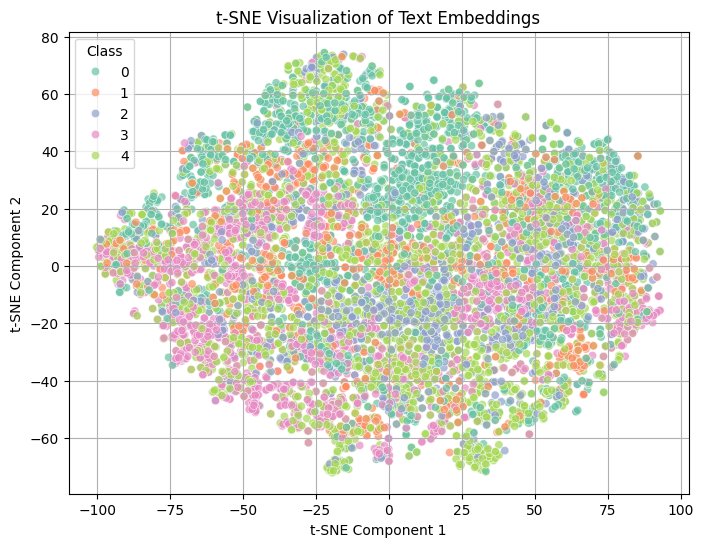

In [35]:
model.eval()

embeddings = []
labels = []

with torch.no_grad():
    for batch in train_loader:
        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels_batch = batch['labels']

        bert_outputs = BiomedNLP(input_ids=input_ids, attention_mask=attention_mask)
        bert_embeds = bert_outputs.last_hidden_state  # [batch_size, seq_len, 768]

        # Mean pooling
        pooled = bert_embeds.mean(dim=1)  # [batch_size, 768]

        embeddings.append(pooled.cpu().numpy())
        labels.extend(labels_batch.cpu().numpy())

labels = np.array(labels)
embeddings = np.vstack(embeddings)
labels = np.array(labels)

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
tsne_result = tsne.fit_transform(embeddings)

plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=labels,
    palette="Set2",
    alpha=0.7
)
plt.title("t-SNE Visualization of Text Embeddings")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend(title="Class")
plt.grid(True)
plt.show()

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_model(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = evaluate_model(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Training Progress:   0%|          | 0/18 [00:00<?, ?epoch/s]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 1/18 - Train Loss: 1.0426, Val Loss: 0.6053, Train Acc: 57.23%, Val Acc: 61.15%, Val F1: 88.07%, Time: 4.92 min:   6%|▌         | 1/18 [04:55<1:23:35, 295.05s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 2/18 - Train Loss: 0.9067, Val Loss: 0.6519, Train Acc: 62.28%, Val Acc: 64.69%, Val F1: 81.27%, Time: 4.85 min:  11%|█         | 2/18 [09:46<1:18:03, 292.71s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is 


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 0.605302.


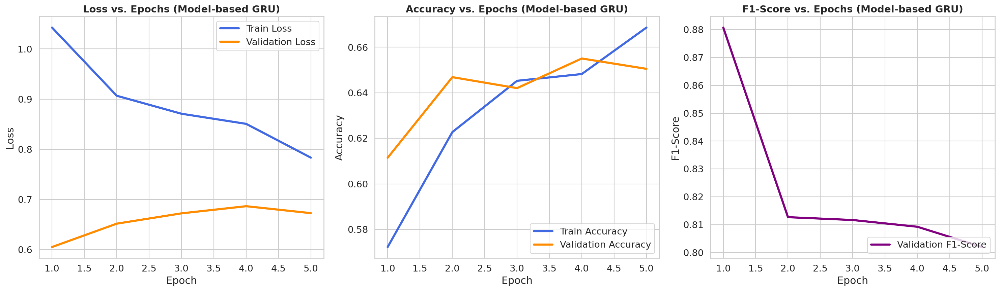

In [ ]:
# Set style and font size
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 3, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 3, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# === 3. F1-Score Curve ===
plt.subplot(1, 3, 3)
sns.lineplot(x=range(1, len(val_f1s) + 1), y=val_f1s, label='Validation F1-Score', color='purple')
plt.xlabel('Epoch')
plt.ylabel('F1-Score')
plt.title('F1-Score vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# Layout adjustment and display
plt.tight_layout()
plt.show()

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 256
DROPOUT = 0.8

model = BiomedNLP_GRU_Attention(BERT_DIM, HIDDEN_DIM,num_layers=1, dropout_prob=DROPOUT).to(device)
print()
print(f"{count_parameters(model)} model parameters")
print()
print(model)


1710085 model parameters

BiomedNLP_GRU_Attention(
  (gru): GRU(768, 256, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=512, out_features=256, bias=True)
    (v): Linear(in_features=256, out_features=1, bias=False)
  )
  (fc): Linear(in_features=512, out_features=5, bias=True)
  (dropout): Dropout(p=0.8, inplace=False)
)


#### **Bidirectional GRU + BiomedNLP + Bahdanau Attention + SMOTE**

In [ ]:
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

original_text_map = {tuple(vec): text for vec, text in zip(X_train_np, X_train)}

smote = SMOTE(sampling_strategy='minority', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    if key in original_text_map:
        raw_text_resampled.append(original_text_map[key])
    else:
        raw_text_resampled.append("[Synthetic sample - no raw text]")

X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

train_dataset_smote = BiomedNLPDataset(raw_text_resampled, y_resampled_np, tokenizer)
val_dataset = BiomedNLPDataset(X_val.tolist(), y_val, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader_smote = DataLoader(train_dataset_smote, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
learning_rate = 1e-4
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_model(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = evaluate_model(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Training Progress:   0%|          | 0/18 [00:00<?, ?epoch/s]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 1/18 - Train Loss: 0.7987, Val Loss: 0.6092, Train Acc: 67.07%, Val Acc: 62.45%, Val F1: 83.53%, Time: 5.83 min:   6%|▌         | 1/18 [05:49<1:39:06, 349.81s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 2/18 - Train Loss: 0.6898, Val Loss: 0.6851, Train Acc: 71.30%, Val Acc: 64.74%, Val F1: 82.50%, Time: 5.80 min:  11%|█         | 2/18 [11:37<1:32:59, 348.75s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is 


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 0.609214.


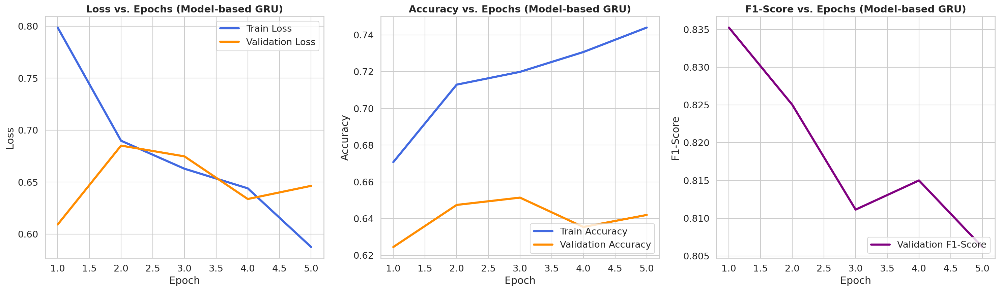

In [ ]:
# Set style and font size
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 3, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 3, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# === 3. F1-Score Curve ===
plt.subplot(1, 3, 3)
sns.lineplot(x=range(1, len(val_f1s) + 1), y=val_f1s, label='Validation F1-Score', color='purple')
plt.xlabel('Epoch')
plt.ylabel('F1-Score')
plt.title('F1-Score vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# Layout adjustment and display
plt.tight_layout()
plt.show()

#### **Bidirectional GRU + BiomedNLP  + Bahdanau Attention + Weight Class**

In [ ]:
BATCH_SIZE = 16

# --- Load Data ---
train_dataset = BiomedNLPDataset(X_train.tolist(), y_train, tokenizer)
val_dataset = BiomedNLPDataset(X_val.tolist(), y_val, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Combine the training and validation datasets (for test)
combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 256
DROPOUT = 0.5

model = BiomedNLP_GRU_Attention(BERT_DIM, HIDDEN_DIM,num_layers=1, dropout_prob=DROPOUT).to(device)
print()
print(f"{count_parameters(model)} model parameters")
print()
print(model)


1710085 model parameters

BiomedNLP_GRU_Attention(
  (gru): GRU(768, 256, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=512, out_features=256, bias=True)
    (v): Linear(in_features=256, out_features=1, bias=False)
  )
  (fc): Linear(in_features=512, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)


In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss(class_weights_tensor)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_model(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = evaluate_model(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Training Progress:   0%|          | 0/18 [00:00<?, ?epoch/s]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 1/18 - Train Loss: 0.9485, Val Loss: 0.6681, Train Acc: 58.73%, Val Acc: 62.18%, Val F1: 83.83%, Time: 4.82 min:   6%|▌         | 1/18 [04:49<1:22:00, 289.41s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 2/18 - Train Loss: 0.8008, Val Loss: 0.6835, Train Acc: 64.35%, Val Acc: 64.04%, Val F1: 80.19%, Time: 4.82 min:  11%|█         | 2/18 [09:38<1:17:07, 289.20s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is 


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 1 with best val_loss = 0.668124.


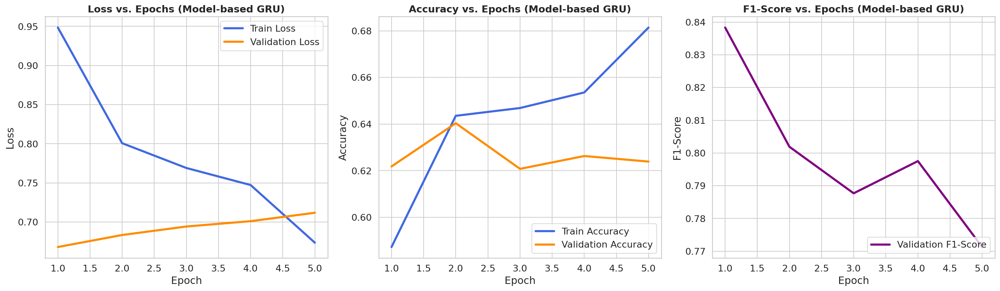

In [ ]:
# Set style and font size
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 3, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 3, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# === 3. F1-Score Curve ===
plt.subplot(1, 3, 3)
sns.lineplot(x=range(1, len(val_f1s) + 1), y=val_f1s, label='Validation F1-Score', color='purple')
plt.xlabel('Epoch')
plt.ylabel('F1-Score')
plt.title('F1-Score vs. Epochs (Model-based GRU)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# Layout adjustment and display
plt.tight_layout()
plt.show()

#### **Bidirectional LSTM + BiomedNLP + Bahdanau Attention + No Resampling**

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 386
DROPOUT = 0.5

model = BiomedNLP_LSTM_Attention(BERT_DIM, HIDDEN_DIM, dropout_prob=DROPOUT).to(device)
print()
print(f"{count_parameters(model)} model parameters")
print()
print(model)


3872357 model parameters

BiomedNLP_LSTM_Attention(
  (lstm): LSTM(768, 386, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=772, out_features=386, bias=True)
    (v): Linear(in_features=386, out_features=1, bias=False)
  )
  (fc): Linear(in_features=772, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)


In [ ]:
# --- Load Data ---
train_dataset = BiomedNLPDataset(X_train.tolist(), y_train, tokenizer)
val_dataset = BiomedNLPDataset(X_val.tolist(), y_val, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Combine the training and validation datasets (for test)
combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_model(model, train_loader, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = evaluate_model(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Training Progress:   0%|          | 0/18 [00:00<?, ?epoch/s]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 1/18 - Train Loss: 0.9734, Val Loss: 0.6754, Train Acc: 59.86%, Val Acc: 63.38%, Val F1: 84.98%, Time: 5.30 min:   6%|▌         | 1/18 [05:18<1:30:07, 318.08s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 2/18 - Train Loss: 0.8291, Val Loss: 0.6687, Train Acc: 64.47%, Val Acc: 62.30%, Val F1: 82.36%, Time: 5.28 min:  11%|█         | 2/18 [10:35<1:24:39, 317.46s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is 


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 3 with best val_loss = 0.600767.


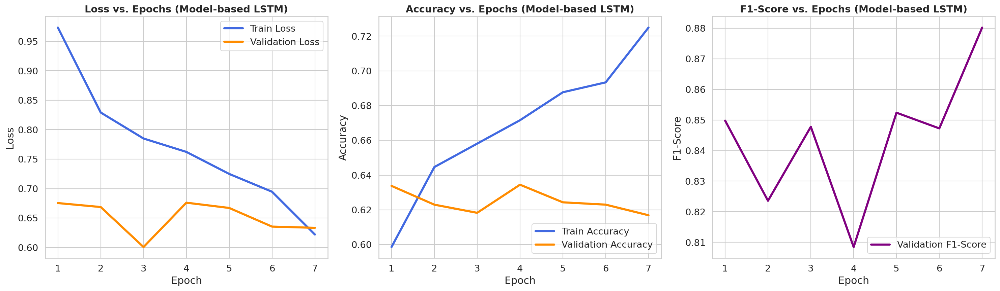

In [ ]:
# Set style and font size
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 3, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 3, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# === 3. F1-Score Curve ===
plt.subplot(1, 3, 3)
sns.lineplot(x=range(1, len(val_f1s) + 1), y=val_f1s, label='Validation F1-Score', color='purple')
plt.xlabel('Epoch')
plt.ylabel('F1-Score')
plt.title('F1-Score vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# Layout adjustment and display
plt.tight_layout()
plt.show()

#### **Bidirectional LSTM + BiomedNLP + Bahdanau Attention + SMOTE**

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 386
DROPOUT = 0.5

model = BiomedNLP_LSTM_Attention(BERT_DIM, HIDDEN_DIM, dropout_prob=DROPOUT).to(device)
print()
print(f"{count_parameters(model)} model parameters")
print()
print(model)


3872357 model parameters

BiomedNLP_LSTM_Attention(
  (lstm): LSTM(768, 386, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=772, out_features=386, bias=True)
    (v): Linear(in_features=386, out_features=1, bias=False)
  )
  (fc): Linear(in_features=772, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)


In [ ]:
X_train_np = X_train_tensor.cpu().numpy()
y_train_np = y_train_tensor.cpu().numpy()

original_text_map = {tuple(vec): text for vec, text in zip(X_train_np, X_train)}

smote = SMOTE(sampling_strategy='minority', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_np, y_train_np)

raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    if key in original_text_map:
        raw_text_resampled.append(original_text_map[key])
    else:
        raw_text_resampled.append("[Synthetic sample - no raw text]")

X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

train_dataset_smote = BiomedNLPDataset(raw_text_resampled, y_resampled_np, tokenizer)
val_dataset = BiomedNLPDataset(X_val.tolist(), y_val, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader_smote = DataLoader(train_dataset_smote, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_model(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = evaluate_model(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Training Progress:   0%|          | 0/18 [00:00<?, ?epoch/s]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 1/18 - Train Loss: 0.8001, Val Loss: 0.6665, Train Acc: 66.26%, Val Acc: 62.33%, Val F1: 86.75%, Time: 6.30 min:   6%|▌         | 1/18 [06:17<1:47:04, 377.90s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 2/18 - Train Loss: 0.6781, Val Loss: 0.6621, Train Acc: 71.49%, Val Acc: 63.36%, Val F1: 81.02%, Time: 6.29 min:  11%|█         | 2/18 [12:35<1:40:39, 377.45s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is 


Early stopping triggered (no improvement in 4 epochs).
Restored best model from epoch 6 with best val_loss = 0.555024.


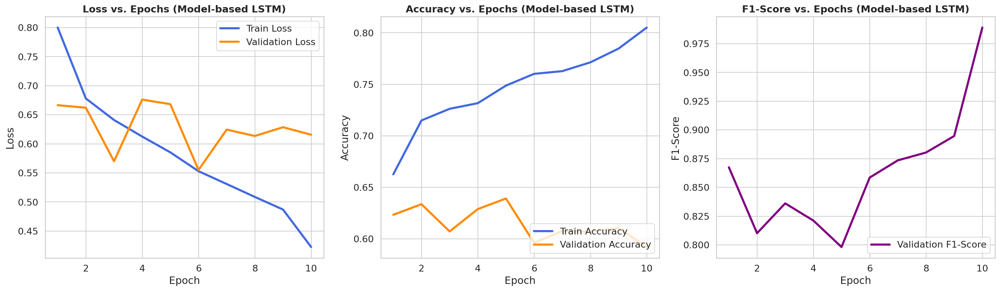

In [ ]:
# Set style and font size
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 3, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 3, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# === 3. F1-Score Curve ===
plt.subplot(1, 3, 3)
sns.lineplot(x=range(1, len(val_f1s) + 1), y=val_f1s, label='Validation F1-Score', color='purple')
plt.xlabel('Epoch')
plt.ylabel('F1-Score')
plt.title('F1-Score vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# Layout adjustment and display
plt.tight_layout()
plt.show()

#### **Bidirectional LSTM + BiomedNLP + Bahdanau Attention + Weight Class**

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 386
DROPOUT = 0.5

model = BiomedNLP_LSTM_Attention(BERT_DIM, HIDDEN_DIM, dropout_prob=DROPOUT).to(device)
print()
print(f"{count_parameters(model)} model parameters")
print()
print(model)


3872357 model parameters

BiomedNLP_LSTM_Attention(
  (lstm): LSTM(768, 386, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=772, out_features=386, bias=True)
    (v): Linear(in_features=386, out_features=1, bias=False)
  )
  (fc): Linear(in_features=772, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)


In [ ]:
BATCH_SIZE = 16

# --- Load Data ---
train_dataset = BiomedNLPDataset(X_train.tolist(), y_train, tokenizer)
val_dataset = BiomedNLPDataset(X_val.tolist(), y_val, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Combine the training and validation datasets (for test)
combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=BATCH_SIZE, shuffle=True)

class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

In [ ]:
model.eval()
embeddings = []
labels = []

with torch.no_grad():
    for inputs, targets, _ in train_loader:
        inputs = inputs.to(device)

        embedded = model.embedding(inputs)              # e.g. (B, seq_len, emb_dim)
        emb_mean = embedded.mean(dim=1).cpu().numpy()   # (B, emb_dim)
        embeddings.append(emb_mean)
        labels.extend(targets.cpu().numpy())

# Stack to arrays
embeddings = np.vstack(embeddings)
labels = np.array(labels)

labels = pd.Series(labels).astype(str)
n_classes = labels.nunique()
palette = sns.color_palette("Set2", n_colors=n_classes)

perplexity = 30
tsne = TSNE(n_components=2, perplexity=perplexity, random_state=42, init='pca')
tsne_result = tsne.fit_transform(embeddings)

fig, ax = plt.subplots(figsize=(10, 8), dpi=150)
sns.scatterplot(
    x=tsne_result[:, 0],
    y=tsne_result[:, 1],
    hue=labels,
    palette=palette,
    alpha=0.7,
    ax=ax,
    legend=False
)

ax.set_title(f"t-SNE (Perplexity = {perplexity})", fontsize=14)
ax.set_xlabel("Component 1")
ax.set_ylabel("Component 2")

unique_labels = labels.unique()
handles = []
for i, lab in enumerate(unique_labels):
    handles.append(plt.Line2D([0], [0], marker='o', linestyle='', markersize=6,
                              markerfacecolor=palette[i], alpha=0.7, label=lab))

fig.legend(handles=handles, title="Class", bbox_to_anchor=(0.98, 0.95), loc='upper left')

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()

In [ ]:
learning_rate = 1e-3
num_epochs = 18
patience = 4
min_delta = 1e-4
monitor = "val_loss"

loss_function = torch.nn.CrossEntropyLoss(class_weights_tensor)
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min' if monitor == "val_loss" else 'max',
    factor=0.5,
    patience=2,
    verbose=True,
    min_lr=1e-7
)

train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
val_f1s = []

best_metric = float('inf') if monitor == "val_loss" else -float('inf')
best_epoch = -1
stalled_epochs = 0
best_state = None

with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_model(model, train_loader_smote, optimizer, loss_function, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        val_loss, val_acc, val_f1 = evaluate_model(model, val_loader, loss_function, device)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        val_f1s.append(val_f1)

        current_metric = val_loss if monitor == "val_loss" else val_f1
        scheduler.step(current_metric)

        # Early stopping logic
        improved = False
        if monitor == "val_loss":
            if current_metric < best_metric - min_delta:
                improved = True
        else:  # monitor == "val_f1"
            if current_metric > best_metric + min_delta:
                improved = True

        if improved:
            best_metric = current_metric
            best_epoch = epoch
            stalled_epochs = 0
            # save best weights (in-memory)
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        else:
            stalled_epochs += 1

        end_time = time.time()
        epoch_duration = end_time - start_time
        pbar.set_description(
            f"Epoch {epoch+1}/{num_epochs} - Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
            f"Train Acc: {train_acc:.2%}, Val Acc: {val_acc:.2%}, Val F1: {val_f1:.2%}, Time: {epoch_duration / 60:.2f} min"
        )
        pbar.update(1)

        if stalled_epochs >= patience:
            print(f"\nEarly stopping triggered (no improvement in {patience} epochs).")
            break

if best_state is not None:
    model.load_state_dict(best_state)
    print(f"Restored best model from epoch {best_epoch+1} with best {monitor} = {best_metric:.6f}.")
else:
    print("No best state recorded (no improvement during training).")

Training Progress:   0%|          | 0/18 [00:00<?, ?epoch/s]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 1/18 - Train Loss: 0.6896, Val Loss: 0.6957, Train Acc: 64.71%, Val Acc: 59.96%, Val F1: 82.11%, Time: 6.29 min:   6%|▌         | 1/18 [06:17<1:46:56, 377.44s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is deprecated and will be removed in version 4.55.0 for `BertSdpaSelfAttention.forward`.
  return forward_call(*args, **kwargs)
Epoch 2/18 - Train Loss: 0.5661, Val Loss: 0.6936, Train Acc: 70.38%, Val Acc: 64.31%, Val F1: 78.59%, Time: 6.27 min:  11%|█         | 2/18 [12:33<1:40:28, 376.76s/epoch]/usr/local/lib/python3.11/dist-packages/torch/nn/modules/module.py:1750: FutureWarning: `encoder_attention_mask` is 

In [ ]:
# Set style and font size
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

# High-resolution figure
plt.figure(figsize=(20, 6), dpi=150)

# === 1. Loss Curve ===
plt.subplot(1, 3, 1)
sns.lineplot(x=range(1, len(train_losses) + 1), y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=range(1, len(val_losses) + 1), y=val_losses, label='Validation Loss', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='upper right')

# === 2. Accuracy Curve ===
plt.subplot(1, 3, 2)
sns.lineplot(x=range(1, len(train_accuracies) + 1), y=train_accuracies, label='Train Accuracy', color='royalblue')
sns.lineplot(x=range(1, len(val_accuracies) + 1), y=val_accuracies, label='Validation Accuracy', color='darkorange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# === 3. F1-Score Curve ===
plt.subplot(1, 3, 3)
sns.lineplot(x=range(1, len(val_f1s) + 1), y=val_f1s, label='Validation F1-Score', color='purple')
plt.xlabel('Epoch')
plt.ylabel('F1-Score')
plt.title('F1-Score vs. Epochs (Model-based LSTM)', fontsize=14, weight='bold')
plt.legend(frameon=True, loc='lower right')

# Layout adjustment and display
plt.tight_layout()
plt.show()

# **IV. Test Phase**

## **1.Model-based LSTM and GRU with embeddings learn from scratch**

In [ ]:
def train_and_evaluate(model_name, model, train_loader, test_loader, word_to_index, criterion, device, patience=4, num_epochs=30):
    print(f"\n🔷 Training {model_name} model")
    print(model)
    num_params = count_parameters(model)
    print(f"Total trainable parameters: {num_params}\n")

    # --- Set learning rate based on model type ---
    if model_name.upper() == "LSTM":
        learning_rate = 1e-3
    elif model_name.upper() == "GRU":
        learning_rate = 1e-4
    else:
        learning_rate = 1e-3

    best_model_path = f"best_{model_name}.pth"

    optimizer = torch.optim.RMSprop(model.parameters(), lr=learning_rate)
    loss_function = criterion

    # --- Tracking ---
    train_losses, test_losses = [], []
    train_accuracies, test_accuracies = [], []
    test_f1s, test_bal_accs, test_recalls, test_precisions = [], [], [], []

    best_bal_acc = 0
    patience_counter = 0

    with tqdm(total=num_epochs, desc=f"{model_name} Training", unit="epoch") as epoch_pbar:
        for epoch in range(num_epochs):
            start_time = time.time()

            train_loss, train_acc = train_epoch(model, train_loader, optimizer, loss_function, device)
            test_loss, test_acc, test_f1, test_bal_acc, test_recall, test_precision = test_epoch(
                model, test_loader, loss_function, device
            )

            train_losses.append(train_loss)
            train_accuracies.append(train_acc)
            test_losses.append(test_loss)
            test_accuracies.append(test_acc)
            test_f1s.append(test_f1)
            test_bal_accs.append(test_bal_acc)
            test_recalls.append(test_recall)
            test_precisions.append(test_precision)

            # Early stopping
            if test_bal_acc > best_bal_acc:
                best_bal_acc = test_bal_acc
                torch.save(model.state_dict(), best_model_path)
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f"\nEarly stopping for {model_name} at epoch {epoch+1}")
                    break

            epoch_duration = time.time() - start_time
            epoch_pbar.set_postfix({
                "Train Loss": f"{train_loss:.4f}",
                "Test Loss": f"{test_loss:.4f}",
                "Train Acc": f"{train_acc:.2%}",
                "Test Bal Acc": f"{test_bal_acc:.2%}",
                "F1": f"{test_f1:.2%}",
                "Prec": f"{test_precision:.2%}",
                "Recall": f"{test_recall:.2%}",
                "Time": f"{epoch_duration/60:.2f}m"
            })
            epoch_pbar.update(1)

    # --- Load best model ---
    model.load_state_dict(torch.load(best_model_path))
    model.eval()

    # --- Final evaluation ---
    final_test_loss, final_test_acc, final_test_f1, final_test_bal_acc, final_test_recall, final_test_precision = test_epoch(
        model, test_loader, loss_function, device
    )

    # --- Report ---
    print(f"\n✅ Final Evaluation for {model_name}:")
    print(f"Test Loss         : {final_test_loss:.4f}")
    print(f"Test Accuracy     : {final_test_acc:.2%}")
    print(f"F1 Score          : {final_test_f1:.2%}")
    print(f"Balanced Accuracy : {final_test_bal_acc:.2%}")
    print(f"Precision         : {final_test_precision:.2%}")
    print(f"Recall            : {final_test_recall:.2%}\n")

#### **a. Without SMOTE and Weight Class**

In [ ]:
batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")
print(f"Combined dataset size: {len(combined_dataset)}")

NUM_CLASSES = len(torch.unique(y_train_tensor))
VOCAB_SIZE = len(word_to_index)
print(NUM_CLASSES)

Training set size: 8085
Validation set size: 1732
Test set size: 1733
Combined dataset size: 9817
5


/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_Model(
    vocab_size=len(word_to_index),
    embedding_dim=350,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.1
).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=25, num_epochs=70)


🔷 Training LSTM model
LSTM_Model(
  (embedding): Embedding(20933, 350)
  (lstm): LSTM(350, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.1, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)
Total trainable parameters: 10739555



LSTM Training:  36%|███▌      | 25/70 [25:04<45:08, 60.19s/epoch, Train Loss=1.5416, Test Loss=1.5353, Train Acc=19.99%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.92m]


Early stopping for LSTM at epoch 26



✅ Final Evaluation for LSTM:
Test Loss         : 1.5465
Test Accuracy     : 22.56%
F1 Score          : 8.31%
Balanced Accuracy : 20.00%
Precision         : 5.09%
Recall            : 22.56%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_Model(
    vocab_size=len(word_to_index),
    embedding_dim=350,
    hidden_dim=480,
    num_layers=1,
    dropout_prob=0.2
).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=25, num_epochs=50)


🔷 Training GRU model
GRU_Model(
  (embedding): Embedding(20933, 350)
  (gru): GRU(350, 480, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=960, out_features=5, bias=True)
)
Total trainable parameters: 9727515



GRU Training:  90%|█████████ | 45/50 [30:44<03:24, 40.98s/epoch, Train Loss=0.5924, Test Loss=1.9413, Train Acc=78.70%, Test Bal Acc=38.00%, F1=41.22%, Prec=41.85%, Recall=40.91%, Time=0.67m]


Early stopping for GRU at epoch 46



✅ Final Evaluation for GRU:
Test Loss         : 1.3216
Test Accuracy     : 49.97%
F1 Score          : 45.73%
Balanced Accuracy : 44.16%
Precision         : 42.41%
Recall            : 49.97%



#### **b. With SMOTE**

In [ ]:
BATCH_SIZE = 16
X_train_val_tensor = torch.cat([X_train_tensor, X_val_tensor], dim=0)
y_train_val_tensor = torch.cat([y_train_tensor, y_val_tensor], dim=0)

X_train_val_np = X_train_val_tensor.cpu().numpy()
y_train_val_np = y_train_val_tensor.cpu().numpy()

original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_val_np, list(X_train) + list(X_val))
}

smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_val_np, y_train_val_np)

raw_text_resampled = [
    original_text_map.get(tuple(vec), "[Synthetic sample - no raw text]")
    for vec in X_resampled_np
]

X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

train_dataset_smote = TextDataset(
    X_resampled_tensor,
    y_resampled_tensor,
    raw_text_data=raw_text_resampled
)

train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn
)

X_test_tensor = X_test_tensor.to(torch.float)  # already preprocessed
y_test_tensor = y_test_tensor.to(torch.long)

test_dataset = TextDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    collate_fn=custom_collate_fn
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_Model(
    vocab_size=len(word_to_index),
    embedding_dim=450,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.2
).to(device)

train_and_evaluate("LSTM", lstm_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=25, num_epochs=70)


🔷 Training LSTM model
LSTM_Model(
  (embedding): Embedding(20933, 450)
  (lstm): LSTM(450, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)
Total trainable parameters: 13232855



LSTM Training:  36%|███▌      | 25/70 [37:44<1:07:55, 90.57s/epoch, Train Loss=1.6099, Test Loss=1.6085, Train Acc=19.85%, Test Bal Acc=20.00%, F1=8.31%, Prec=5.09%, Recall=22.56%, Time=1.46m]


Early stopping for LSTM at epoch 26



✅ Final Evaluation for LSTM:
Test Loss         : 1.6634
Test Accuracy     : 8.66%
F1 Score          : 1.38%
Balanced Accuracy : 20.00%
Precision         : 0.75%
Recall            : 8.66%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_Model(
    vocab_size=len(word_to_index),
    embedding_dim=350,
    hidden_dim=480,
    num_layers=1,
    dropout_prob=0.2
).to(device)

train_and_evaluate("GRU", gru_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=25, num_epochs=50)


🔷 Training GRU model
GRU_Model(
  (embedding): Embedding(20933, 350)
  (gru): GRU(350, 480, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=960, out_features=5, bias=True)
)
Total trainable parameters: 9727515



GRU Training:  60%|██████    | 30/50 [32:18<21:32, 64.62s/epoch, Train Loss=0.3935, Test Loss=2.4138, Train Acc=85.08%, Test Bal Acc=36.62%, F1=40.23%, Prec=40.55%, Recall=39.99%, Time=1.04m]


Early stopping for GRU at epoch 31



✅ Final Evaluation for GRU:
Test Loss         : 1.3202
Test Accuracy     : 41.89%
F1 Score          : 33.96%
Balanced Accuracy : 45.38%
Precision         : 50.12%
Recall            : 41.89%



#### **c. With Weight Class**

In [ ]:
batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")
print(f"Combined dataset size: {len(combined_dataset)}")

NUM_CLASSES = len(torch.unique(y_train_tensor))
VOCAB_SIZE = len(word_to_index)
print(NUM_CLASSES)

Training set size: 8085
Validation set size: 1732
Test set size: 1733
Combined dataset size: 9817
5


/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(class_weights_tensor)

# --- Run for LSTM ---
lstm_model = LSTM_Model(
    vocab_size=len(word_to_index),
    embedding_dim=450,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.2
).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=25,num_epochs=70)


🔷 Training LSTM model
LSTM_Model(
  (embedding): Embedding(20933, 450)
  (lstm): LSTM(450, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)
Total trainable parameters: 13232855



LSTM Training:  36%|███▌      | 25/70 [23:15<41:52, 55.84s/epoch, Train Loss=1.6225, Test Loss=1.6258, Train Acc=19.67%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.91m]


Early stopping for LSTM at epoch 26



✅ Final Evaluation for LSTM:
Test Loss         : 1.6793
Test Accuracy     : 8.66%
F1 Score          : 1.38%
Balanced Accuracy : 20.00%
Precision         : 0.75%
Recall            : 8.66%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_Model(
    vocab_size=len(word_to_index),
    embedding_dim=350,
    hidden_dim=400,
    num_layers=1,
    dropout_prob=0.2
).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_Model(
  (embedding): Embedding(20933, 350)
  (gru): GRU(350, 400, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=800, out_features=5, bias=True)
)
Total trainable parameters: 9135355



GRU Training:  68%|██████▊   | 34/50 [18:33<08:43, 32.74s/epoch, Train Loss=0.6671, Test Loss=1.5039, Train Acc=76.96%, Test Bal Acc=46.84%, F1=43.69%, Prec=44.33%, Recall=43.97%, Time=0.51m]


Early stopping for GRU at epoch 35



✅ Final Evaluation for GRU:
Test Loss         : 1.3681
Test Accuracy     : 46.86%
F1 Score          : 40.75%
Balanced Accuracy : 53.07%
Precision         : 47.74%
Recall            : 46.86%



## **2.Model-based LSTM and GRU using word embeddings (Glove (300d) and Fasttext (300d))**

In [ ]:
EMBEDDING_DIM = 300
embedding_matrix_glove = load_glove_embeddings('/content/drive/MyDrive/glove/glove.6B.300d.txt', word_to_index, EMBEDDING_DIM)
embedding_matrix_fasttext = load_fasttext_embeddings('/content/drive/MyDrive/cc.en.300.vec/cc.en.300.vec', word_to_index, EMBEDDING_DIM)

#### **a. Without SMOTE and Weight Class**

In [ ]:
batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")
print(f"Combined dataset size: {len(combined_dataset)}")

NUM_CLASSES = len(torch.unique(y_train_tensor))
VOCAB_SIZE = len(word_to_index)
print(NUM_CLASSES)

Training set size: 8085
Validation set size: 1732
Test set size: 1733
Combined dataset size: 9817
5


/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=480,
    num_layers=1,
    dropout_prob=0.2,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training LSTM model
LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 480, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=960, out_features=5, bias=True)
)
Total trainable parameters: 9287585



LSTM Training:  24%|██▍       | 12/50 [10:09<32:11, 50.82s/epoch, Train Loss=1.5378, Test Loss=1.5132, Train Acc=20.02%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.78m]


Early stopping for LSTM at epoch 13



✅ Final Evaluation for LSTM:
Test Loss         : 1.5209
Test Accuracy     : 35.03%
F1 Score          : 18.17%
Balanced Accuracy : 20.00%
Precision         : 12.27%
Recall            : 35.03%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.2,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.2, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)
Total trainable parameters: 8690905



GRU Training:  24%|██▍       | 12/50 [08:54<28:11, 44.52s/epoch, Train Loss=1.5356, Test Loss=1.5121, Train Acc=20.00%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.68m]


Early stopping for GRU at epoch 13



✅ Final Evaluation for GRU:
Test Loss         : 1.5100
Test Accuracy     : 35.03%
F1 Score          : 18.17%
Balanced Accuracy : 20.00%
Precision         : 12.27%
Recall            : 35.03%



In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=356,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=15)


🔷 Training LSTM model
LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 356, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=712, out_features=5, bias=True)
)
Total trainable parameters: 8157449



LSTM Training:  50%|█████     | 15/30 [09:04<09:04, 36.27s/epoch, Train Loss=1.5364, Test Loss=1.5085, Train Acc=20.00%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.52m]


Early stopping for LSTM at epoch 16



✅ Final Evaluation for LSTM:
Test Loss         : 1.5119
Test Accuracy     : 35.03%
F1 Score          : 18.17%
Balanced Accuracy : 20.00%
Precision         : 12.27%
Recall            : 35.03%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.3,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)
Total trainable parameters: 8690905



GRU Training:  24%|██▍       | 12/50 [08:41<27:31, 43.45s/epoch, Train Loss=1.5351, Test Loss=1.5124, Train Acc=20.00%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.67m]


Early stopping for GRU at epoch 13



✅ Final Evaluation for GRU:
Test Loss         : 1.5171
Test Accuracy     : 35.03%
F1 Score          : 18.17%
Balanced Accuracy : 20.00%
Precision         : 12.27%
Recall            : 35.03%



#### **b. With SMOTE**

In [ ]:
X_train_val_tensor = torch.cat([X_train_tensor, X_val_tensor], dim=0)
y_train_val_tensor = torch.cat([y_train_tensor, y_val_tensor], dim=0)

X_train_val_np = X_train_val_tensor.cpu().numpy()
y_train_val_np = y_train_val_tensor.cpu().numpy()

original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_val_np, list(X_train) + list(X_val))
}

smote = SMOTE(sampling_strategy='auto', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_val_np, y_train_val_np)

raw_text_resampled = [
    original_text_map.get(tuple(vec), "[Synthetic sample - no raw text]")
    for vec in X_resampled_np
]

X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

train_dataset_smote = TextDataset(
    X_resampled_tensor,
    y_resampled_tensor,
    raw_text_data=raw_text_resampled
)

train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn
)

X_test_tensor = X_test_tensor.to(torch.float)  # already preprocessed
y_test_tensor = y_test_tensor.to(torch.long)

test_dataset = TextDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    collate_fn=custom_collate_fn
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=356,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

train_and_evaluate("LSTM", lstm_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training LSTM model
LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 356, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=712, out_features=5, bias=True)
)
Total trainable parameters: 8157449



LSTM Training:  24%|██▍       | 12/50 [11:00<34:50, 55.03s/epoch, Train Loss=1.6105, Test Loss=1.6125, Train Acc=20.29%, Test Bal Acc=20.00%, F1=7.04%, Prec=4.24%, Recall=20.60%, Time=0.84m]


Early stopping for LSTM at epoch 13



✅ Final Evaluation for LSTM:
Test Loss         : 1.6173
Test Accuracy     : 13.16%
F1 Score          : 3.06%
Balanced Accuracy : 20.00%
Precision         : 1.73%
Recall            : 13.16%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.3,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

train_and_evaluate("GRU", gru_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)
Total trainable parameters: 8690905



GRU Training:  24%|██▍       | 12/50 [13:56<44:10, 69.74s/epoch, Train Loss=1.6099, Test Loss=1.6138, Train Acc=19.54%, Test Bal Acc=20.00%, F1=7.04%, Prec=4.24%, Recall=20.60%, Time=1.07m]


Early stopping for GRU at epoch 13



✅ Final Evaluation for GRU:
Test Loss         : 1.6091
Test Accuracy     : 20.60%
F1 Score          : 7.04%
Balanced Accuracy : 20.00%
Precision         : 4.24%
Recall            : 20.60%



In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=356,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

train_and_evaluate("LSTM", lstm_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training LSTM model
LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 356, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=712, out_features=5, bias=True)
)
Total trainable parameters: 8157449



LSTM Training:  24%|██▍       | 12/50 [11:01<34:55, 55.14s/epoch, Train Loss=1.6107, Test Loss=1.6092, Train Acc=20.05%, Test Bal Acc=20.00%, F1=7.04%, Prec=4.24%, Recall=20.60%, Time=0.84m]


Early stopping for LSTM at epoch 13



✅ Final Evaluation for LSTM:
Test Loss         : 1.6166
Test Accuracy     : 8.66%
F1 Score          : 1.38%
Balanced Accuracy : 20.00%
Precision         : 0.75%
Recall            : 8.66%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.3,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

train_and_evaluate("GRU", gru_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)
Total trainable parameters: 8690905



GRU Training:  24%|██▍       | 12/50 [14:01<44:23, 70.08s/epoch, Train Loss=1.6099, Test Loss=1.6109, Train Acc=19.28%, Test Bal Acc=20.00%, F1=1.38%, Prec=0.75%, Recall=8.66%, Time=1.07m]


Early stopping for GRU at epoch 13



✅ Final Evaluation for GRU:
Test Loss         : 1.6023
Test Accuracy     : 35.03%
F1 Score          : 18.17%
Balanced Accuracy : 20.00%
Precision         : 12.27%
Recall            : 35.03%



#### **c. With Weight Class**

In [ ]:
batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")
print(f"Combined dataset size: {len(combined_dataset)}")

NUM_CLASSES = len(torch.unique(y_train_tensor))
VOCAB_SIZE = len(word_to_index)
print(NUM_CLASSES)

Training set size: 8085
Validation set size: 1732
Test set size: 1733
Combined dataset size: 9817
5


/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(class_weights_tensor)

# --- Run for LSTM ---
lstm_model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=356,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training LSTM model
LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 356, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=712, out_features=5, bias=True)
)
Total trainable parameters: 8157449



LSTM Training:  24%|██▍       | 12/50 [06:53<21:49, 34.45s/epoch, Train Loss=1.6148, Test Loss=1.6066, Train Acc=19.32%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.53m]


Early stopping for LSTM at epoch 13



✅ Final Evaluation for LSTM:
Test Loss         : 1.6040
Test Accuracy     : 22.56%
F1 Score          : 8.31%
Balanced Accuracy : 20.00%
Precision         : 5.09%
Recall            : 22.56%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.3,
    embedding_weights=embedding_matrix_glove,
    freeze_embeddings=False
).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)
Total trainable parameters: 8690905



GRU Training:  24%|██▍       | 12/50 [08:57<28:21, 44.79s/epoch, Train Loss=1.6096, Test Loss=1.6070, Train Acc=19.74%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.69m]


Early stopping for GRU at epoch 13



✅ Final Evaluation for GRU:
Test Loss         : 1.6070
Test Accuracy     : 20.60%
F1 Score          : 7.04%
Balanced Accuracy : 20.00%
Precision         : 4.24%
Recall            : 20.60%



In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(class_weights_tensor)

# --- Run for LSTM ---
lstm_model = LSTM_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=356,
    num_layers=1,
    dropout_prob=0.5,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training LSTM model
LSTM_Model(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 356, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=712, out_features=5, bias=True)
)
Total trainable parameters: 8157449



LSTM Training:  24%|██▍       | 12/50 [07:04<22:22, 35.34s/epoch, Train Loss=1.6096, Test Loss=1.6068, Train Acc=19.71%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.54m]


Early stopping for LSTM at epoch 13



✅ Final Evaluation for LSTM:
Test Loss         : 1.6069
Test Accuracy     : 22.56%
F1 Score          : 8.31%
Balanced Accuracy : 20.00%
Precision         : 5.09%
Recall            : 22.56%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_Model(
    vocab_size=VOCAB_SIZE,
    embedding_dim=EMBEDDING_DIM,
    hidden_dim=500,
    num_layers=1,
    dropout_prob=0.3,
    embedding_weights=embedding_matrix_fasttext,
    freeze_embeddings=False
).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_Model(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 500, batch_first=True, bidirectional=True)
  (dropout): Dropout(p=0.3, inplace=False)
  (fc): Linear(in_features=1000, out_features=5, bias=True)
)
Total trainable parameters: 8690905



GRU Training:  24%|██▍       | 12/50 [08:51<28:04, 44.32s/epoch, Train Loss=1.6096, Test Loss=1.6070, Train Acc=19.62%, Test Bal Acc=20.00%, F1=18.17%, Prec=12.27%, Recall=35.03%, Time=0.68m]


Early stopping for GRU at epoch 13



✅ Final Evaluation for GRU:
Test Loss         : 1.6070
Test Accuracy     : 22.56%
F1 Score          : 8.31%
Balanced Accuracy : 20.00%
Precision         : 5.09%
Recall            : 22.56%



## **3.Model-based LSTM and GRU + Bahdanau attention using word embeddings (Glove (300d) and Fasttext (300d))**

#### **a. Without SMOTE and Weight Class**

In [ ]:
batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")
print(f"Combined dataset size: {len(combined_dataset)}")

NUM_CLASSES = len(torch.unique(y_train_tensor))
VOCAB_SIZE = len(word_to_index)
print(NUM_CLASSES)

Training set size: 8085
Validation set size: 1732
Test set size: 1733
Combined dataset size: 9817
5


/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training LSTM model
LSTM_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)
Total trainable parameters: 9397505



LSTM Training:  26%|██▌       | 13/50 [12:21<35:11, 57.07s/epoch, Train Loss=0.3309, Test Loss=2.1395, Train Acc=79.42%, Test Bal Acc=50.02%, F1=50.81%, Prec=50.85%, Recall=50.84%, Time=0.88m]


Early stopping for LSTM at epoch 14



✅ Final Evaluation for LSTM:
Test Loss         : 0.8632
Test Accuracy     : 62.78%
F1 Score          : 61.96%
Balanced Accuracy : 62.28%
Precision         : 62.30%
Recall            : 62.78%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (fc): Linear(in_features=900, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)
Total trainable parameters: 8720705



GRU Training:  30%|███       | 15/50 [11:07<25:57, 44.50s/epoch, Train Loss=0.5299, Test Loss=1.1092, Train Acc=77.66%, Test Bal Acc=56.09%, F1=55.23%, Prec=55.32%, Recall=55.86%, Time=0.69m]


Early stopping for GRU at epoch 16



✅ Final Evaluation for GRU:
Test Loss         : 0.8851
Test Accuracy     : 62.61%
F1 Score          : 61.36%
Balanced Accuracy : 64.31%
Precision         : 62.37%
Recall            : 62.61%



In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training LSTM model
LSTM_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)
Total trainable parameters: 9397505



LSTM Training:  26%|██▌       | 13/50 [12:15<34:52, 56.56s/epoch, Train Loss=0.3170, Test Loss=2.5996, Train Acc=79.64%, Test Bal Acc=47.99%, F1=48.74%, Prec=49.54%, Recall=48.36%, Time=0.88m]


Early stopping for LSTM at epoch 14



✅ Final Evaluation for LSTM:
Test Loss         : 0.8927
Test Accuracy     : 63.42%
F1 Score          : 62.36%
Balanced Accuracy : 63.45%
Precision         : 62.70%
Recall            : 63.42%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (fc): Linear(in_features=900, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)
Total trainable parameters: 8720705



GRU Training:  34%|███▍      | 17/50 [12:33<24:23, 44.35s/epoch, Train Loss=0.4223, Test Loss=1.4634, Train Acc=79.97%, Test Bal Acc=46.88%, F1=49.25%, Prec=49.44%, Recall=49.68%, Time=0.70m]


Early stopping for GRU at epoch 18



✅ Final Evaluation for GRU:
Test Loss         : 0.9870
Test Accuracy     : 59.20%
F1 Score          : 57.58%
Balanced Accuracy : 63.76%
Precision         : 59.52%
Recall            : 59.20%



#### **b. With SMOTE**

In [ ]:
X_train_val_tensor = torch.cat([X_train_tensor, X_val_tensor], dim=0)
y_train_val_tensor = torch.cat([y_train_tensor, y_val_tensor], dim=0)

X_train_val_np = X_train_val_tensor.cpu().numpy()
y_train_val_np = y_train_val_tensor.cpu().numpy()

original_text_map = {
    tuple(vec): text for vec, text in zip(X_train_val_np, list(X_train) + list(X_val))
}

smote = SMOTE(sampling_strategy='minority', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_train_val_np, y_train_val_np)

raw_text_resampled = [
    original_text_map.get(tuple(vec), "[Synthetic sample - no raw text]")
    for vec in X_resampled_np
]

X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

train_dataset_smote = TextDataset(
    X_resampled_tensor,
    y_resampled_tensor,
    raw_text_data=raw_text_resampled
)

train_loader_smote = DataLoader(
    train_dataset_smote,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=custom_collate_fn
)

X_test_tensor = X_test_tensor.to(torch.float)  # already preprocessed
y_test_tensor = y_test_tensor.to(torch.long)

test_dataset = TextDataset(X_test_tensor, y_test_tensor)
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    collate_fn=custom_collate_fn
)

/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)
/tmp/ipython-input-912490951.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.y = torch.tensor(y_data, dtype=torch.long)


In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("LSTM", lstm_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training LSTM model
LSTM_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)
Total trainable parameters: 9397505



LSTM Training:  28%|██▊       | 14/50 [15:56<40:58, 68.29s/epoch, Train Loss=0.2628, Test Loss=2.6063, Train Acc=82.68%, Test Bal Acc=51.29%, F1=50.41%, Prec=51.05%, Recall=50.20%, Time=1.07m]


Early stopping for LSTM at epoch 15



✅ Final Evaluation for LSTM:
Test Loss         : 0.8725
Test Accuracy     : 62.67%
F1 Score          : 62.22%
Balanced Accuracy : 63.79%
Precision         : 62.32%
Recall            : 62.67%



In [ ]:
# --- Run for GRU ---
gru_model = model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("GRU", gru_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (fc): Linear(in_features=900, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)
Total trainable parameters: 8720705



GRU Training:  34%|███▍      | 17/50 [15:08<29:24, 53.47s/epoch, Train Loss=0.4225, Test Loss=1.1529, Train Acc=80.78%, Test Bal Acc=55.12%, F1=54.07%, Prec=54.00%, Recall=54.93%, Time=0.84m]


Early stopping for GRU at epoch 18



✅ Final Evaluation for GRU:
Test Loss         : 0.9058
Test Accuracy     : 60.88%
F1 Score          : 59.28%
Balanced Accuracy : 63.91%
Precision         : 61.30%
Recall            : 60.88%



In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = LSTM_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("LSTM", lstm_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=12, num_epochs=25)


🔷 Training LSTM model
LSTM_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)
Total trainable parameters: 9397505



LSTM Training:  52%|█████▏    | 13/25 [14:51<13:43, 68.59s/epoch, Train Loss=0.2580, Test Loss=2.5312, Train Acc=83.76%, Test Bal Acc=45.82%, F1=48.03%, Prec=48.45%, Recall=47.78%, Time=1.06m]


Early stopping for LSTM at epoch 14



✅ Final Evaluation for LSTM:
Test Loss         : 0.9880
Test Accuracy     : 60.47%
F1 Score          : 60.41%
Balanced Accuracy : 64.42%
Precision         : 62.05%
Recall            : 60.47%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("GRU", gru_model, train_loader_smote, test_loader, word_to_index, criterion, device, patience=12, num_epochs=50)


🔷 Training GRU model
GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (fc): Linear(in_features=900, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)
Total trainable parameters: 8720705



GRU Training:  34%|███▍      | 17/50 [15:08<29:22, 53.42s/epoch, Train Loss=0.3968, Test Loss=1.5149, Train Acc=82.51%, Test Bal Acc=49.51%, F1=49.64%, Prec=49.25%, Recall=50.49%, Time=0.84m]


Early stopping for GRU at epoch 18



✅ Final Evaluation for GRU:
Test Loss         : 1.0744
Test Accuracy     : 54.59%
F1 Score          : 53.80%
Balanced Accuracy : 58.18%
Precision         : 55.00%
Recall            : 54.59%



#### **c. With Weight Class**

In [ ]:
batch_size = 16
train_dataset = TextDataset(X_train_tensor, y_train, raw_text_data=X_train)
val_dataset = TextDataset(X_val_tensor, y_val, raw_text_data=X_val)
test_dataset = TextDataset(X_test_tensor, y_test, raw_text_data=X_test)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=batch_size, shuffle=True)

print(f"Training set size: {len(train_dataset)}")
print(f"Validation set size: {len(val_dataset)}")
print(f"Test set size: {len(test_dataset)}")
print(f"Combined dataset size: {len(combined_dataset)}")

NUM_CLASSES = len(torch.unique(y_train_tensor))
VOCAB_SIZE = len(word_to_index)
print(NUM_CLASSES)

Training set size: 8085
Validation set size: 1732
Test set size: 1733
Combined dataset size: 9817
5


/tmp/ipython-input-912490951.py:44: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.X = torch.tensor(X_data, dtype=torch.long)


In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(class_weights_tensor)

# --- Run for LSTM ---
lstm_model = LSTM_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=4, num_epochs=50)


🔷 Training LSTM model
LSTM_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)
Total trainable parameters: 9397505



LSTM Training:  10%|█         | 5/50 [05:24<48:42, 64.94s/epoch, Train Loss=0.5559, Test Loss=0.9684, Train Acc=78.03%, Test Bal Acc=64.01%, F1=58.97%, Prec=60.24%, Recall=59.72%, Time=0.89m]


Early stopping for LSTM at epoch 6



✅ Final Evaluation for LSTM:
Test Loss         : 0.8207
Test Accuracy     : 63.42%
F1 Score          : 61.87%
Balanced Accuracy : 68.57%
Precision         : 63.55%
Recall            : 63.42%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_glove, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=4, num_epochs=50)


🔷 Training GRU model
GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (fc): Linear(in_features=900, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)
Total trainable parameters: 8720705



GRU Training:  14%|█▍        | 7/50 [05:34<34:16, 47.82s/epoch, Train Loss=0.7034, Test Loss=0.8797, Train Acc=73.20%, Test Bal Acc=67.58%, F1=57.96%, Prec=63.30%, Recall=60.36%, Time=0.70m]


Early stopping for GRU at epoch 8



✅ Final Evaluation for GRU:
Test Loss         : 0.8612
Test Accuracy     : 60.07%
F1 Score          : 56.93%
Balanced Accuracy : 68.40%
Precision         : 63.66%
Recall            : 60.07%



In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(class_weights_tensor)

# --- Run for LSTM ---
lstm_model = LSTM_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device, patience=4, num_epochs=50)


🔷 Training LSTM model
LSTM_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (lstm): LSTM(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (dropout): Dropout(p=0.5, inplace=False)
  (fc): Linear(in_features=900, out_features=5, bias=True)
)
Total trainable parameters: 9397505



LSTM Training:  10%|█         | 5/50 [05:19<47:59, 63.99s/epoch, Train Loss=0.5259, Test Loss=1.0828, Train Acc=78.71%, Test Bal Acc=62.44%, F1=56.09%, Prec=57.71%, Recall=57.53%, Time=0.90m]


Early stopping for LSTM at epoch 6



✅ Final Evaluation for LSTM:
Test Loss         : 0.9025
Test Accuracy     : 63.47%
F1 Score          : 60.97%
Balanced Accuracy : 68.43%
Precision         : 64.78%
Recall            : 63.47%



In [ ]:
# --- Run for GRU ---
gru_model = GRU_BahdanauAttention(embedding_matrix=embedding_matrix_fasttext, hidden_dim=450, num_layers=1, dropout_prob=0.5).to(device)

train_and_evaluate("GRU", gru_model, combined_loader, test_loader, word_to_index, criterion, device, patience=4, num_epochs=50)


🔷 Training GRU model
GRU_BahdanauAttention(
  (embedding): Embedding(20933, 300)
  (gru): GRU(300, 450, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=900, out_features=450, bias=True)
    (v): Linear(in_features=450, out_features=1, bias=False)
  )
  (fc): Linear(in_features=900, out_features=5, bias=True)
  (dropout): Dropout(p=0.5, inplace=False)
)
Total trainable parameters: 8720705



GRU Training:  16%|█▌        | 8/50 [06:16<32:55, 47.05s/epoch, Train Loss=0.6775, Test Loss=1.1150, Train Acc=75.95%, Test Bal Acc=62.43%, F1=54.49%, Prec=57.09%, Recall=57.07%, Time=0.70m]


Early stopping for GRU at epoch 9



✅ Final Evaluation for GRU:
Test Loss         : 1.0300
Test Accuracy     : 54.88%
F1 Score          : 50.06%
Balanced Accuracy : 63.77%
Precision         : 57.99%
Recall            : 54.88%



## **4.Model-based LSTM + Bahdanau attention using contextual embeddings BioMedNLP**

In [ ]:
def train_and_evaluate(model_name, model, train_loader, test_loader, word_to_index, criterion, device, patience=3):
    print(f"\n🔷 Training {model_name} model")
    print(model)
    num_params = count_parameters(model)
    print(f"Total trainable parameters: {num_params}\n")

    # --- Hyperparameters ---
    learning_rate = 1e-4
    num_epochs = 30
    best_model_path = f"best_{model_name}.pth"

    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    loss_function = criterion

    # --- Tracking ---
    train_losses, test_losses = [], []
    train_accuracies, test_accuracies = [], []
    test_f1s, test_bal_accs, test_recalls, test_precisions = [], [], [], []

    best_bal_acc = 0
    patience_counter = 0

    with tqdm(total=num_epochs, desc=f"{model_name} Training", unit="epoch") as epoch_pbar:
        for epoch in range(num_epochs):
            start_time = time.time()

            train_loss, train_acc = train_model(model, train_loader, optimizer, loss_function, device)
            test_loss, test_acc, test_f1, test_bal_acc, test_recall, test_precision = test_model(
                model, test_loader, loss_function, device
            )

            train_losses.append(train_loss)
            train_accuracies.append(train_acc)
            test_losses.append(test_loss)
            test_accuracies.append(test_acc)
            test_f1s.append(test_f1)
            test_bal_accs.append(test_bal_acc)
            test_recalls.append(test_recall)
            test_precisions.append(test_precision)

            # Early stopping
            if test_bal_acc > best_bal_acc:
                best_bal_acc = test_bal_acc
                torch.save(model.state_dict(), best_model_path)
                patience_counter = 0
            else:
                patience_counter += 1
                if patience_counter >= patience:
                    print(f"\nEarly stopping for {model_name} at epoch {epoch+1}")
                    break

            epoch_duration = time.time() - start_time
            epoch_pbar.set_postfix({
                "Train Loss": f"{train_loss:.4f}",
                "Test Loss": f"{test_loss:.4f}",
                "Train Acc": f"{train_acc:.2%}",
                "Test Bal Acc": f"{test_bal_acc:.2%}",
                "F1": f"{test_f1:.2%}",
                "Prec": f"{test_precision:.2%}",
                "Recall": f"{test_recall:.2%}",
                "Time": f"{epoch_duration/60:.2f}m"
            })
            epoch_pbar.update(1)

    # --- Load best model for final eval ---
    model.load_state_dict(torch.load(best_model_path))
    model.eval()

    # Final evaluation
    final_test_loss, final_test_acc, final_test_f1, final_test_bal_acc, final_test_recall, final_test_precision = test_model(
        model, test_loader, loss_function, device
    )

    # Report
    print(f"\n✅ Final Evaluation for {model_name}:")
    print(f"Test Loss         : {final_test_loss:.4f}")
    print(f"Test Accuracy     : {final_test_acc:.2%}")
    print(f"F1 Score          : {final_test_f1:.2%}")
    print(f"Balanced Accuracy : {final_test_bal_acc:.2%}")
    print(f"Precision         : {final_test_precision:.2%}")
    print(f"Recall            : {final_test_recall:.2%}\n")

#### **a. Without SMOTE and Weight Class**

In [ ]:
# --- Load Data ---
train_dataset = BiomedNLPDataset(X_train.tolist(), y_train, tokenizer)
val_dataset = BiomedNLPDataset(X_val.tolist(), y_val, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Combine the training and validation datasets (for test)
combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 286
DROPOUT = 0.4

In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = model = BiomedNLP_LSTM_Attention(BERT_DIM, HIDDEN_DIM, dropout_prob=DROPOUT).to(device)
train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device)


🔷 Training LSTM model
BiomedNLP_LSTM_Attention(
  (lstm): LSTM(768, 286, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=572, out_features=286, bias=True)
    (v): Linear(in_features=286, out_features=1, bias=False)
  )
  (fc): Linear(in_features=572, out_features=5, bias=True)
  (dropout): Dropout(p=0.4, inplace=False)
)
Total trainable parameters: 2583157



LSTM Training:  20%|██        | 6/30 [42:42<2:50:51, 427.13s/epoch, Train Loss=0.7172, Test Loss=0.8742, Train Acc=68.33%, Test Bal Acc=65.64%, F1=61.88%, Prec=62.78%, Recall=62.95%, Time=6.09m]


Early stopping for LSTM at epoch 7



✅ Final Evaluation for LSTM:
Test Loss         : 0.8727
Test Accuracy     : 62.67%
F1 Score          : 60.86%
Balanced Accuracy : 67.49%
Precision         : 63.01%
Recall            : 62.67%



#### **b. With SMOTE**

In [ ]:
BATCH_SIZE = 16

X_combined = torch.cat((X_train_tensor, X_val_tensor), dim=0)
y_combined = torch.cat((y_train_tensor, y_val_tensor), dim=0)
raw_text_combined = np.concatenate((X_train, X_val))  # Raw text combined

X_combined_np = X_combined.cpu().numpy()
y_combined_np = y_combined.cpu().numpy()

original_text_map = {tuple(vec): text for vec, text in zip(X_combined_np, raw_text_combined)}
smote = SMOTE(sampling_strategy='minority', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_combined_np, y_combined_np)

raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    if key in original_text_map:
        raw_text_resampled.append(original_text_map[key])
    else:
        raw_text_resampled.append("[Synthetic sample - no raw text]")  # or None if preferred

X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

train_dataset_smote = BiomedNLPDataset(raw_text_resampled, y_resampled_np, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader_smote = DataLoader(train_dataset_smote, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

criterion = nn.CrossEntropyLoss()

# --- Run for LSTM ---
lstm_model = model = BiomedNLP_LSTM_Attention(BERT_DIM, HIDDEN_DIM, dropout_prob=DROPOUT).to(device)
train_and_evaluate("LSTM", lstm_model, train_loader_smote, test_loader, word_to_index, criterion, device)


🔷 Training LSTM model
BiomedNLP_LSTM_Attention(
  (lstm): LSTM(768, 286, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=572, out_features=286, bias=True)
    (v): Linear(in_features=286, out_features=1, bias=False)
  )
  (fc): Linear(in_features=572, out_features=5, bias=True)
  (dropout): Dropout(p=0.4, inplace=False)
)
Total trainable parameters: 2583157



LSTM Training:  27%|██▋       | 8/30 [1:05:21<2:59:43, 490.16s/epoch, Train Loss=0.5524, Test Loss=0.9102, Train Acc=75.13%, Test Bal Acc=58.62%, F1=59.32%, Prec=59.20%, Recall=59.55%, Time=7.26m]


Early stopping for LSTM at epoch 9



✅ Final Evaluation for LSTM:
Test Loss         : 0.8796
Test Accuracy     : 62.90%
F1 Score          : 61.05%
Balanced Accuracy : 67.20%
Precision         : 63.14%
Recall            : 62.90%



#### **c. With Weight Class**

In [ ]:
# --- Load Data ---
train_dataset = BiomedNLPDataset(X_train.tolist(), y_train, tokenizer)
val_dataset = BiomedNLPDataset(X_val.tolist(), y_val, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Combine the training and validation datasets (for test)
combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
# --- Loaders assumed already defined ---
# combined_loader for training, test_loader for evaluation

class_weights = compute_class_weight('balanced', classes=np.unique(y_train_tensor.cpu().numpy()), y=y_train_tensor.cpu().numpy())
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)

criterion = nn.CrossEntropyLoss(class_weights_tensor)

# --- Run for LSTM ---
lstm_model = model = BiomedNLP_LSTM_Attention(BERT_DIM, HIDDEN_DIM, dropout_prob=DROPOUT).to(device)
train_and_evaluate("LSTM", lstm_model, combined_loader, test_loader, word_to_index, criterion, device)


🔷 Training LSTM model
BiomedNLP_LSTM_Attention(
  (lstm): LSTM(768, 286, batch_first=True, bidirectional=True)
  (attention): BahdanauAttention(
    (W): Linear(in_features=572, out_features=286, bias=True)
    (v): Linear(in_features=286, out_features=1, bias=False)
  )
  (fc): Linear(in_features=572, out_features=5, bias=True)
  (dropout): Dropout(p=0.4, inplace=False)
)
Total trainable parameters: 2583157



LSTM Training:  27%|██▋       | 8/30 [55:04<2:31:28, 413.12s/epoch, Train Loss=0.6388, Test Loss=0.8761, Train Acc=67.92%, Test Bal Acc=67.08%, F1=58.24%, Prec=62.50%, Recall=60.88%, Time=6.12m]


Early stopping for LSTM at epoch 9



✅ Final Evaluation for LSTM:
Test Loss         : 0.8422
Test Accuracy     : 61.51%
F1 Score          : 58.96%
Balanced Accuracy : 69.92%
Precision         : 65.39%
Recall            : 61.51%



## **5.Model-based GRU + Bahdanau attention using contextual embeddings BioMedNLP**

#### **Without SMOTE and Weight Class**

In [ ]:
BATCH_SIZE = 16

# --- Load Data ---
train_dataset = BiomedNLPDataset(X_train.tolist(), y_train, tokenizer)
val_dataset = BiomedNLPDataset(X_val.tolist(), y_val, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# Combine the training and validation datasets (for test)
combined_dataset = ConcatDataset([train_dataset, val_dataset])
combined_loader = DataLoader(combined_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
# --- Model Instantiation ---
model = BiomedNLP_GRU_Attention(BERT_DIM, HIDDEN_DIM,num_layers=1, dropout_prob=DROPOUT).to(device)

learning_rate = 2e-5
num_epochs = 30
patience = 3
best_model_path = "best_model1.pth"

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
loss_function = nn.CrossEntropyLoss()

# --- Tracking Variables ---
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []
test_f1s, test_balanced_accs, test_recalls, test_precisions = [], [], [], []

best_test_bal_acc = 0
patience_counter = 0
best_model_state = None

# --- Training with Early Stopping ---
with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as epoch_pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_model(model, combined_loader, optimizer, loss_function, device)
        test_loss, test_acc, test_f1, test_balanced_acc, test_recall, test_precision = test_model(
                    model, test_loader, loss_function, device)

        # Logging
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        test_losses.append(test_loss)
        test_balanced_accs.append(test_balanced_acc)
        test_f1s.append(test_f1)

        epoch_duration = time.time() - start_time

        # --- Early Stopping Logic ---
        if test_balanced_acc > best_test_bal_acc:
            best_test_bal_acc = test_balanced_acc
            best_model_state = copy.deepcopy(model.state_dict())
            patience_counter = 0
            torch.save(best_model_state, best_model_path)
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"\nEarly stopping at epoch {epoch + 1}.")
                break

        # --- Progress Bar Update ---
        epoch_pbar.set_postfix({
            "Training Loss": f"{train_loss:.4f}",
            "Test Loss": f"{test_loss:.4f}",
            "Training Balanced Acc": f"{train_acc:.2%}",
            "Test Balanced Acc": f"{test_balanced_acc:.2%}",
            "Test F1": f"{test_f1:.2%}",
            "Test Precision": f"{test_precision:.2%}",
            "Test Recall": f"{test_recall:.2%}",
            "Time(min)": f"{epoch_duration / 60:.2f}"
        })
        epoch_pbar.update(1)

# --- Load Best Model ---
model.load_state_dict(torch.load(best_model_path))

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

plt.figure(figsize=(20, 6), dpi=300)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)

epochs = list(range(1, len(train_losses) + 1))

sns.lineplot(x=epochs, y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=epochs, y=test_losses, label='Test Loss', color='darkorange')

plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Loss vs. Epochs (GRU + BioMedNLP Embeddings)', fontsize=14, weight='bold')
plt.legend(loc='upper right', frameon=True)
plt.tight_layout()

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

plt.figure(figsize=(20, 6), dpi=300)

# === 2. Balanced Accurcy Curve ===
plt.subplot(1, 2, 1)

epochs = list(range(1, len(train_losses) + 1))

sns.lineplot(x=epochs, y=train_accuracies, label='Train Balanced Accuracy', color='royalblue')
sns.lineplot(x=epochs, y=test_balanced_accs, label='Test Balanced Accuracy', color='darkorange')

plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Loss vs. Epochs (GRU + BioMedNLP Embeddings)', fontsize=14, weight='bold')
plt.legend(loc='upper right', frameon=True)
plt.tight_layout()

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 156
DROPOUT = 0.5

model = BiomedNLP_GRU_Attention(BERT_DIM, HIDDEN_DIM, num_layers=1, dropout_prob=DROPOUT).to(device)

model.load_state_dict(torch.load("/content/best_model_smote.pth"))
model.eval()

loss_function = torch.nn.CrossEntropyLoss()

# --- Recalculate metrics on test set ---
final_test_loss, final_test_acc, final_test_f1, final_test_bal_acc, final_test_recall, final_test_precision = test_model(
    model, test_loader, loss_function, device
)

# --- Print results ---
print("\n Final Evaluation Metrics of Best Model:")
print(f"Test Loss           : {final_test_loss:.4f}")
print(f"Test Accuracy       : {final_test_acc:.2%}")
print(f"Test F1 Score       : {final_test_f1:.2%}")
print(f"Balanced Accuracy   : {final_test_bal_acc:.2%}")
print(f"Test Precision      : {final_test_precision:.2%}")
print(f"Test Recall         : {final_test_recall:.2%}")

#### **With SMOTE**

In [ ]:
BATCH_SIZE = 16

X_combined = torch.cat((X_train_tensor, X_val_tensor), dim=0)
y_combined = torch.cat((y_train_tensor, y_val_tensor), dim=0)
raw_text_combined = np.concatenate((X_train, X_val))  # Raw text combined

X_combined_np = X_combined.cpu().numpy()
y_combined_np = y_combined.cpu().numpy()

original_text_map = {tuple(vec): text for vec, text in zip(X_combined_np, raw_text_combined)}
smote = SMOTE(sampling_strategy='minority', random_state=42)
X_resampled_np, y_resampled_np = smote.fit_resample(X_combined_np, y_combined_np)

raw_text_resampled = []
for vec in X_resampled_np:
    key = tuple(vec)
    if key in original_text_map:
        raw_text_resampled.append(original_text_map[key])
    else:
        raw_text_resampled.append("[Synthetic sample - no raw text]")  # or None if preferred

X_resampled_tensor = torch.tensor(X_resampled_np, dtype=torch.float)
y_resampled_tensor = torch.tensor(y_resampled_np, dtype=torch.long)

train_dataset_smote = BiomedNLPDataset(raw_text_resampled, y_resampled_np, tokenizer)
test_dataset = BiomedNLPDataset(X_test.tolist(), y_test, tokenizer)

train_loader_smote = DataLoader(train_dataset_smote, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 156
DROPOUT = 0.5

# --- Model Instantiation ---
model = BiomedNLP_GRU_Attention(BERT_DIM, HIDDEN_DIM,num_layers=1, dropout_prob=DROPOUT).to(device)

learning_rate = 2e-5
num_epochs = 30
patience = 3
best_model_path = "best_model_smote.pth"

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
loss_function = nn.CrossEntropyLoss()

# --- Tracking Variables ---
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []
test_f1s, test_balanced_accs, test_recalls, test_precisions = [], [], [], []

best_test_bal_acc = 0
patience_counter = 0
best_model_state = None

# --- Training with Early Stopping ---
with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as epoch_pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_model(model, train_loader_smote, optimizer, loss_function, device)
        test_loss, test_acc, test_f1, test_balanced_acc, test_recall, test_precision = test_model(
                    model, test_loader, loss_function, device)

        # Logging
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        test_losses.append(test_loss)
        test_balanced_accs.append(test_balanced_acc)
        test_f1s.append(test_f1)

        epoch_duration = time.time() - start_time

        # --- Early Stopping Logic ---
        if test_balanced_acc > best_test_bal_acc:
            best_test_bal_acc = test_balanced_acc
            best_model_state = copy.deepcopy(model.state_dict())
            patience_counter = 0
            torch.save(best_model_state, best_model_path)
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"\nEarly stopping at epoch {epoch + 1}.")
                break

        # --- Progress Bar Update ---
        epoch_pbar.set_postfix({
            "Training Loss": f"{train_loss:.4f}",
            "Test Loss": f"{test_loss:.4f}",
            "Training Balanced Acc": f"{train_acc:.2%}",
            "Test Balanced Acc": f"{test_balanced_acc:.2%}",
            "Test F1": f"{test_f1:.2%}",
            "Test Precision": f"{test_precision:.2%}",
            "Test Recall": f"{test_recall:.2%}",
            "Time(min)": f"{epoch_duration / 60:.2f}"
        })
        epoch_pbar.update(1)

# --- Load Best Model ---
model.load_state_dict(torch.load(best_model_path))

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

plt.figure(figsize=(20, 6), dpi=300)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)

epochs = list(range(1, len(train_losses) + 1))

sns.lineplot(x=epochs, y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=epochs, y=test_losses, label='Test Loss', color='darkorange')

plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Loss vs. Epochs (GRU + BioMedNLP Embeddings)', fontsize=14, weight='bold')
plt.legend(loc='upper right', frameon=True)
plt.tight_layout()

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

plt.figure(figsize=(20, 6), dpi=300)

# === 2. Balanced Accurcy Curve ===
plt.subplot(1, 2, 1)

epochs = list(range(1, len(train_losses) + 1))

sns.lineplot(x=epochs, y=train_accuracies, label='Train Balanced Accuracy', color='royalblue')
sns.lineplot(x=epochs, y=test_balanced_accs, label='Test Balanced Accuracy', color='darkorange')

plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Loss vs. Epochs (GRU + BioMedNLP Embeddings)', fontsize=14, weight='bold')
plt.legend(loc='upper right', frameon=True)
plt.tight_layout()

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 156
DROPOUT = 0.5

model = BiomedNLP_GRU_Attention(BERT_DIM, HIDDEN_DIM, num_layers=1, dropout_prob=DROPOUT).to(device)

model.load_state_dict(torch.load("/content/best_model_smote.pth"))
model.eval()

loss_function = torch.nn.CrossEntropyLoss()

# --- Recalculate metrics on test set ---
final_test_loss, final_test_acc, final_test_f1, final_test_bal_acc, final_test_recall, final_test_precision = test_model(
    model, test_loader, loss_function, device
)

# --- Print results ---
print("\n Final Evaluation Metrics of Best Model:")
print(f"Test Loss           : {final_test_loss:.4f}")
print(f"Test Accuracy       : {final_test_acc:.2%}")
print(f"Test F1 Score       : {final_test_f1:.2%}")
print(f"Balanced Accuracy   : {final_test_bal_acc:.2%}")
print(f"Test Precision      : {final_test_precision:.2%}")
print(f"Test Recall         : {final_test_recall:.2%}")

#### **With Weight Class**

In [ ]:
BERT_DIM = 768
HIDDEN_DIM = 156
DROPOUT = 0.4

# --- Model Instantiation ---
model = BiomedNLP_GRU_Attention(BERT_DIM, HIDDEN_DIM,num_layers=1, dropout_prob=DROPOUT).to(device)

learning_rate = 2e-5
num_epochs = 30
patience = 6
best_model_path = "best_model_weight_class.pth"

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# --- Compute Class Weights ---
class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float).to(device)
loss_function = nn.CrossEntropyLoss(class_weights_tensor)

# --- Tracking Variables ---
train_losses, test_losses = [], []
train_accuracies, test_accuracies = [], []
test_f1s, test_balanced_accs, test_recalls, test_precisions = [], [], [], []

best_test_bal_acc = 0
patience_counter = 0
best_model_state = None

# --- Training with Early Stopping ---
with tqdm(total=num_epochs, desc="Training Progress", unit="epoch") as epoch_pbar:
    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss, train_acc = train_model(model, combined_loader, optimizer, loss_function, device)
        test_loss, test_acc, test_f1, test_balanced_acc, test_recall, test_precision = test_model(
                    model, test_loader, loss_function, device)

        # Logging
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        test_losses.append(test_loss)
        test_balanced_accs.append(test_balanced_acc)
        test_f1s.append(test_f1)

        epoch_duration = time.time() - start_time

        # --- Early Stopping Logic ---
        if test_balanced_acc > best_test_bal_acc:
            best_test_bal_acc = test_balanced_acc
            best_model_state = copy.deepcopy(model.state_dict())
            patience_counter = 0
            torch.save(best_model_state, best_model_path)
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"\nEarly stopping at epoch {epoch + 1}.")
                break

        # --- Progress Bar Update ---
        epoch_pbar.set_postfix({
            "Training Loss": f"{train_loss:.4f}",
            "Test Loss": f"{test_loss:.4f}",
            "Training Balanced Acc": f"{train_acc:.2%}",
            "Test Balanced Acc": f"{test_balanced_acc:.2%}",
            "Test F1": f"{test_f1:.2%}",
            "Test Precision": f"{test_precision:.2%}",
            "Test Recall": f"{test_recall:.2%}",
            "Time(min)": f"{epoch_duration / 60:.2f}"
        })
        epoch_pbar.update(1)

# --- Load Best Model ---
model.load_state_dict(torch.load(best_model_path))

In [ ]:
sns.set(style="whitegrid", font_scale=1.2, rc={"lines.linewidth": 3})

plt.figure(figsize=(20, 6), dpi=300)

# === 1. Loss Curve ===
plt.subplot(1, 2, 1)

epochs = list(range(1, len(train_losses) + 1))

sns.lineplot(x=epochs, y=train_losses, label='Train Loss', color='royalblue')
sns.lineplot(x=epochs, y=test_losses, label='Test Loss', color='darkorange')

plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Loss vs. Epochs (GRU + BioMedNLP Embeddings)', fontsize=14, weight='bold')
plt.legend(loc='upper right', frameon=True)
plt.tight_layout()

In [ ]:
# === 2. Balanced Accurcy Curve ===
plt.subplot(1, 2, 1)

epochs = list(range(1, len(train_losses) + 1))

sns.lineplot(x=epochs, y=train_accuracies, label='Train Balanced Accuracy', color='royalblue')
sns.lineplot(x=epochs, y=test_balanced_accs, label='Test Balanced Accuracy', color='darkorange')

plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Loss vs. Epochs (GRU + BioMedNLP Embeddings)', fontsize=14, weight='bold')
plt.legend(loc='upper right', frameon=True)
plt.tight_layout()